In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import datetime as dt 
import seaborn as sns
import osmnx as ox
from collections import defaultdict
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import cosine_similarity
import folium
from prophet import Prophet


In [72]:
df = pd.read_csv('data_start.csv')

In [4]:
import pandas as pd
from prophet import Prophet

# Laden Sie Ihre Daten in einen DataFrame
# Angenommen, df ist bereits Ihr DataFrame

# Konvertieren Sie 'started_at' zu datetime und extrahieren Sie das Datum
df['started_at'] = pd.to_datetime(df['started_at'])
df['date'] = df['started_at'].dt.date

# Aggregieren der Daten, um die tägliche Anzahl der Fahrten pro Cluster zu zählen
daily_rides = df.groupby(['date', 'cluster'])['ride_id'].count().reset_index()

# Wählen Sie ein Cluster für das Beispiel (z.B. Cluster 2)
cluster_2_daily_rides = daily_rides[daily_rides['cluster'] == 2]

# Bereiten Sie die Daten für Prophet vor
cluster_2_daily_rides = cluster_2_daily_rides.rename(columns={'date': 'ds', 'ride_id': 'y'})


10:51:36 - cmdstanpy - INFO - Chain [1] start processing
10:51:36 - cmdstanpy - INFO - Chain [1] done processing


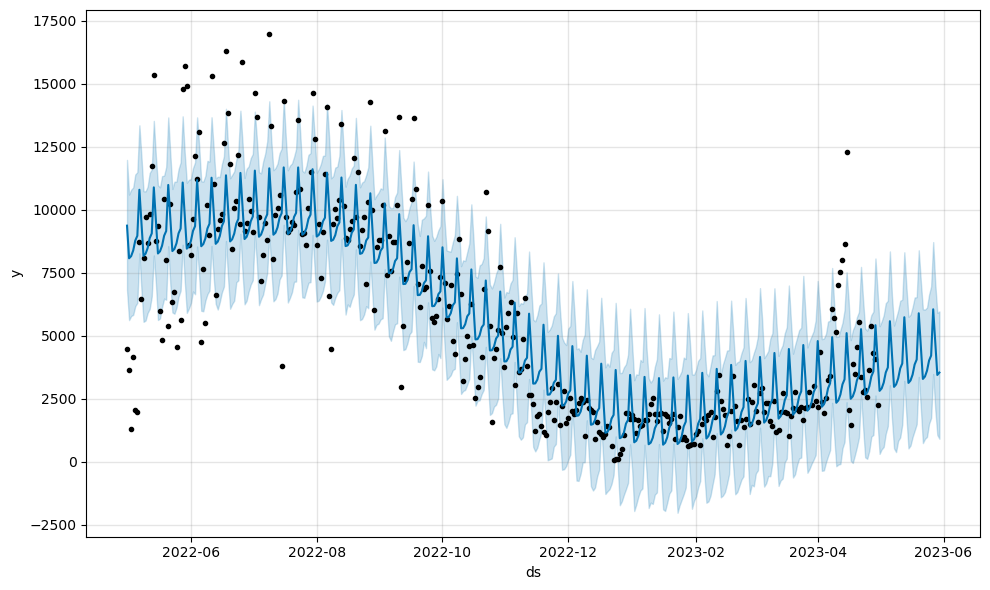

In [5]:
# Erstellen des Prophet-Modells
model = Prophet()
model.fit(cluster_2_daily_rides)

# Erstellen einer Zukunftstabelle für Vorhersagen
future = model.make_future_dataframe(periods=30) # Für 30 Tage in die Zukunft

# Vorhersage treffen
forecast = model.predict(future)

# Visualisierung der Vorhersage
fig = model.plot(forecast)


In [6]:
# Angenommen, cluster_2_daily_rides ist Ihr DataFrame und bereits vorbereitet

# Daten sortieren, falls noch nicht geschehen
cluster_2_daily_rides = cluster_2_daily_rides.sort_values(by='ds')

# Letzten 7 Tage als Testdatensatz
test_days = 7
train_df = cluster_2_daily_rides[:-test_days]
test_df = cluster_2_daily_rides[-test_days:]


In [7]:
model = Prophet()
model.fit(train_df)


10:51:51 - cmdstanpy - INFO - Chain [1] start processing
10:51:51 - cmdstanpy - INFO - Chain [1] done processing


In [8]:
future = model.make_future_dataframe(periods=test_days)
forecast = model.predict(future)


In [21]:
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)

demand_patterns = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    hourly_counts = cluster_data.groupby(['weekday', 'hour']).size()
    total_rides = hourly_counts.sum()
    demand_pattern = hourly_counts / total_rides
    demand_patterns[cluster_id] = demand_pattern


In [22]:
cluster_forecasts = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]

    # Aggregation der Daten auf Wochenbasis und Berechnung des Durchschnitts
    weekly_data = cluster_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
    weekly_data['average_rides'] = weekly_data['count'] / cluster_data['start_station_id'].nunique()

    weekly_data.rename(columns={'started_at': 'ds', 'average_rides': 'y'}, inplace=True)

    model = Prophet()
    model.fit(weekly_data[['ds', 'y']])

    future = model.make_future_dataframe(periods=1, freq='W')
    forecast = model.predict(future)

    cluster_forecasts[cluster_id] = forecast['yhat'].sum()


10:55:49 - cmdstanpy - INFO - Chain [1] start processing
10:55:49 - cmdstanpy - INFO - Chain [1] done processing
10:55:50 - cmdstanpy - INFO - Chain [1] start processing
10:55:50 - cmdstanpy - INFO - Chain [1] done processing
10:55:51 - cmdstanpy - INFO - Chain [1] start processing
10:55:51 - cmdstanpy - INFO - Chain [1] done processing
10:55:52 - cmdstanpy - INFO - Chain [1] start processing
10:55:52 - cmdstanpy - INFO - Chain [1] done processing


In [4]:
cluster_forecasts = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    weekly_data = cluster_data.resample('W', on='started_at').size().reset_index(name='count')
    weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

    model = Prophet()
    model.fit(weekly_data)
    future = model.make_future_dataframe(periods=1, freq='W')
    forecast = model.predict(future)

    cluster_forecasts[cluster_id] = forecast['yhat'].sum()


10:09:53 - cmdstanpy - INFO - Chain [1] start processing
10:09:53 - cmdstanpy - INFO - Chain [1] done processing
10:09:54 - cmdstanpy - INFO - Chain [1] start processing
10:09:54 - cmdstanpy - INFO - Chain [1] done processing
10:09:55 - cmdstanpy - INFO - Chain [1] start processing
10:09:55 - cmdstanpy - INFO - Chain [1] done processing
10:09:55 - cmdstanpy - INFO - Chain [1] start processing
10:09:55 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
station_forecasts = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    
    # Berechnung der durchschnittlichen Anzahl der Fahrten pro Station im Cluster
    total_rides_per_station = cluster_data.groupby('start_station_id')['ride_id'].count()
    average_rides_per_station_in_cluster = total_rides_per_station.mean()

    # Berechnung des Multiplikators für jede Station
    station_multiplier = total_rides_per_station / average_rides_per_station_in_cluster

    weekly_total_forecast = cluster_forecasts[cluster_id]
    demand_pattern = demand_patterns[cluster_id]

    for station_id, multiplier in station_multiplier.items():
        station_forecast = {}
        for (weekday, hour), proportion in demand_pattern.items():
            # Anwendung des Multiplikators auf die anteilige wöchentliche Vorhersage
            forecast_value = weekly_total_forecast * proportion * multiplier
            station_forecast[(weekday, hour)] = round(forecast_value)
        station_forecasts[station_id] = station_forecast


In [23]:
station_forecasts = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    station_multiplier = cluster_data.groupby('start_station_id')['ride_id'].count() / cluster_data['ride_id'].count()

    weekly_total_forecast = cluster_forecasts[cluster_id]
    demand_pattern = demand_patterns[cluster_id]

    for station_id, multiplier in station_multiplier.items():
        station_forecast = {}
        for (weekday, hour), proportion in demand_pattern.items():
            forecast_value = weekly_total_forecast * proportion * multiplier
            # Runden auf die nächste ganze Zahl
            station_forecast[(weekday, hour)] = round(forecast_value)
        station_forecasts[station_id] = station_forecast


In [65]:
station_forecasts = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    station_multiplier = cluster_data.groupby('start_station_id')['ride_id'].count() / cluster_data['ride_id'].count()

    weekly_total_forecast = cluster_forecasts[cluster_id]
    demand_pattern = demand_patterns[cluster_id]

    for station_id, multiplier in station_multiplier.items():
        station_forecast = {}
        for (weekday, hour), proportion in demand_pattern.items():
            forecast_value = weekly_total_forecast * proportion * multiplier
            station_forecast[(weekday, hour)] = forecast_value
        station_forecasts[station_id] = station_forecast



In [97]:

forecasts_dfs = []

# Durchlaufen aller vorhergesagten Daten für jede Station
for station_id, station_forecast in station_forecasts.items():
    # Umwandlung des Vorhersage-Dictionary in einen DataFrame
    # Hier nehmen wir an, dass `station_forecast` ein Dictionary ist mit Schlüsseln als Tupel (weekday, hour)
    forecast_df = pd.DataFrame(station_forecast.items(), columns=['weekday_hour', 'forecast'])
    forecast_df[['weekday', 'hour']] = pd.DataFrame(forecast_df['weekday_hour'].tolist(), index=forecast_df.index)

    # Hinzufügen der Station ID in den DataFrame
    forecast_df['station_id'] = station_id

    # Speichern des DataFrames in der Liste
    forecasts_dfs.append(forecast_df)

# Zusammenführen aller DataFrames in einen großen DataFrame
complete_forecast_df = pd.concat(forecasts_dfs, ignore_index=True)

# Anzeigen der ersten paar Zeilen des resultierenden DataFrames
print(complete_forecast_df.head())


  weekday_hour  forecast  weekday  hour station_id
0       (0, 0)        35        0     0      13008
1       (0, 1)        20        0     1      13008
2       (0, 2)        11        0     2      13008
3       (0, 3)         8        0     3      13008
4       (0, 4)         8        0     4      13008


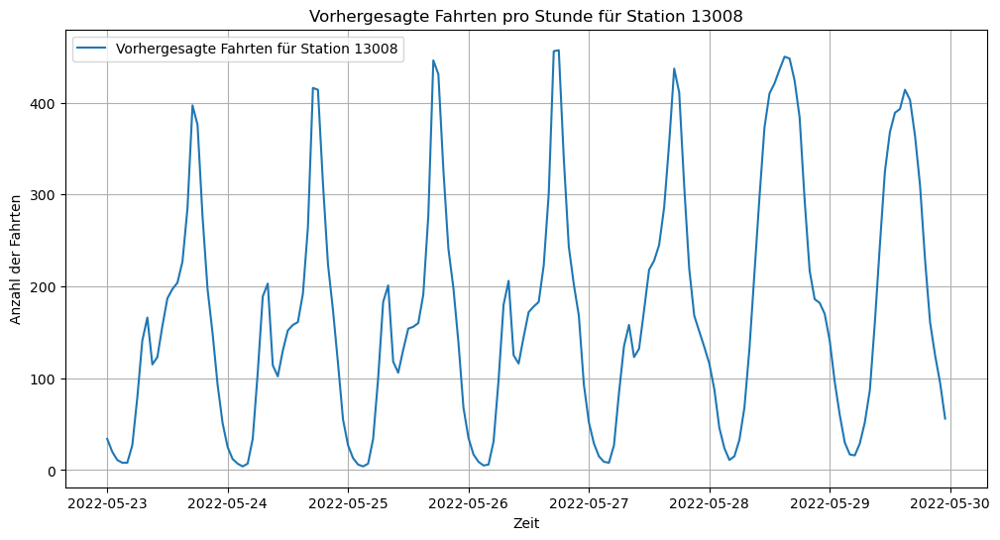

In [49]:
import matplotlib.pyplot as plt

# Wählen Sie die Station und das Cluster für die Visualisierung
selected_station_id = '13008'  # Beispiel-Station-ID

# Erstellen Sie eine Zeitachse und Daten für die ausgewählte Station
time_index = pd.date_range(start='2022-05-23', periods=len(detailed_forecasts[selected_station_id]), freq='H')
forecast_values = list(detailed_forecasts[selected_station_id].values())

# Plot erstellen
plt.figure(figsize=(12, 6))
plt.plot(time_index, forecast_values, label=f'Vorhergesagte Fahrten für Station {selected_station_id}')
plt.title(f'Vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')
plt.xlabel('Zeit')
plt.ylabel('Anzahl der Fahrten')
plt.legend()
plt.grid(True)
plt.show()


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/3790839221.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


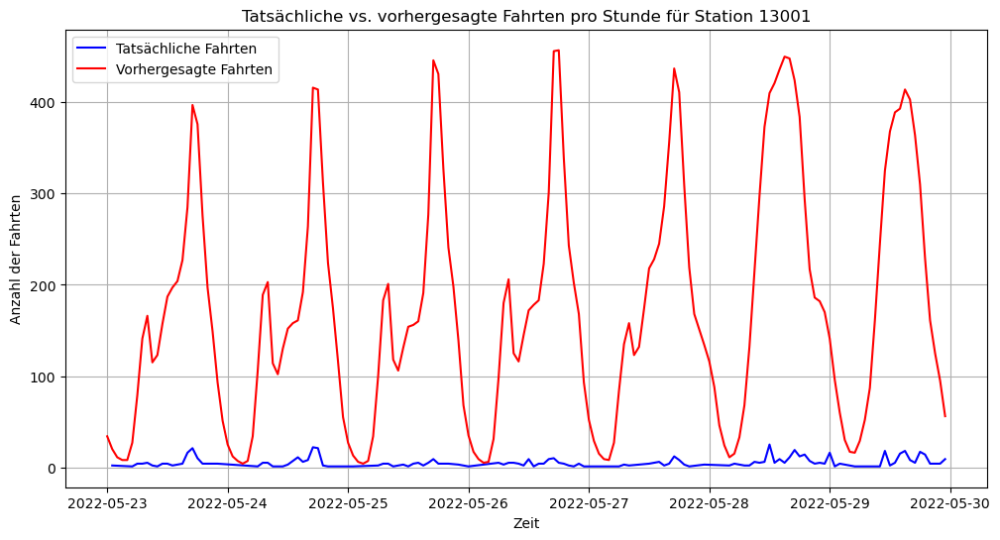

In [50]:
selected_station_id = '13001'

actual_data = df[(df['start_station_id'] == selected_station_id) & 
                 (df['started_at'] >= '2022-05-23') & 
                 (df['started_at'] < '2022-05-30')]  # Passen Sie das Datum entsprechend an

# Aggregieren der Daten nach Stunde
actual_data['hour'] = actual_data['started_at'].dt.floor('H')
actual_rides = actual_data.groupby('hour').size()

plt.figure(figsize=(12, 6))

# Zeitindex für die tatsächlichen Daten (sollte mit dem Vorhersagezeitraum übereinstimmen)
actual_time_index = actual_rides.index

# Tatsächliche Fahrten darstellen
plt.plot(actual_time_index, actual_rides, label='Tatsächliche Fahrten', color='blue')

# Vorhergesagte Fahrten darstellen
plt.plot(time_index, forecast_values, label='Vorhergesagte Fahrten', color='red')

# Titel und Legende
plt.title(f'Tatsächliche vs. vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')
plt.xlabel('Zeit')
plt.ylabel('Anzahl der Fahrten')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
selected_station_id = '13001'

actual_data = df[(df['start_station_id'] == selected_station_id) & 
                 (df['started_at'] >= '2022-05-23') & 
                 (df['started_at'] < '2022-05-30')]  # Passen Sie das Datum entsprechend an

# Aggregieren der Daten nach Stunde
actual_data['hour'] = actual_data['started_at'].dt.floor('H')
actual_rides = actual_data.groupby('hour').size()

plt.figure(figsize=(12, 6))

# Zeitindex für die tatsächlichen Daten (sollte mit dem Vorhersagezeitraum übereinstimmen)
actual_time_index = actual_rides.index

# Tatsächliche Fahrten darstellen
plt.plot(actual_time_index, actual_rides, label='Tatsächliche Fahrten', color='blue')

# Vorhergesagte Fahrten darstellen
plt.plot(time_index, forecast_values, label='Vorhergesagte Fahrten', color='red')

# Titel und Legende
plt.title(f'Tatsächliche vs. vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')
plt.xlabel('Zeit')
plt.ylabel('Anzahl der Fahrten')
plt.legend()
plt.grid(True)
plt.show()


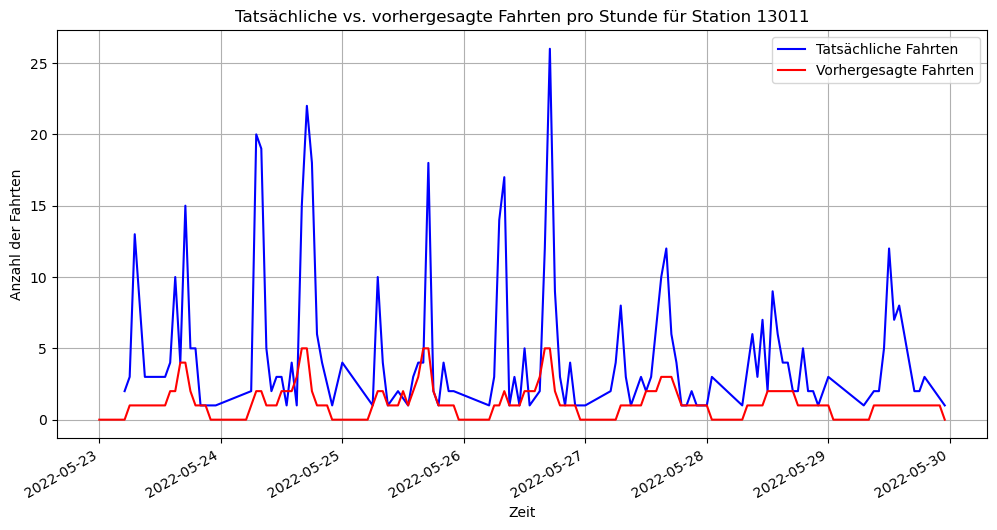

In [28]:
import matplotlib.pyplot as plt
import pandas as pd

# Beispiel Station ID
selected_station_id = '13011'  # Ändern Sie dies entsprechend Ihrer Analyse

# Berechnen des Zeitraums für die tatsächlichen Daten
start_date = '2022-05-23'
end_date = '2022-05-30'

# Extrahieren der tatsächlichen Daten für die ausgewählte Station und den Zeitraum
actual_data = df[(df['start_station_id'] == selected_station_id) & 
                 (df['started_at'] >= start_date) & 
                 (df['started_at'] < end_date)]
actual_rides = actual_data.groupby(actual_data['started_at'].dt.floor('H')).size()

# Vorhersagedaten für die ausgewählte Station
station_forecast = station_forecasts[selected_station_id]
forecast_series = pd.Series(station_forecast)

# Umwandlung der vorhergesagten Daten in einen DataFrame mit einem geeigneten Datetime-Index
forecast_df = pd.DataFrame({'forecast': forecast_series.values}, 
                           index=pd.date_range(start_date, periods=len(forecast_series), freq='H'))

# Erstellen des Plots
plt.figure(figsize=(12, 6))
actual_rides.plot(label='Tatsächliche Fahrten', color='blue')
forecast_df['forecast'].plot(label='Vorhergesagte Fahrten', color='red')

plt.title(f'Tatsächliche vs. vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')
plt.xlabel('Zeit')
plt.ylabel('Anzahl der Fahrten')
plt.legend()
plt.grid(True)
plt.show()


In [114]:
import pandas as pd

# Beispiel-DataFrame
# df = pd.read_your_data_source()

# 1. Datenvorbereitung: Auswahl der relevanten Spalten
relevant_columns = ['start_station_id', 'cluster']

# 2. Häufigkeitsanalyse
# Zählen Sie, wie oft jede Station in jedem Cluster als Start- oder Endstation auftritt
station_counts = df[relevant_columns].melt(id_vars=['cluster'], value_name='station').groupby(['cluster', 'station']).size().reset_index(name='count')

# Sortieren der Daten für Pareto-Analyse
station_counts = station_counts.sort_values(['cluster', 'count'], ascending=[True, False])

# 3. Pareto-Analyse: Ermittlung der kumulativen Prozentzahl und Auswahl der wichtigsten Stationen pro Cluster
station_counts['cumulative_percentage'] = station_counts.groupby('cluster')['count'].apply(lambda x: x.cumsum() / x.sum() * 100)

# Identifizierung der wichtigsten Stationen (z.B. top 20%)
threshold = 20
important_stations = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]

print(important_stations)

     cluster       station  count  cumulative_percentage
98         0        WL-012  21208               3.064408
4          0         13016  20311               5.999205
1          0         13001  19673               8.841816
24         0         13430  19155              11.609580
3          0         13011  18879              14.337463
74         0  TA1305000011  18365              16.991078
90         0  TA1307000151  18149              19.613481
109        1         15544  22246              12.811638
226        2         13022  64538               3.171983
279        2         13300  36139               4.948182
229        2         13042  35001               6.668449
361        2        LF-005  35001               8.388716
422        2  TA1308000050  29769               9.851835
412        2  TA1308000001  29305              11.292149
225        2         13008  28967              12.715850
386        2  TA1307000039  27358              14.060471
250        2         13146  231

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/1726000125.py:17: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  station_counts['cumulative_percentage'] = station_counts.groupby('cluster')['count'].apply(lambda x: x.cumsum() / x.sum() * 100)
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/1726000125.py:21: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt

In [127]:


# Annahme: 'hourly_forecasts' ist das Dictionary mit den Prophet-Vorhersagen für jede wichtige Station
# Identifizierung der wichtigsten Stationen basierend auf der Pareto-Analyse (z.B. top 20%)
threshold = 20
important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]

# Extrahieren der eindeutigen Stationen-IDs als Liste
important_station_ids = important_stations_df['station'].unique()

# Annahme: df ist bereits vorbereitet und enthält 'start_station_id' und 'started_at'
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek

# Identifizierung der wichtigen Stationen (basierend auf Ihrer vorherigen Pareto-Analyse)
important_stations = important_station_ids

hourly_forecasts = {}
for station_id in important_stations:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf stündlicher Basis
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(hourly_data[['ds', 'y']])

    # Erstelle zukünftige Datenreihe für die Vorhersagen (für die nächsten 7 Tage)
    future = model.make_future_dataframe(periods=168, freq='H')  # 7 Tage * 24 Stunden = 168 Stunden
    forecast = model.predict(future)

    # Extrahiere die Vorhersagen für die benötigte Zeitspanne
    hourly_forecasts[station_id] = forecast[['ds', 'yhat']][-168:]

# 'hourly_forecasts' enthält nun die stündlichen Vorhersagen für die nächsten 7 Tage für jede wichtige Station



/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/524575755.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
13:52:17 - cmdstanpy - INFO - Chain [1] start processing
13:52:17 - cmdstanpy - INFO - Chain [1] done processing
13:52:19 - cmdstanpy - INFO - Chain [1] start processing
13:52:19 - cmdstanpy - INFO - Chain [1] done processing
13:52:22 - cmdstanpy - INFO - Chain [1] start processing
13:52:22 - cmdstanpy - INFO - Chain [1] done processing
13:52:24 - cmdstanpy - INFO - Chain [1] start proce

14:04:53 - cmdstanpy - INFO - Chain [1] start processing
14:04:54 - cmdstanpy - INFO - Chain [1] done processing


Station WL-012 - MSE: 13.26021523825008, MAE: 2.4827001807513516


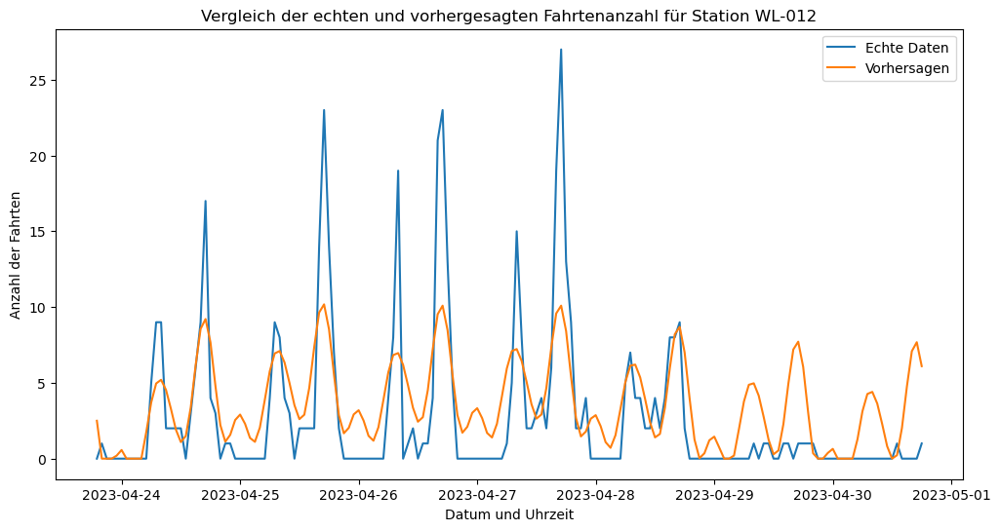

14:04:56 - cmdstanpy - INFO - Chain [1] start processing
14:04:56 - cmdstanpy - INFO - Chain [1] done processing


Station 13016 - MSE: 3.4540183502048234, MAE: 1.2847839745272283


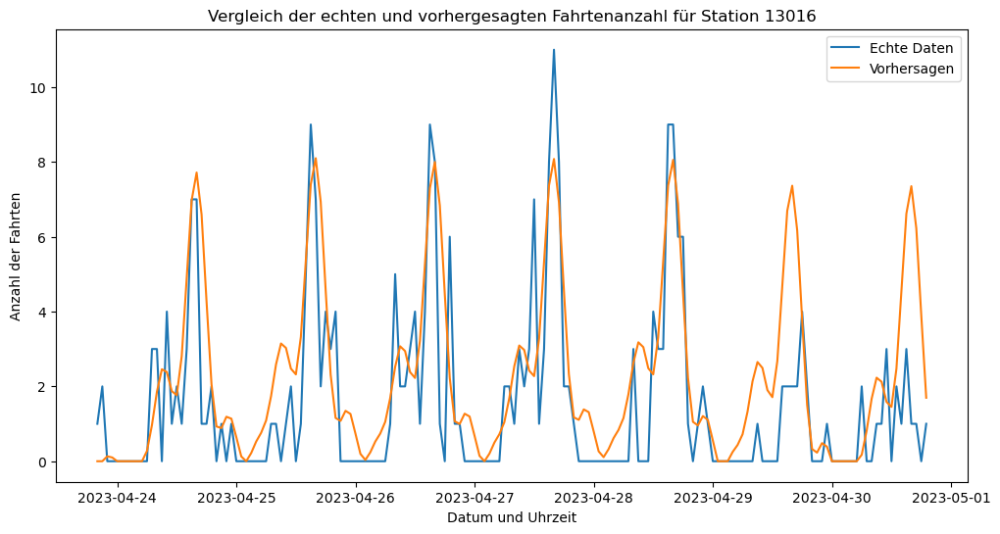

14:04:59 - cmdstanpy - INFO - Chain [1] start processing
14:04:59 - cmdstanpy - INFO - Chain [1] done processing


Station 13001 - MSE: 2.856773538230604, MAE: 1.2293900575368024


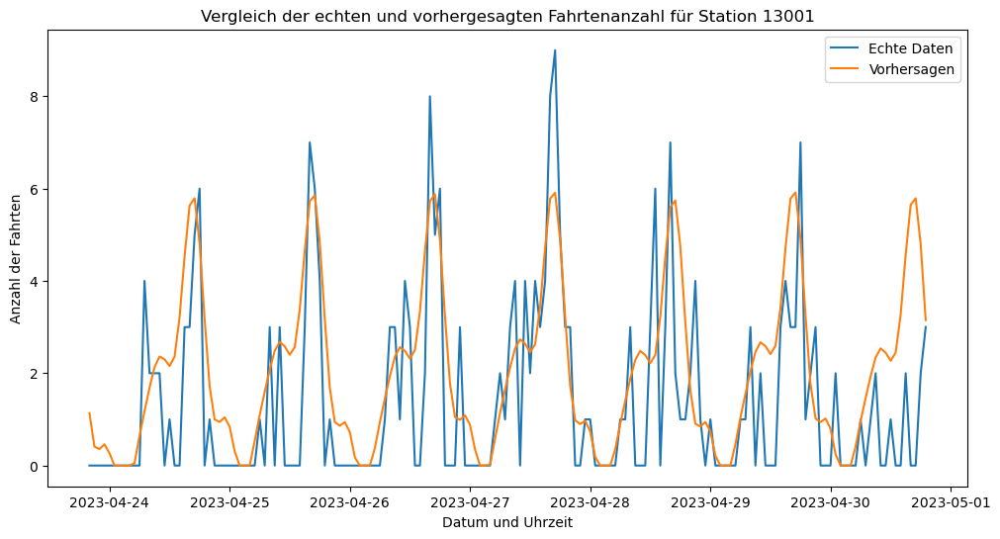

14:05:01 - cmdstanpy - INFO - Chain [1] start processing
14:05:01 - cmdstanpy - INFO - Chain [1] done processing


Station 13430 - MSE: 4.486766619822307, MAE: 1.5397281088162487


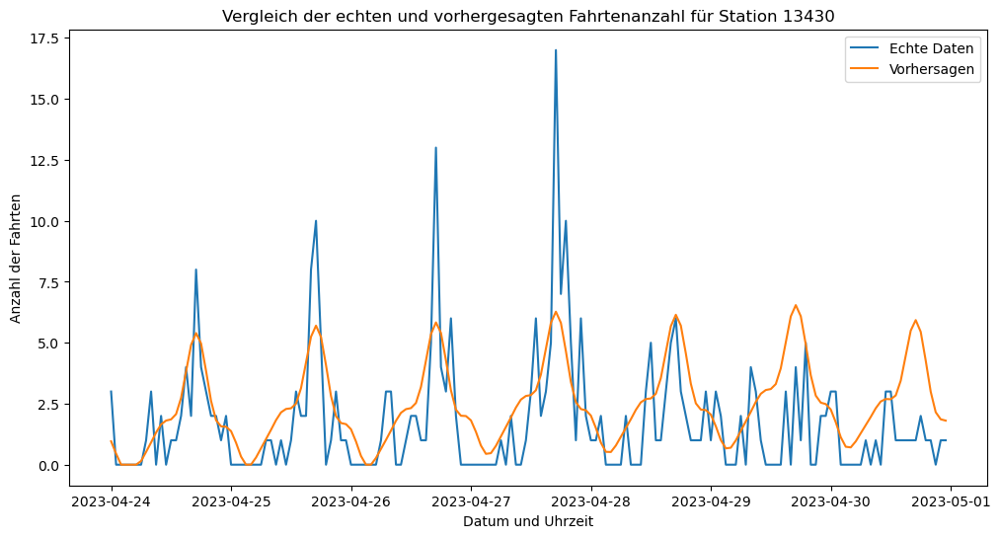

14:05:04 - cmdstanpy - INFO - Chain [1] start processing
14:05:04 - cmdstanpy - INFO - Chain [1] done processing


Station 13011 - MSE: 7.09567863842317, MAE: 1.9012014535571768


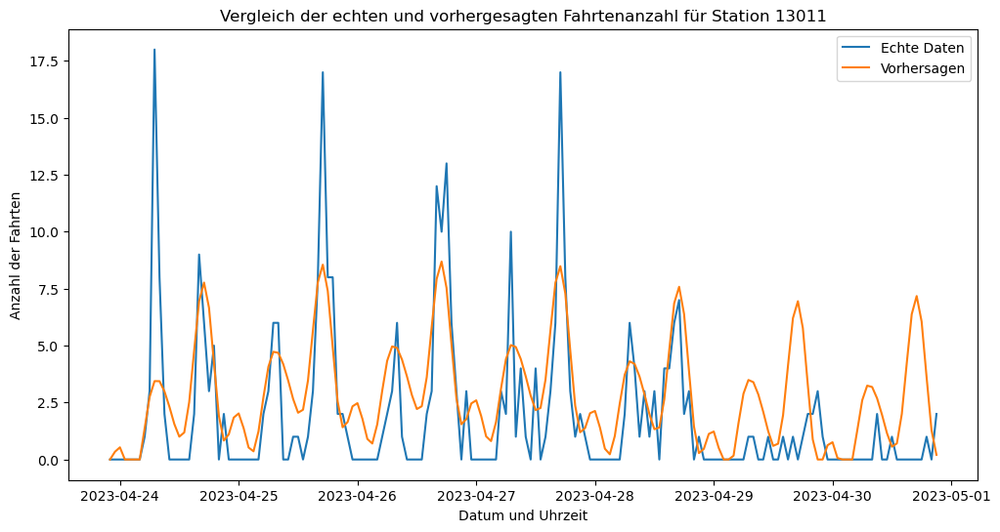

14:05:06 - cmdstanpy - INFO - Chain [1] start processing
14:05:07 - cmdstanpy - INFO - Chain [1] done processing


Station TA1305000011 - MSE: 3.0629350627529845, MAE: 1.343777472894864


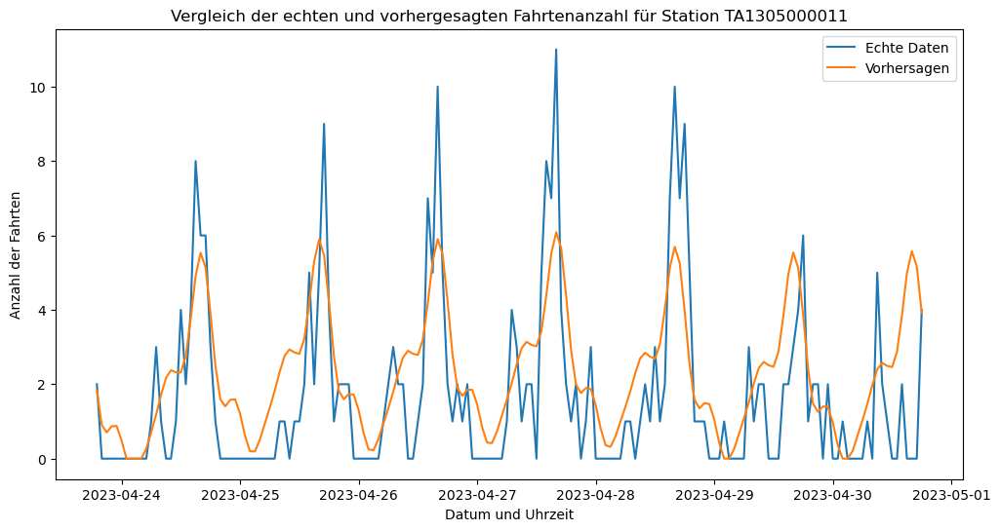

14:05:09 - cmdstanpy - INFO - Chain [1] start processing
14:05:09 - cmdstanpy - INFO - Chain [1] done processing


Station TA1307000151 - MSE: 4.9673568487299935, MAE: 1.6042656392493755


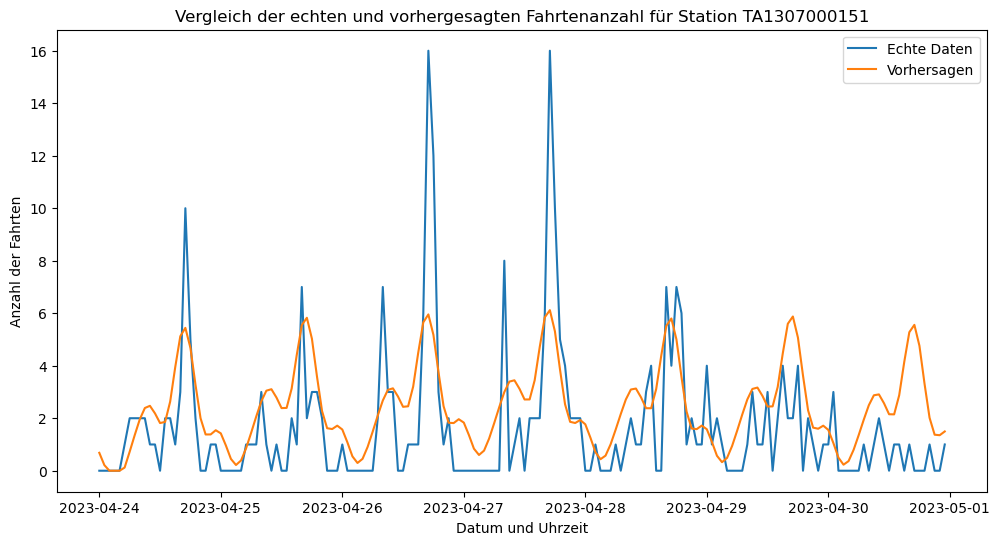

14:05:12 - cmdstanpy - INFO - Chain [1] start processing
14:05:12 - cmdstanpy - INFO - Chain [1] done processing


Station 15544 - MSE: 9.2505921709811, MAE: 1.6411810563458982


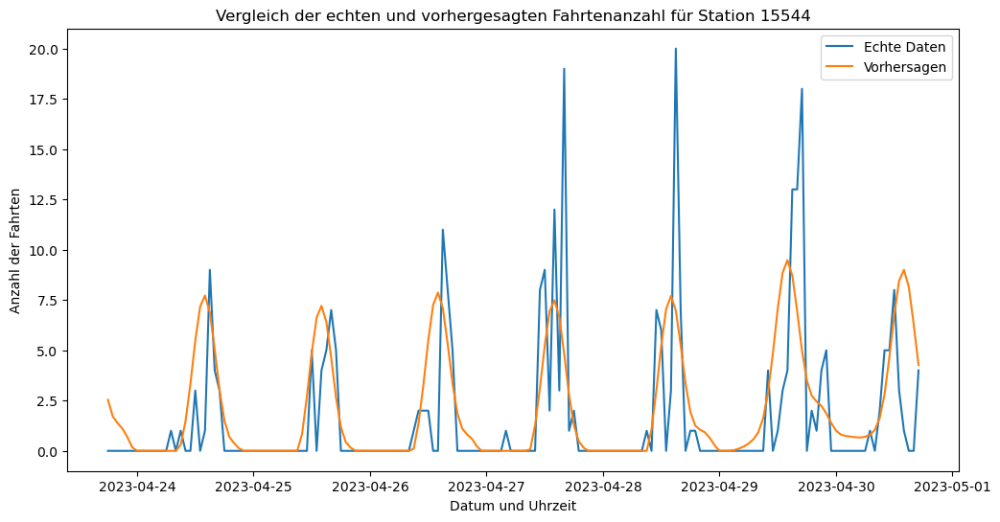

14:05:14 - cmdstanpy - INFO - Chain [1] start processing
14:05:15 - cmdstanpy - INFO - Chain [1] done processing


Station 13022 - MSE: 27.766310049840133, MAE: 3.3093159241145584


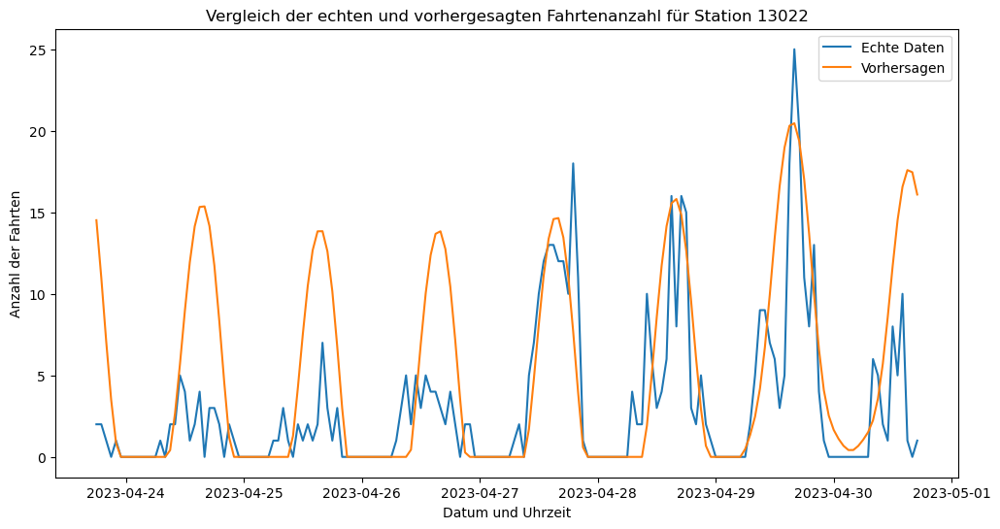

14:05:17 - cmdstanpy - INFO - Chain [1] start processing
14:05:17 - cmdstanpy - INFO - Chain [1] done processing


Station 13300 - MSE: 12.630308135627107, MAE: 2.333439357068573


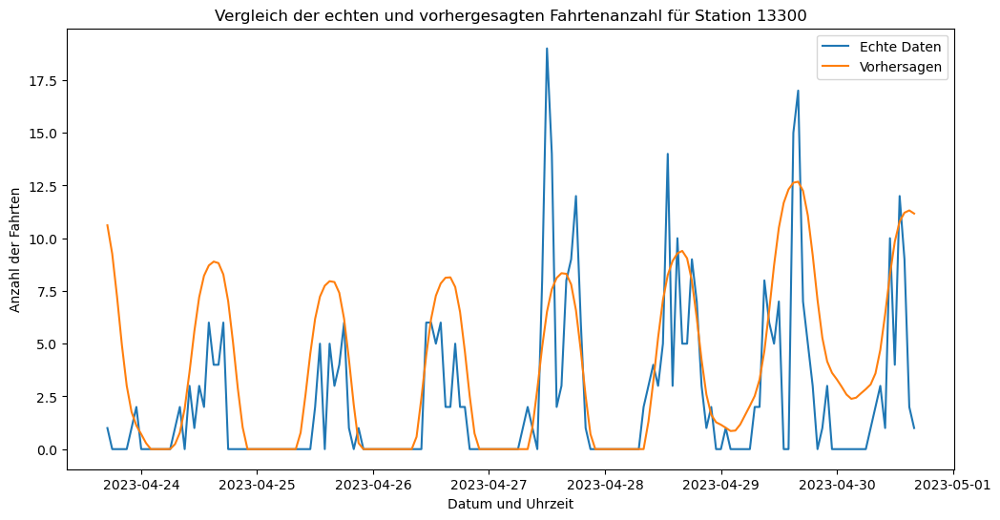

14:05:20 - cmdstanpy - INFO - Chain [1] start processing
14:05:20 - cmdstanpy - INFO - Chain [1] done processing


Station 13042 - MSE: 10.759503195649595, MAE: 2.1217405060467707


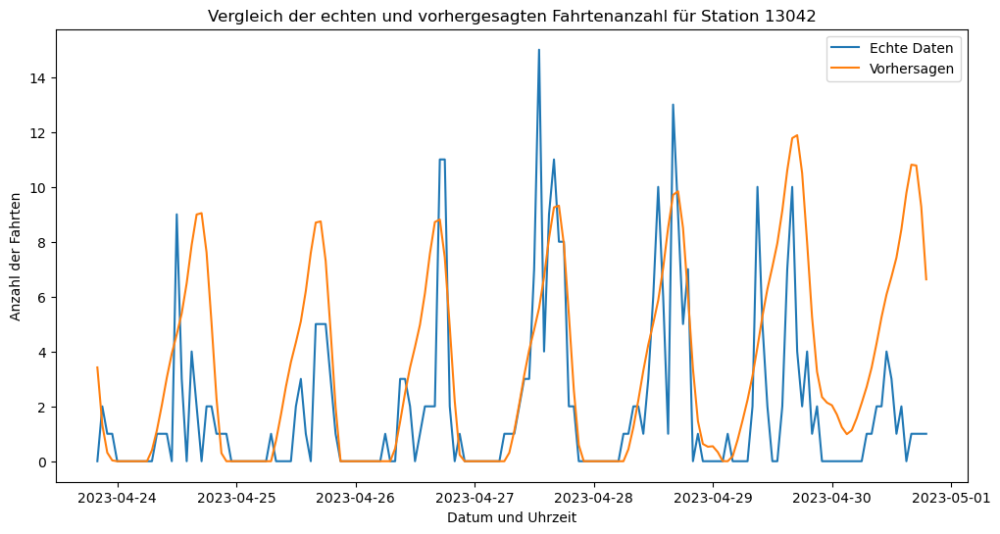

14:05:22 - cmdstanpy - INFO - Chain [1] start processing
14:05:22 - cmdstanpy - INFO - Chain [1] done processing


Station LF-005 - MSE: 9.802608135598561, MAE: 2.05938083571419


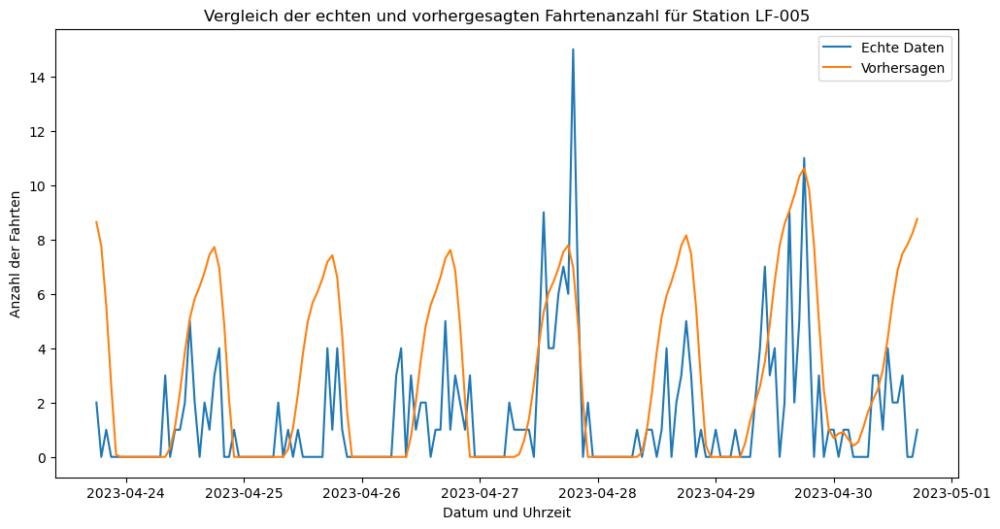

14:05:25 - cmdstanpy - INFO - Chain [1] start processing
14:05:25 - cmdstanpy - INFO - Chain [1] done processing


Station TA1308000050 - MSE: 8.284236633775457, MAE: 2.1156820791597473


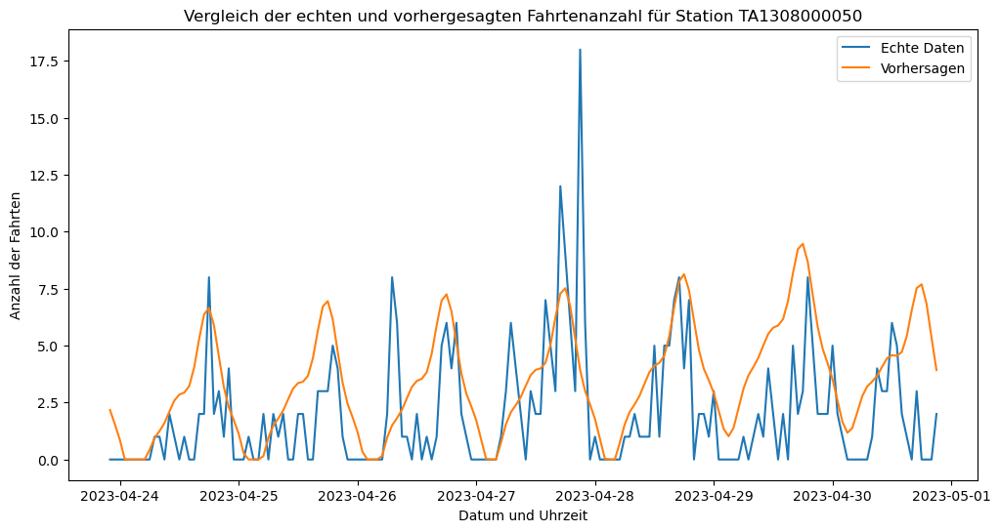

14:05:28 - cmdstanpy - INFO - Chain [1] start processing
14:05:28 - cmdstanpy - INFO - Chain [1] done processing


Station TA1308000001 - MSE: 6.634568127618921, MAE: 1.6418240592584912


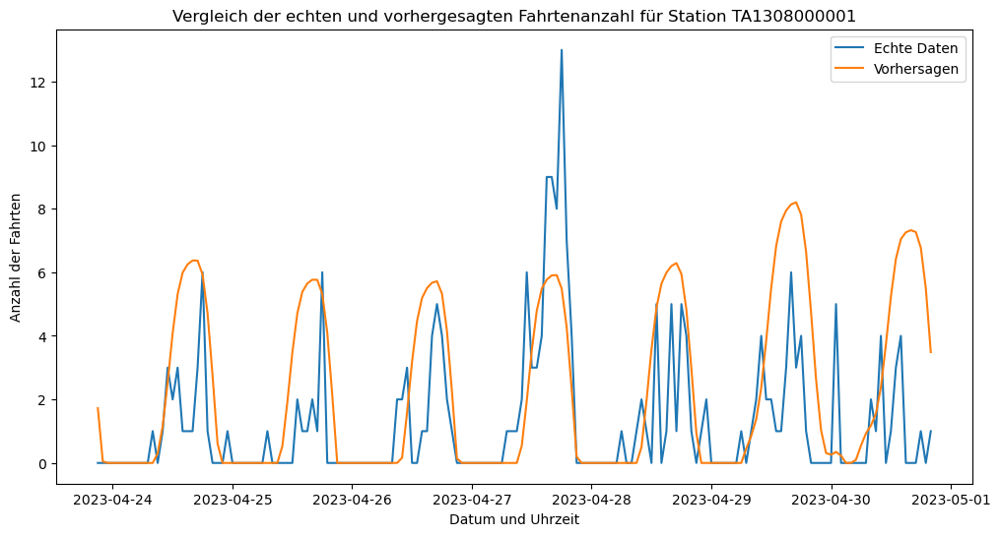

14:05:30 - cmdstanpy - INFO - Chain [1] start processing
14:05:30 - cmdstanpy - INFO - Chain [1] done processing


Station 13008 - MSE: 6.495250888325155, MAE: 1.6240999734117354


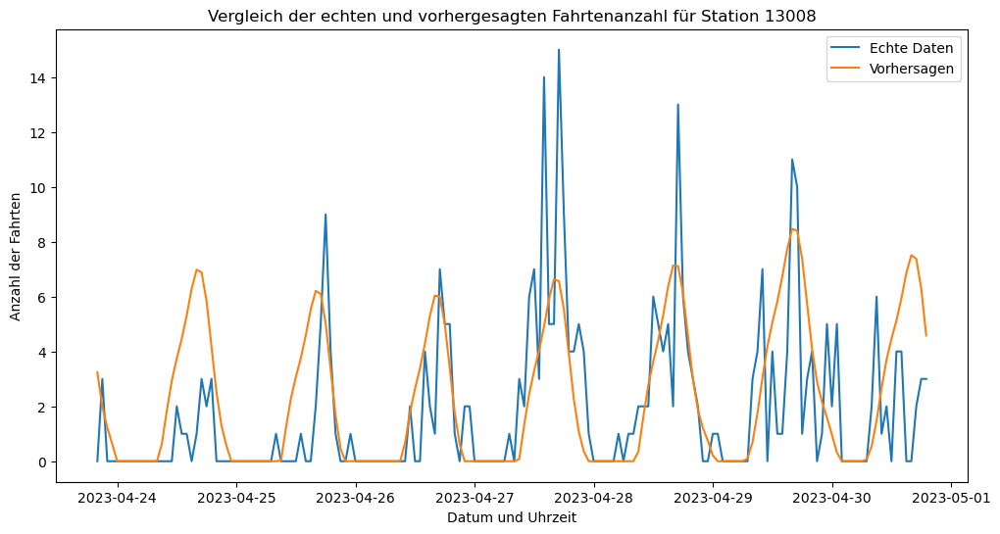

14:05:33 - cmdstanpy - INFO - Chain [1] start processing
14:05:33 - cmdstanpy - INFO - Chain [1] done processing


Station TA1307000039 - MSE: 6.800562758235519, MAE: 2.1415248214837055


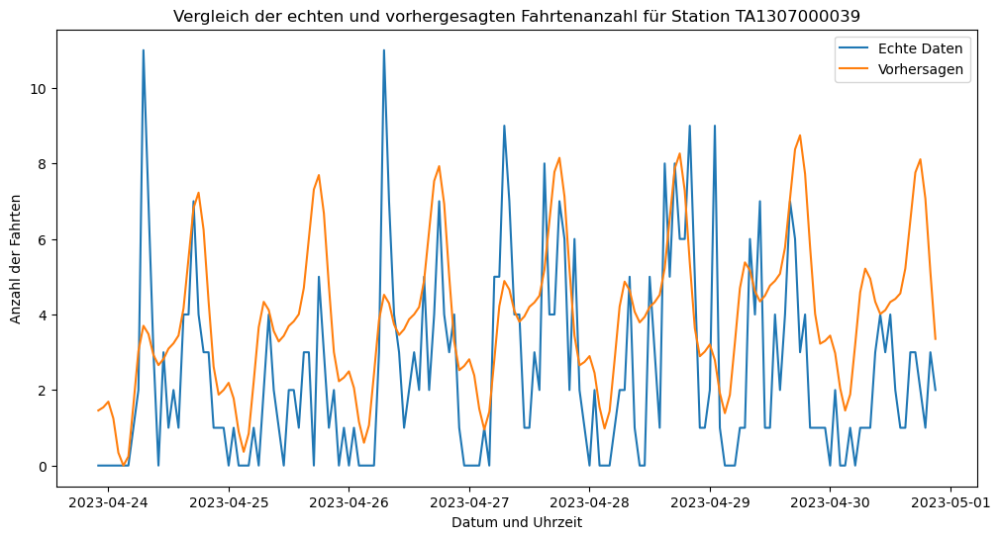

14:05:36 - cmdstanpy - INFO - Chain [1] start processing
14:05:36 - cmdstanpy - INFO - Chain [1] done processing


Station 13146 - MSE: 4.7013687127831, MAE: 1.5860784575462854


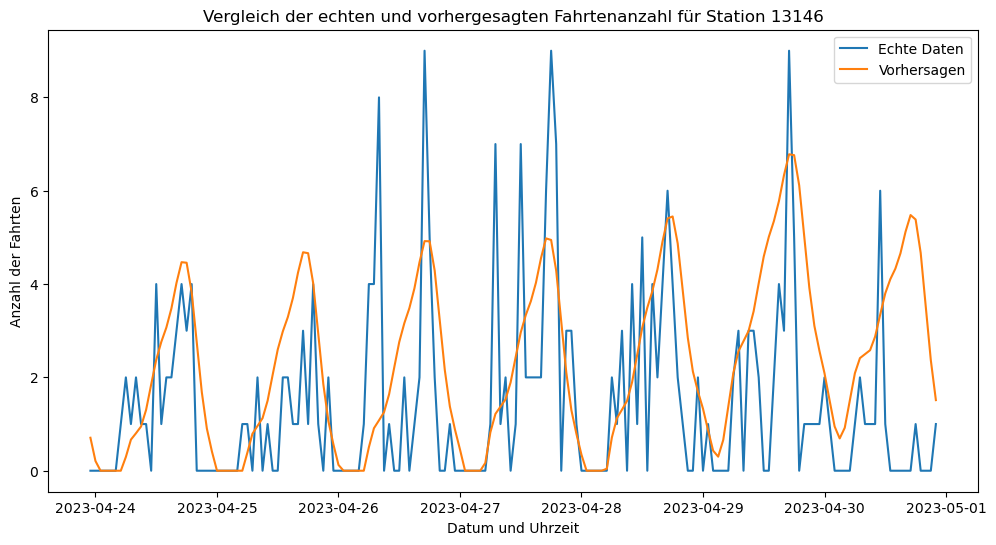

14:05:38 - cmdstanpy - INFO - Chain [1] start processing
14:05:39 - cmdstanpy - INFO - Chain [1] done processing


Station SL-005 - MSE: 6.128895789353289, MAE: 1.8401559644272782


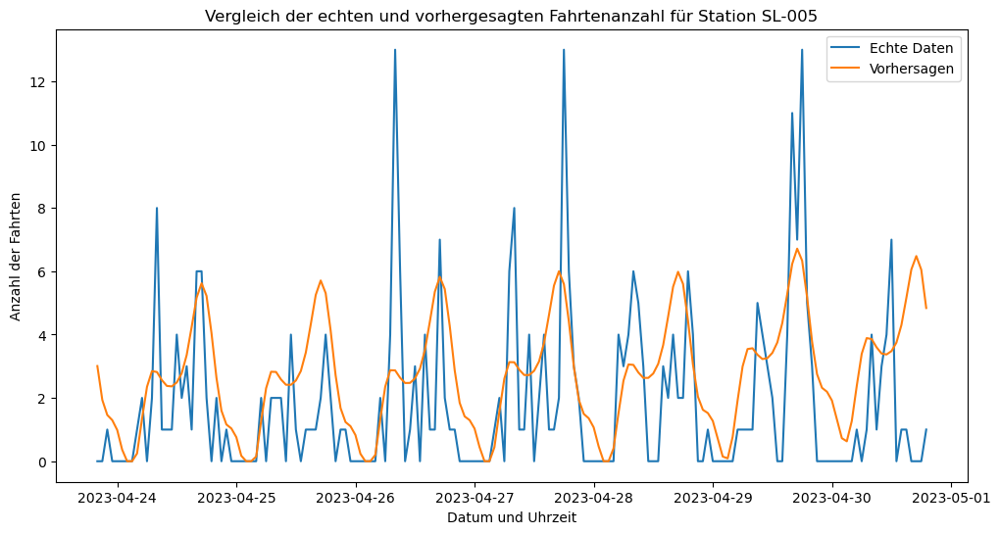

14:05:41 - cmdstanpy - INFO - Chain [1] start processing
14:05:41 - cmdstanpy - INFO - Chain [1] done processing


Station KA1504000135 - MSE: 4.401830563455251, MAE: 1.6231815550041429


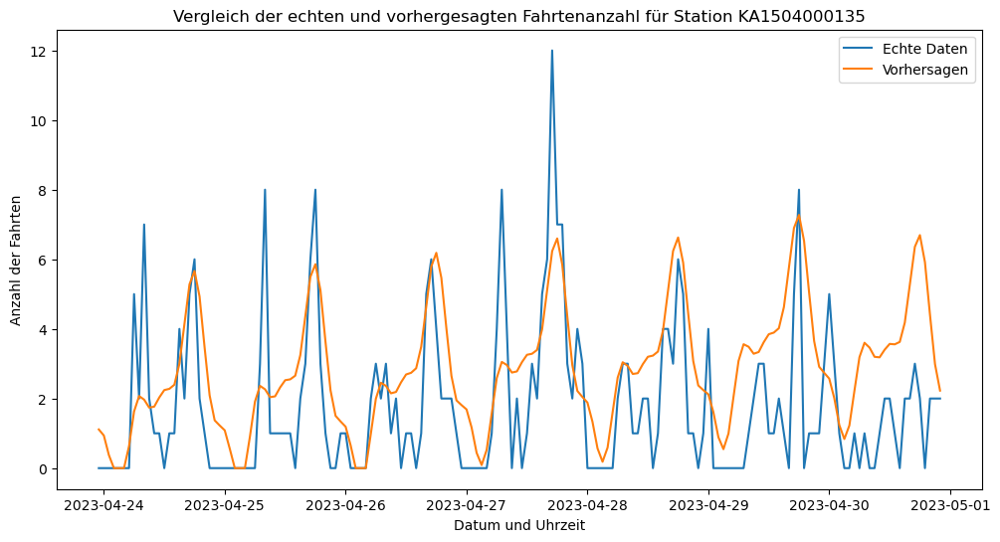

14:05:43 - cmdstanpy - INFO - Chain [1] start processing
14:05:44 - cmdstanpy - INFO - Chain [1] done processing


Station 13179 - MSE: 5.7990889210750725, MAE: 1.867492869328394


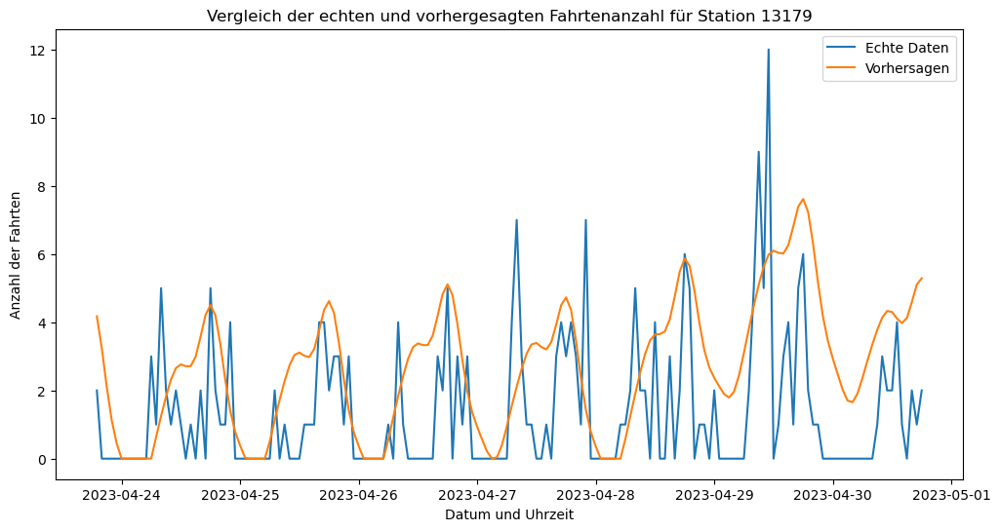

14:05:46 - cmdstanpy - INFO - Chain [1] start processing
14:05:46 - cmdstanpy - INFO - Chain [1] done processing


Station 13137 - MSE: 4.665001301371334, MAE: 1.557019175539103


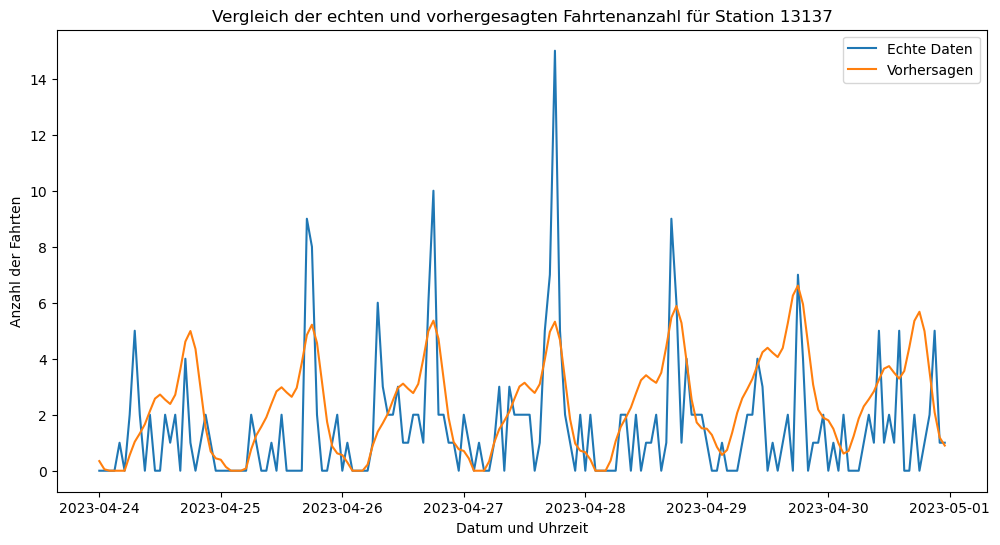

14:05:49 - cmdstanpy - INFO - Chain [1] start processing
14:05:49 - cmdstanpy - INFO - Chain [1] done processing


Station KA1503000043 - MSE: 5.055507610813635, MAE: 1.7255477167550763


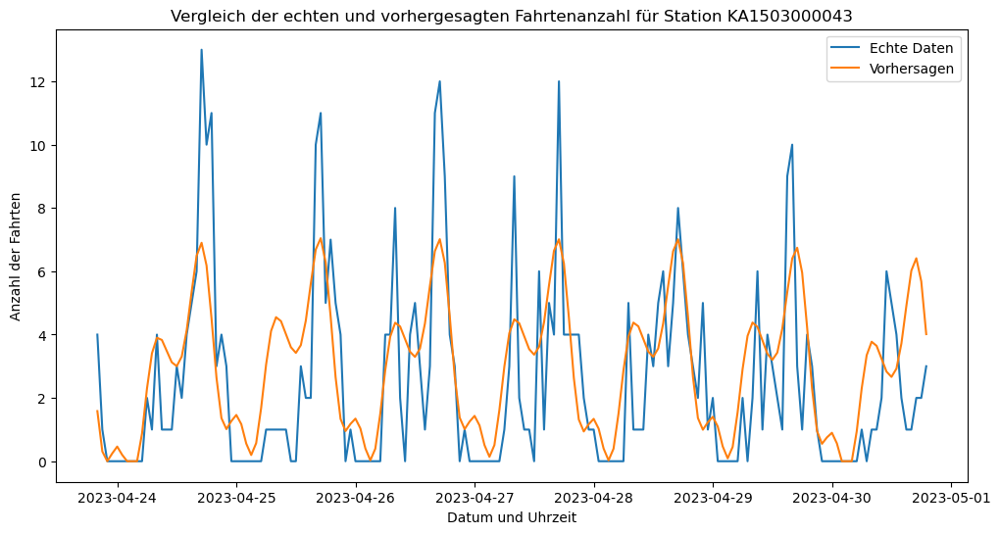

14:05:51 - cmdstanpy - INFO - Chain [1] start processing
14:05:52 - cmdstanpy - INFO - Chain [1] done processing


Station TA1305000032 - MSE: 5.340204744005352, MAE: 1.7753905664125031


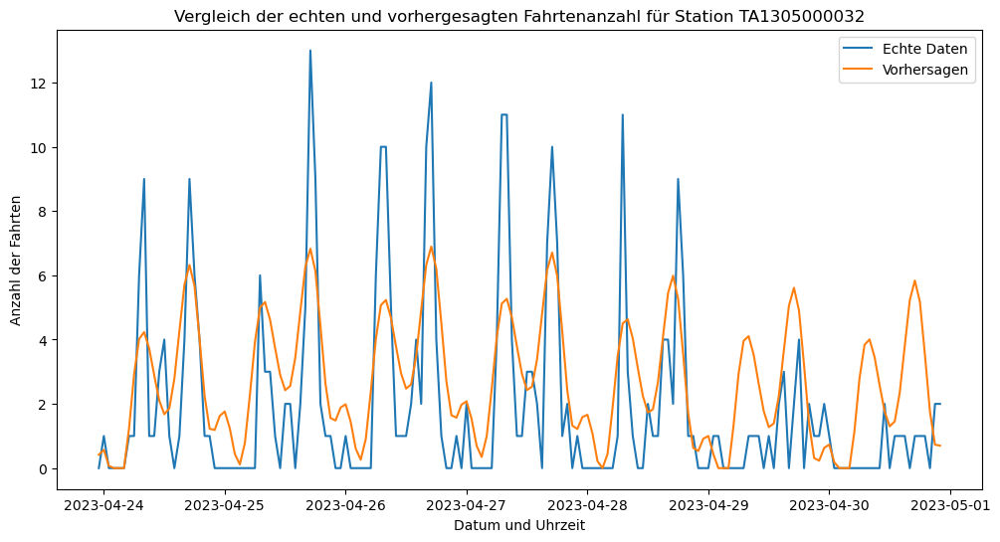

14:05:54 - cmdstanpy - INFO - Chain [1] start processing
14:05:54 - cmdstanpy - INFO - Chain [1] done processing


Station 13045 - MSE: 3.10171855536806, MAE: 1.3914131242547105


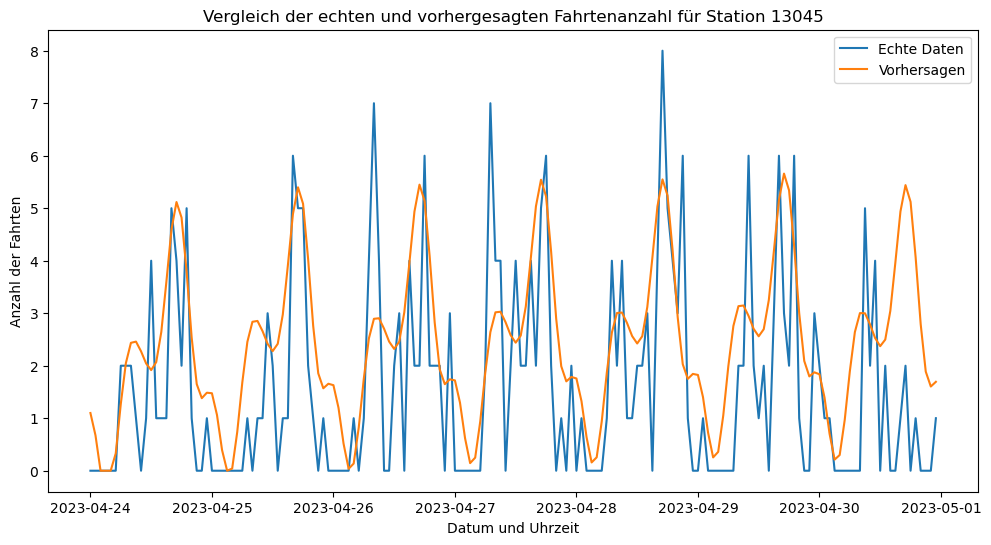

14:05:57 - cmdstanpy - INFO - Chain [1] start processing
14:05:57 - cmdstanpy - INFO - Chain [1] done processing


Station TA1306000012 - MSE: 3.357546420655379, MAE: 1.3597460421267078


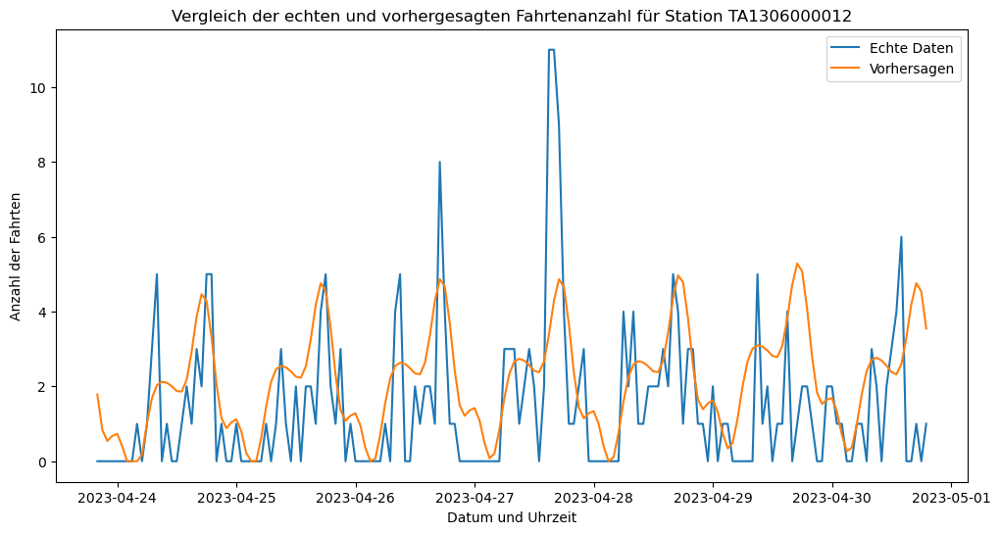

14:05:59 - cmdstanpy - INFO - Chain [1] start processing
14:06:00 - cmdstanpy - INFO - Chain [1] done processing


Station 13061 - MSE: 3.818288713330883, MAE: 1.6106258283095256


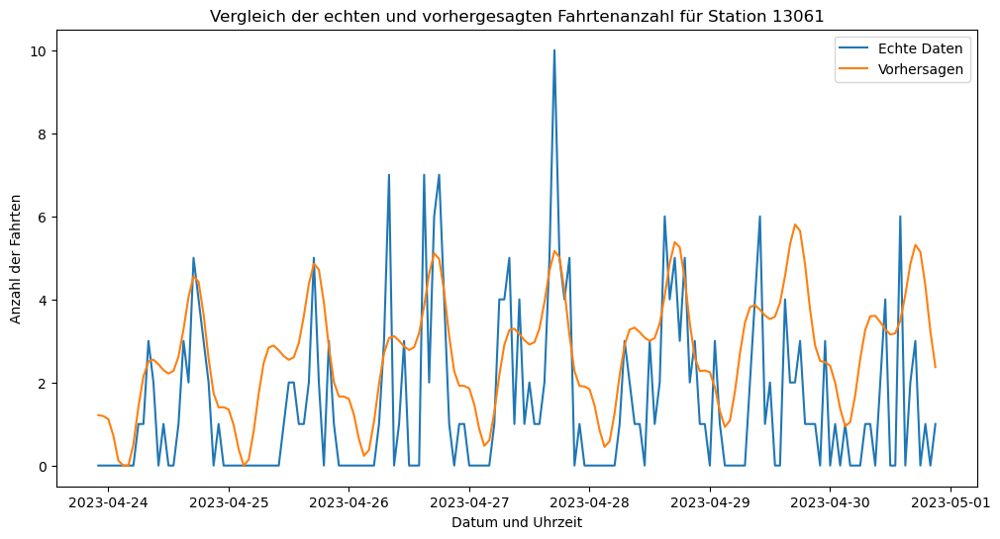

14:06:02 - cmdstanpy - INFO - Chain [1] start processing
14:06:02 - cmdstanpy - INFO - Chain [1] done processing


Station 13263 - MSE: 5.1441783140952415, MAE: 1.4719045989016637


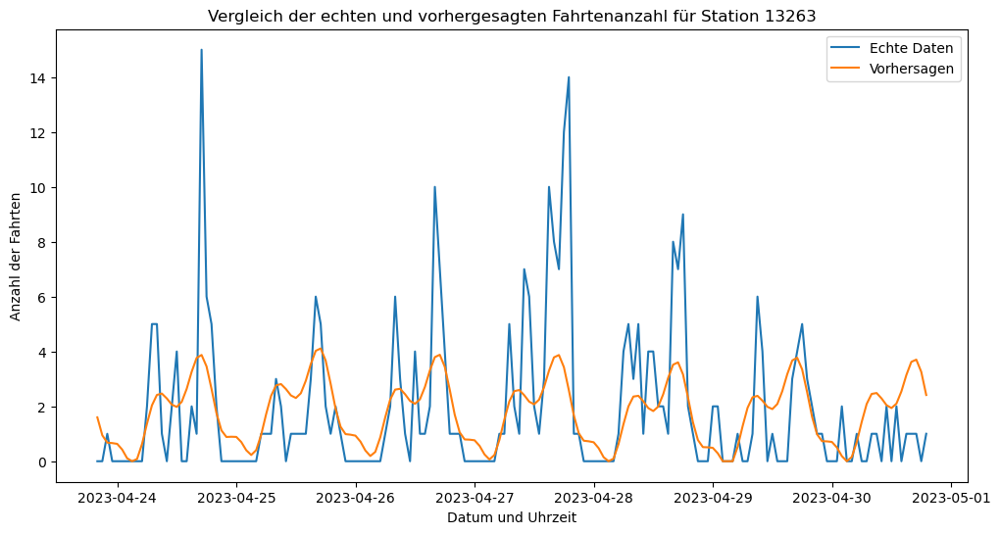

14:06:05 - cmdstanpy - INFO - Chain [1] start processing
14:06:05 - cmdstanpy - INFO - Chain [1] done processing


Station SL-008 - MSE: 1.6438375660976234, MAE: 0.9744990215055238


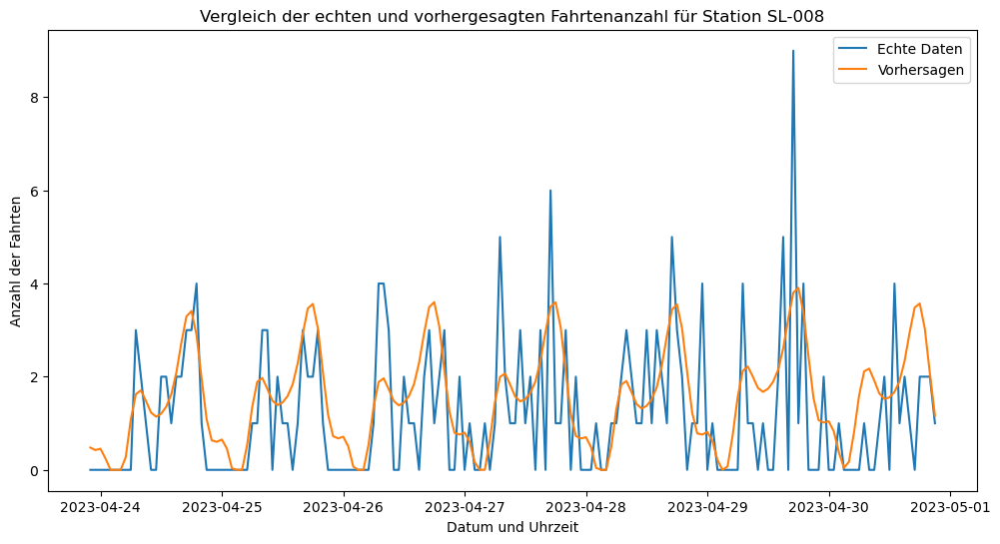

In [131]:


# Annahme: df ist bereits vorbereitet und enthält 'start_station_id' und 'started_at'
df['started_at'] = pd.to_datetime(df['started_at'])

for station_id in important_stations:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf stündlicher Basis und Vorbereitung der Zeitreihen-Daten
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Aufteilen der Daten in Trainings- und Testdatensätze
    test_size = 168  # 7 Tage * 24 Stunden
    train_data = hourly_data[:-test_size]
    test_data = hourly_data[-test_size:]

    # Trainieren des Prophet-Modells mit dem Trainingsdatensatz
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    # Vorhersage für den Zeitraum des Testdatensatzes
    future = model.make_future_dataframe(periods=test_size, freq='H')
    forecast = model.predict(future)

    # Vorhersagewerte anpassen, um negative Zahlen zu verhindern
    forecast['yhat'] = forecast['yhat'].clip(lower=0)

    # Extrahiere die angepassten Vorhersagen und die tatsächlichen Werte für den Vergleich
    forecasted_values = forecast['yhat'][-test_size:]
    actual_values = test_data['y']

    # Berechnung der Fehlermetriken
    mse = mean_squared_error(actual_values, forecasted_values)
    mae = mean_absolute_error(actual_values, forecasted_values)
    print(f"Station {station_id} - MSE: {mse}, MAE: {mae}")

    # Erstellen des Schaubilds für den Vergleich
    plt.figure(figsize=(12, 6))
    plt.plot(test_data['ds'], actual_values, label='Echte Daten')
    plt.plot(test_data['ds'], forecasted_values, label='Vorhersagen')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()


In [141]:
from statistics import mean

# Annahme: 'df' und 'demand_patterns' sind bereits vorbereitet
df['started_at'] = pd.to_datetime(df['started_at'])

# Berechnung der Fahrtanzahl pro Woche und Stunde für die wichtigen Stationen
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf Wochenbasis und Vorbereitung der Zeitreihen-Daten
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Aufteilen der Daten in Trainings- und Testdatensätze (z.B. die letzten 4 Wochen als Testdatensatz)
    test_size = 4  # 4 Wochen
    train_data = weekly_data[:-test_size]
    test_data = weekly_data[-test_size:]

    # Trainieren des Prophet-Modells mit dem Trainingsdatensatz
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    # Erstelle zukünftige Datenreihe für die Vorhersagen
    future = model.make_future_dataframe(periods=test_size, freq='W')
    forecast = model.predict(future)

    # Berechnung der angepassten stündlichen Vorhersagewerte basierend auf den Nachfragemustern
    cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
    demand_pattern = demand_patterns[cluster_id]
    
    forecast['yhat'] = forecast['yhat'].clip(lower=0)  # Verhindern negativer Werte
    adjusted_forecast = {}
    for index, row in forecast.iterrows():
        week_forecast = row['yhat']
        for (weekday, hour), proportion in demand_pattern.items():
            forecast_value = week_forecast * proportion
            adjusted_forecast[(row['ds'].date(), weekday, hour)] = round(forecast_value)

    # Extrahieren Sie die tatsächlichen Werte für den Testzeitraum zur Bewertung
    actual_data_hourly = station_data.set_index('started_at').resample('H').size()
    mse_values = []
    mae_values = []
    for (date, weekday, hour), forecast_value in adjusted_forecast.items():
        actual_value = actual_data_hourly.get(pd.Timestamp(date) + pd.Timedelta(hours=hour), 0)
        mse_values.append((actual_value - forecast_value) ** 2)
        mae_values.append(abs(actual_value - forecast_value))

    mse = mean(mse_values)
    mae = mean(mae_values)
    print(f"Station {station_id} - MSE: {mse}, MAE: {mae}")


14:55:56 - cmdstanpy - INFO - Chain [1] start processing
14:55:56 - cmdstanpy - INFO - Chain [1] done processing


Station WL-012 - MSE: 11, MAE: 2


14:55:57 - cmdstanpy - INFO - Chain [1] start processing
14:55:57 - cmdstanpy - INFO - Chain [1] done processing


Station 13016 - MSE: 7, MAE: 1


14:55:57 - cmdstanpy - INFO - Chain [1] start processing
14:55:58 - cmdstanpy - INFO - Chain [1] done processing
14:55:58 - cmdstanpy - INFO - Chain [1] start processing


Station 13001 - MSE: 9, MAE: 1


14:55:58 - cmdstanpy - INFO - Chain [1] done processing


Station 13430 - MSE: 8, MAE: 1


14:55:59 - cmdstanpy - INFO - Chain [1] start processing
14:55:59 - cmdstanpy - INFO - Chain [1] done processing
14:56:00 - cmdstanpy - INFO - Chain [1] start processing


Station 13011 - MSE: 7, MAE: 1


14:56:00 - cmdstanpy - INFO - Chain [1] done processing
14:56:01 - cmdstanpy - INFO - Chain [1] start processing


Station TA1305000011 - MSE: 7, MAE: 1


14:56:01 - cmdstanpy - INFO - Chain [1] done processing
14:56:02 - cmdstanpy - INFO - Chain [1] start processing


Station TA1307000151 - MSE: 8, MAE: 1


14:56:02 - cmdstanpy - INFO - Chain [1] done processing


Station 15544 - MSE: 29, MAE: 2


14:56:02 - cmdstanpy - INFO - Chain [1] start processing
14:56:03 - cmdstanpy - INFO - Chain [1] done processing
14:56:04 - cmdstanpy - INFO - Chain [1] start processing


Station 13022 - MSE: 151, MAE: 6


14:56:04 - cmdstanpy - INFO - Chain [1] done processing
14:56:04 - cmdstanpy - INFO - Chain [1] start processing


Station 13300 - MSE: 66, MAE: 4


14:56:04 - cmdstanpy - INFO - Chain [1] done processing
14:56:05 - cmdstanpy - INFO - Chain [1] start processing


Station 13042 - MSE: 42, MAE: 3


14:56:05 - cmdstanpy - INFO - Chain [1] done processing
14:56:05 - cmdstanpy - INFO - Chain [1] start processing


Station LF-005 - MSE: 68, MAE: 3


14:56:06 - cmdstanpy - INFO - Chain [1] done processing
14:56:06 - cmdstanpy - INFO - Chain [1] start processing


Station TA1308000050 - MSE: 22, MAE: 2


14:56:06 - cmdstanpy - INFO - Chain [1] done processing
14:56:07 - cmdstanpy - INFO - Chain [1] start processing
14:56:07 - cmdstanpy - INFO - Chain [1] done processing


Station TA1308000001 - MSE: 57, MAE: 3


14:56:07 - cmdstanpy - INFO - Chain [1] start processing


Station 13008 - MSE: 25, MAE: 2


14:56:07 - cmdstanpy - INFO - Chain [1] done processing
14:56:08 - cmdstanpy - INFO - Chain [1] start processing


Station TA1307000039 - MSE: 11, MAE: 2


14:56:08 - cmdstanpy - INFO - Chain [1] done processing
14:56:09 - cmdstanpy - INFO - Chain [1] start processing


Station 13146 - MSE: 17, MAE: 2


14:56:09 - cmdstanpy - INFO - Chain [1] done processing


Station SL-005 - MSE: 14, MAE: 2


14:56:10 - cmdstanpy - INFO - Chain [1] start processing
14:56:10 - cmdstanpy - INFO - Chain [1] done processing


Station KA1504000135 - MSE: 13, MAE: 2


14:56:11 - cmdstanpy - INFO - Chain [1] start processing
14:56:11 - cmdstanpy - INFO - Chain [1] done processing


Station 13179 - MSE: 17, MAE: 2


14:56:12 - cmdstanpy - INFO - Chain [1] start processing
14:56:12 - cmdstanpy - INFO - Chain [1] done processing
14:56:13 - cmdstanpy - INFO - Chain [1] start processing


Station 13137 - MSE: 8, MAE: 1


14:56:13 - cmdstanpy - INFO - Chain [1] done processing
14:56:14 - cmdstanpy - INFO - Chain [1] start processing


Station KA1503000043 - MSE: 8, MAE: 1


14:56:14 - cmdstanpy - INFO - Chain [1] done processing
14:56:15 - cmdstanpy - INFO - Chain [1] start processing


Station TA1305000032 - MSE: 5, MAE: 1


14:56:15 - cmdstanpy - INFO - Chain [1] done processing
14:56:15 - cmdstanpy - INFO - Chain [1] start processing
14:56:15 - cmdstanpy - INFO - Chain [1] done processing


Station 13045 - MSE: 6, MAE: 1


14:56:16 - cmdstanpy - INFO - Chain [1] start processing


Station TA1306000012 - MSE: 7, MAE: 1


14:56:16 - cmdstanpy - INFO - Chain [1] done processing
14:56:17 - cmdstanpy - INFO - Chain [1] start processing


Station 13061 - MSE: 7, MAE: 1


14:56:17 - cmdstanpy - INFO - Chain [1] done processing
14:56:17 - cmdstanpy - INFO - Chain [1] start processing


Station 13263 - MSE: 5, MAE: 1


14:56:17 - cmdstanpy - INFO - Chain [1] done processing


Station SL-008 - MSE: 4, MAE: 1


In [142]:
adjusted_forecast

{(datetime.date(2022, 5, 1), 0, 0): 0,
 (datetime.date(2022, 5, 1), 0, 1): 0,
 (datetime.date(2022, 5, 1), 0, 2): 0,
 (datetime.date(2022, 5, 1), 0, 3): 0,
 (datetime.date(2022, 5, 1), 0, 4): 0,
 (datetime.date(2022, 5, 1), 0, 5): 0,
 (datetime.date(2022, 5, 1), 0, 6): 0,
 (datetime.date(2022, 5, 1), 0, 7): 0,
 (datetime.date(2022, 5, 1), 0, 8): 0,
 (datetime.date(2022, 5, 1), 0, 9): 0,
 (datetime.date(2022, 5, 1), 0, 10): 0,
 (datetime.date(2022, 5, 1), 0, 11): 0,
 (datetime.date(2022, 5, 1), 0, 12): 0,
 (datetime.date(2022, 5, 1), 0, 13): 0,
 (datetime.date(2022, 5, 1), 0, 14): 0,
 (datetime.date(2022, 5, 1), 0, 15): 0,
 (datetime.date(2022, 5, 1), 0, 16): 0,
 (datetime.date(2022, 5, 1), 0, 17): 0,
 (datetime.date(2022, 5, 1), 0, 18): 0,
 (datetime.date(2022, 5, 1), 0, 19): 0,
 (datetime.date(2022, 5, 1), 0, 20): 0,
 (datetime.date(2022, 5, 1), 0, 21): 0,
 (datetime.date(2022, 5, 1), 0, 22): 0,
 (datetime.date(2022, 5, 1), 0, 23): 0,
 (datetime.date(2022, 5, 1), 1, 0): 0,
 (datetime.

14:46:43 - cmdstanpy - INFO - Chain [1] start processing
14:46:43 - cmdstanpy - INFO - Chain [1] done processing


Station WL-012 - MSE: 11.152740341419587, MAE: 2.082659478885894


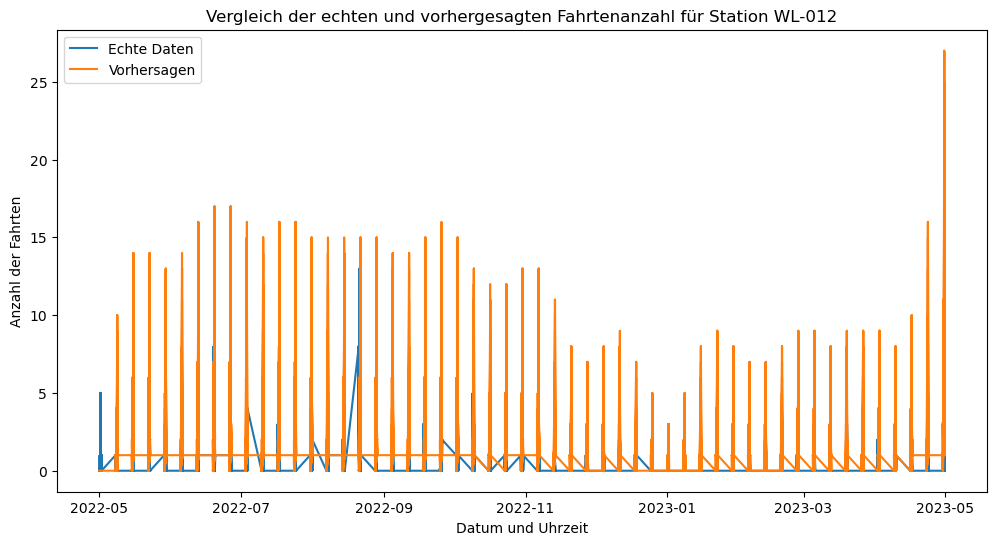

14:46:45 - cmdstanpy - INFO - Chain [1] start processing
14:46:45 - cmdstanpy - INFO - Chain [1] done processing


Station 13016 - MSE: 7.956761006289308, MAE: 1.6243261455525606


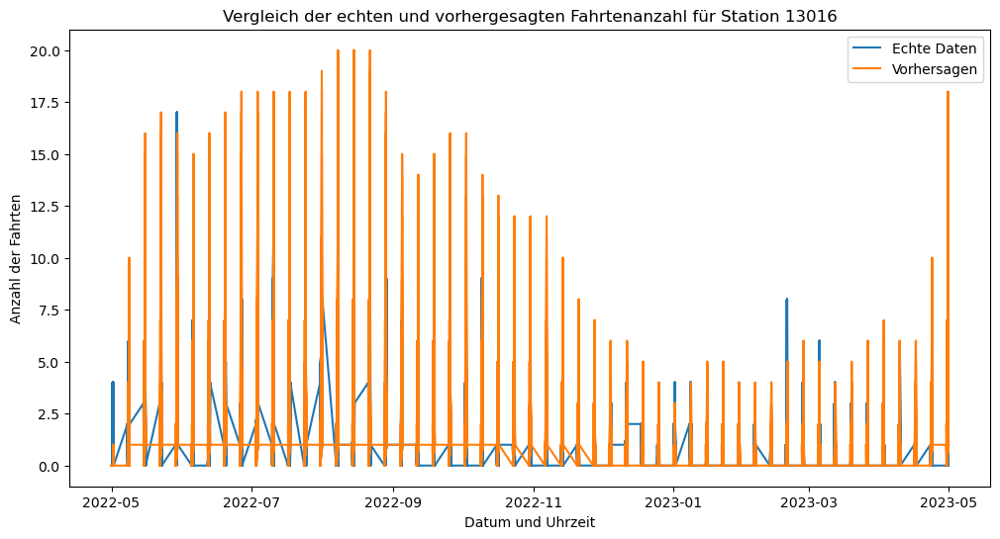

14:46:46 - cmdstanpy - INFO - Chain [1] start processing
14:46:46 - cmdstanpy - INFO - Chain [1] done processing


Station 13001 - MSE: 9.531446540880504, MAE: 1.8270440251572326


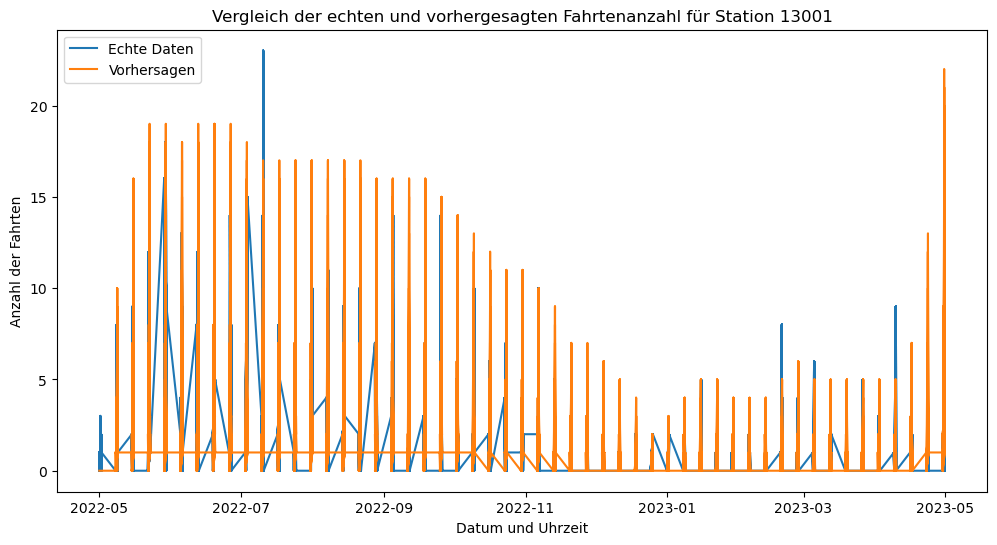

14:46:47 - cmdstanpy - INFO - Chain [1] start processing
14:46:47 - cmdstanpy - INFO - Chain [1] done processing


Station 13430 - MSE: 8.988319856244384, MAE: 1.849056603773585


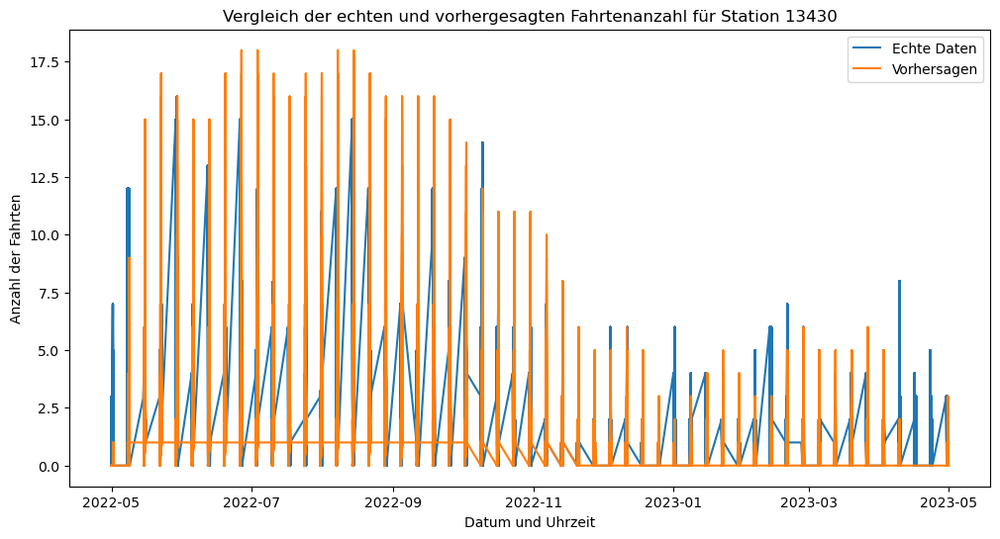

14:46:48 - cmdstanpy - INFO - Chain [1] start processing
14:46:48 - cmdstanpy - INFO - Chain [1] done processing


Station 13011 - MSE: 7.070530098831986, MAE: 1.5898472596585804


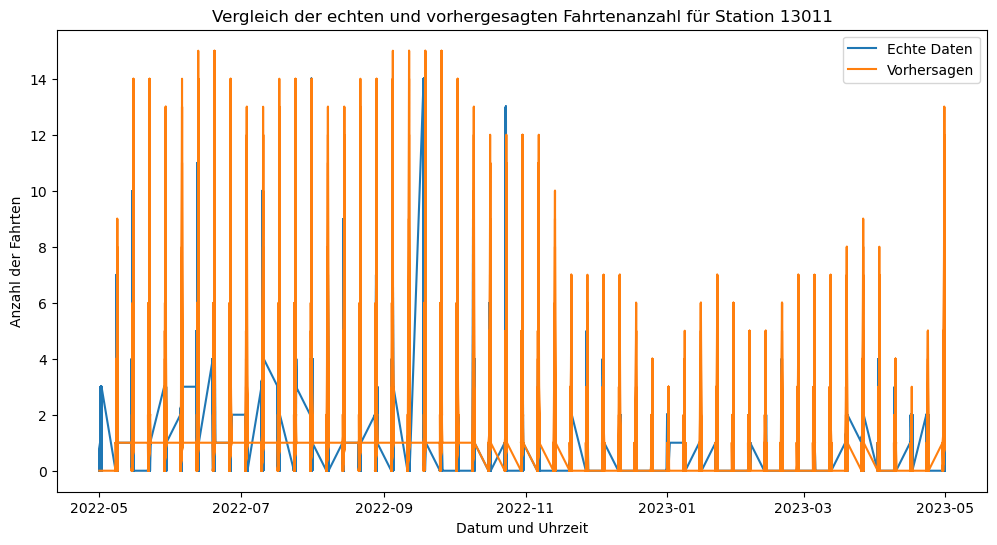

14:46:50 - cmdstanpy - INFO - Chain [1] start processing
14:46:50 - cmdstanpy - INFO - Chain [1] done processing


Station TA1305000011 - MSE: 7.338724168912848, MAE: 1.6287061994609164


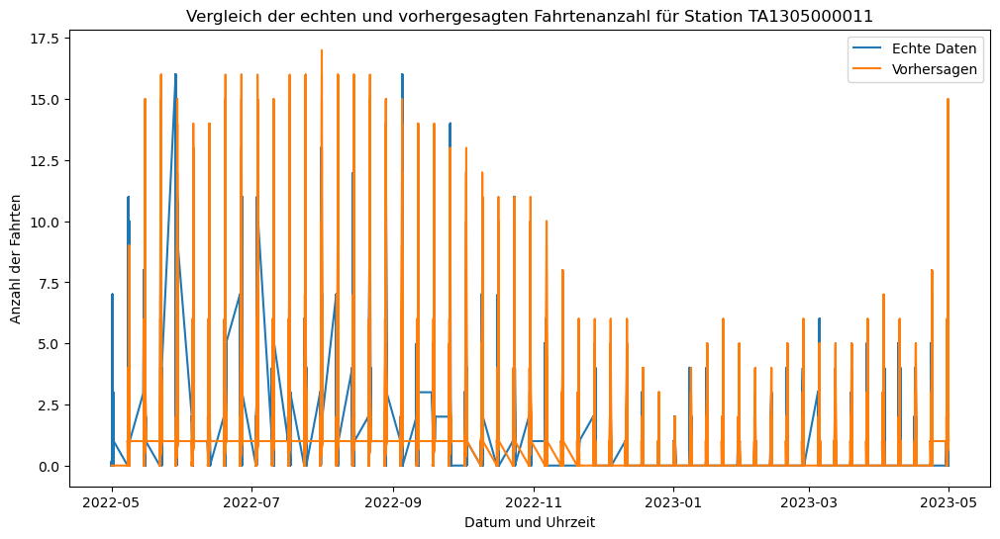

14:46:51 - cmdstanpy - INFO - Chain [1] start processing
14:46:51 - cmdstanpy - INFO - Chain [1] done processing


Station TA1307000151 - MSE: 8.167003593890387, MAE: 1.7038409703504043


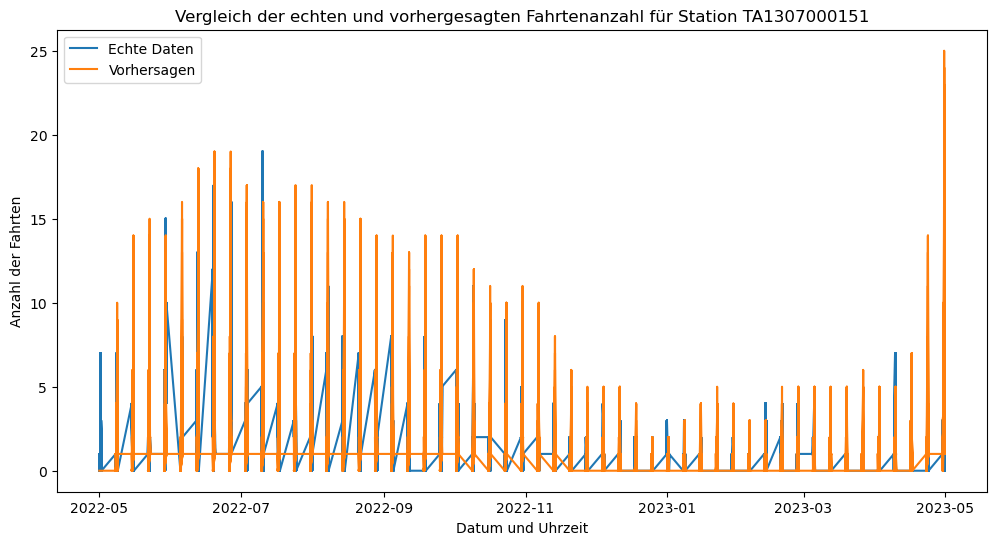

14:46:52 - cmdstanpy - INFO - Chain [1] start processing
14:46:52 - cmdstanpy - INFO - Chain [1] done processing


Station 15544 - MSE: 29.962151841868824, MAE: 2.78515274034142


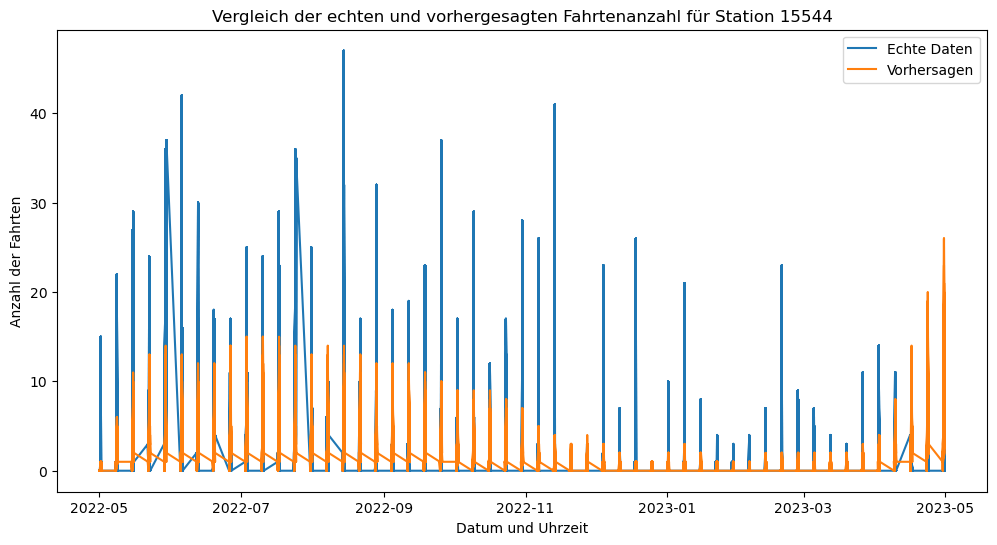

14:46:53 - cmdstanpy - INFO - Chain [1] start processing
14:46:53 - cmdstanpy - INFO - Chain [1] done processing


Station 13022 - MSE: 151.10837825696316, MAE: 6.737758310871518


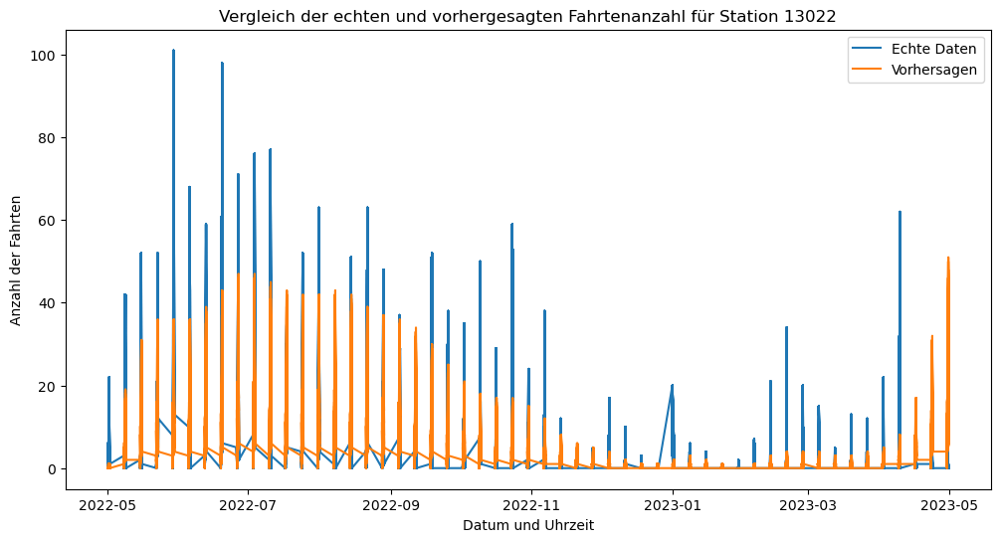

14:46:54 - cmdstanpy - INFO - Chain [1] start processing
14:46:54 - cmdstanpy - INFO - Chain [1] done processing


Station 13300 - MSE: 66.97113656783468, MAE: 4.46552111410602


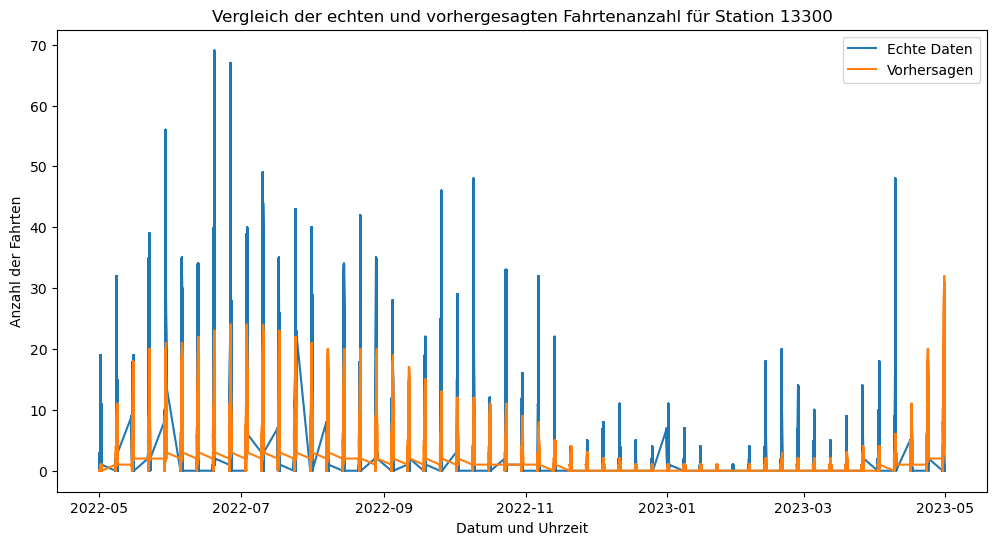

14:46:56 - cmdstanpy - INFO - Chain [1] start processing
14:46:56 - cmdstanpy - INFO - Chain [1] done processing


Station 13042 - MSE: 42.943059299191376, MAE: 3.4612533692722374


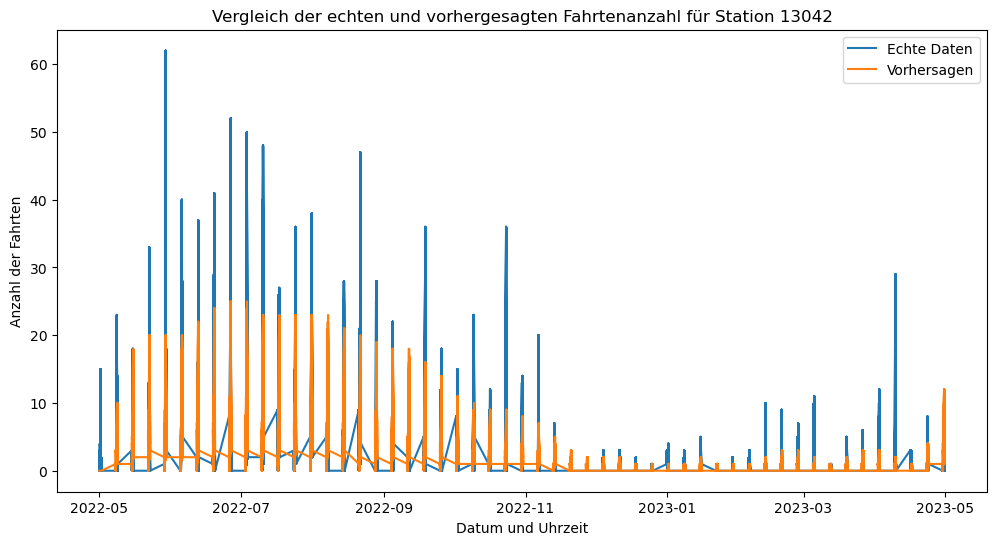

14:46:57 - cmdstanpy - INFO - Chain [1] start processing
14:46:57 - cmdstanpy - INFO - Chain [1] done processing


Station LF-005 - MSE: 68.99393530997304, MAE: 3.7825696316262354


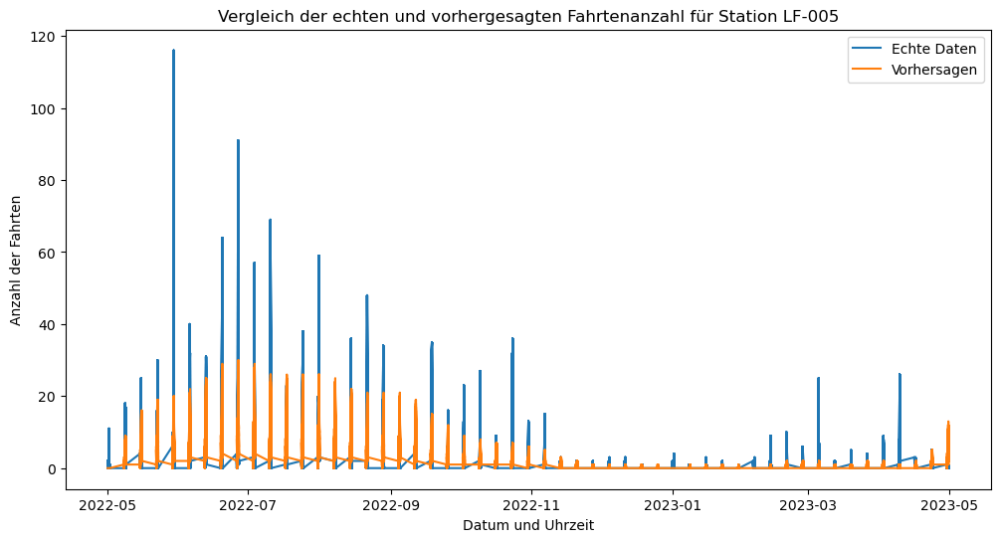

14:46:58 - cmdstanpy - INFO - Chain [1] start processing
14:46:58 - cmdstanpy - INFO - Chain [1] done processing


Station TA1308000050 - MSE: 22.059860736747527, MAE: 2.8473719676549867


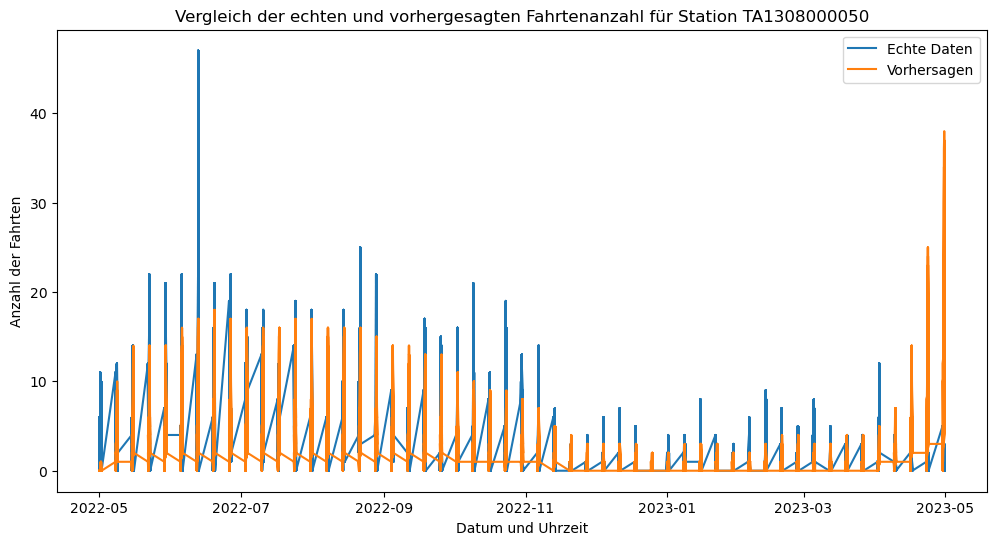

14:46:59 - cmdstanpy - INFO - Chain [1] start processing
14:46:59 - cmdstanpy - INFO - Chain [1] done processing


Station TA1308000001 - MSE: 57.8368149146451, MAE: 3.565251572327044


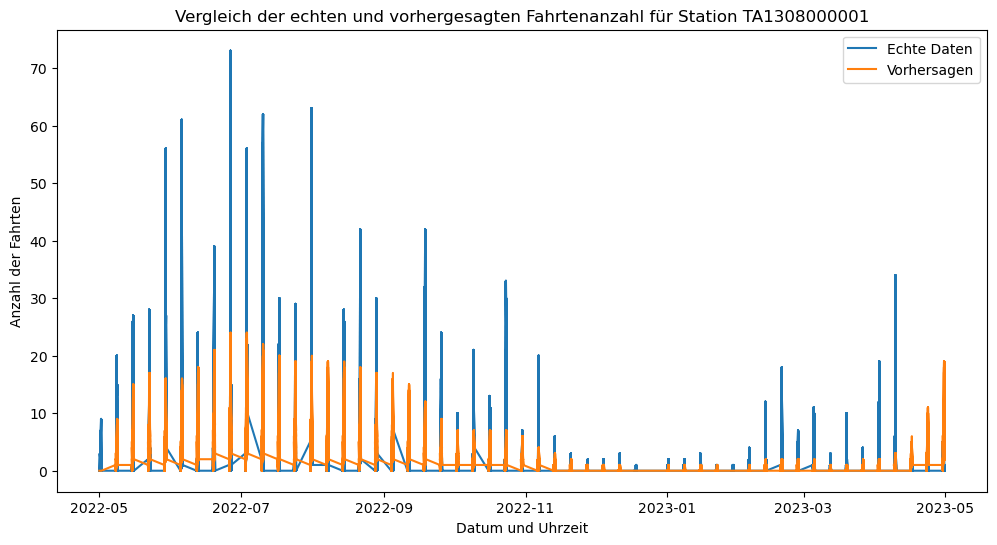

14:47:00 - cmdstanpy - INFO - Chain [1] start processing
14:47:00 - cmdstanpy - INFO - Chain [1] done processing


Station 13008 - MSE: 25.490341419586702, MAE: 2.9624887690925426


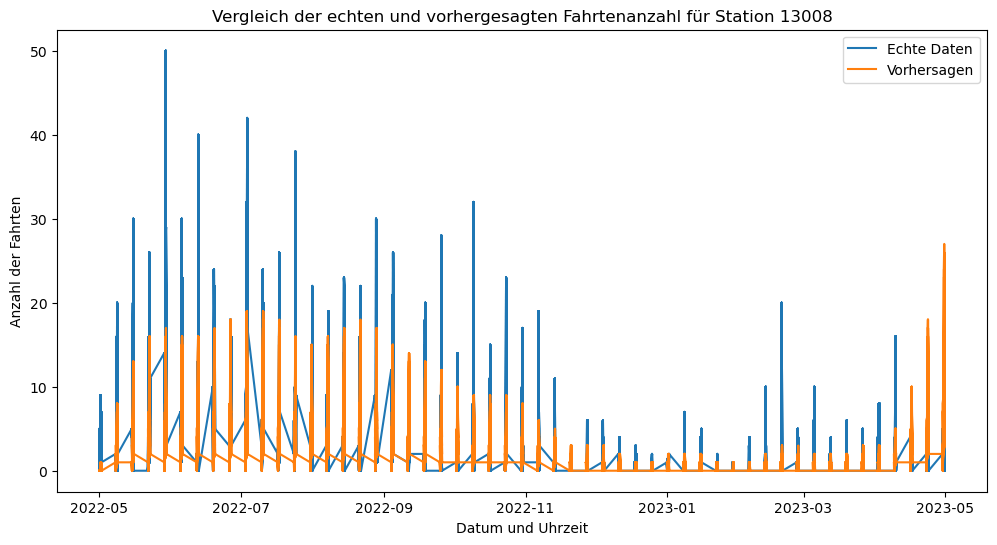

14:47:01 - cmdstanpy - INFO - Chain [1] start processing
14:47:01 - cmdstanpy - INFO - Chain [1] done processing


Station TA1307000039 - MSE: 11.626909254267744, MAE: 2.325696316262354


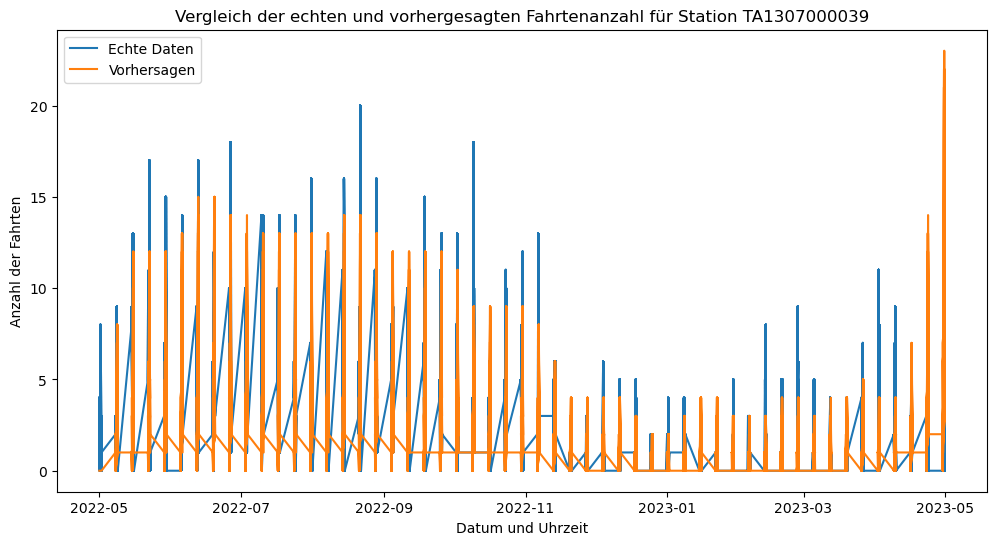

14:47:02 - cmdstanpy - INFO - Chain [1] start processing
14:47:02 - cmdstanpy - INFO - Chain [1] done processing


Station 13146 - MSE: 17.796046720575024, MAE: 2.3823000898472597


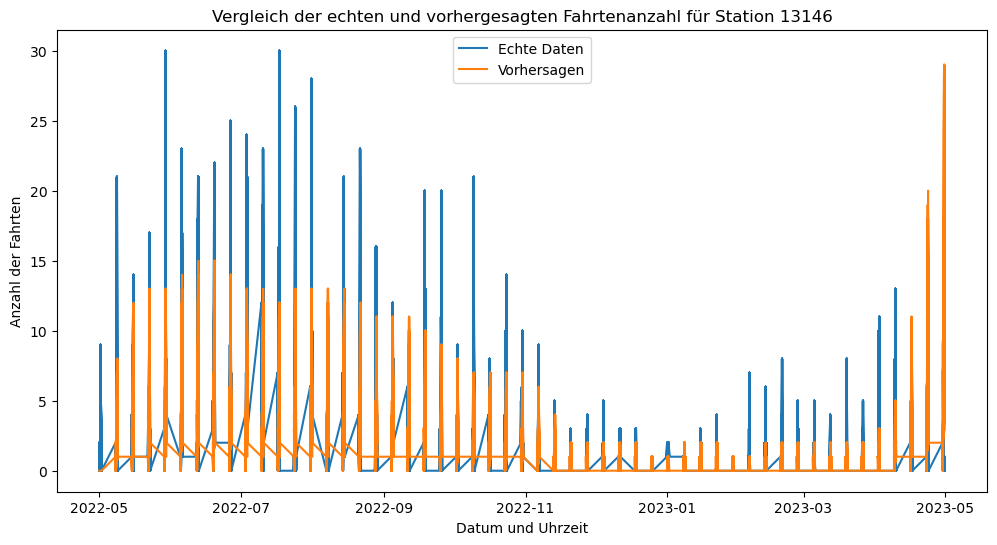

14:47:03 - cmdstanpy - INFO - Chain [1] start processing
14:47:03 - cmdstanpy - INFO - Chain [1] done processing


Station SL-005 - MSE: 14.389487870619947, MAE: 2.2252920035938906


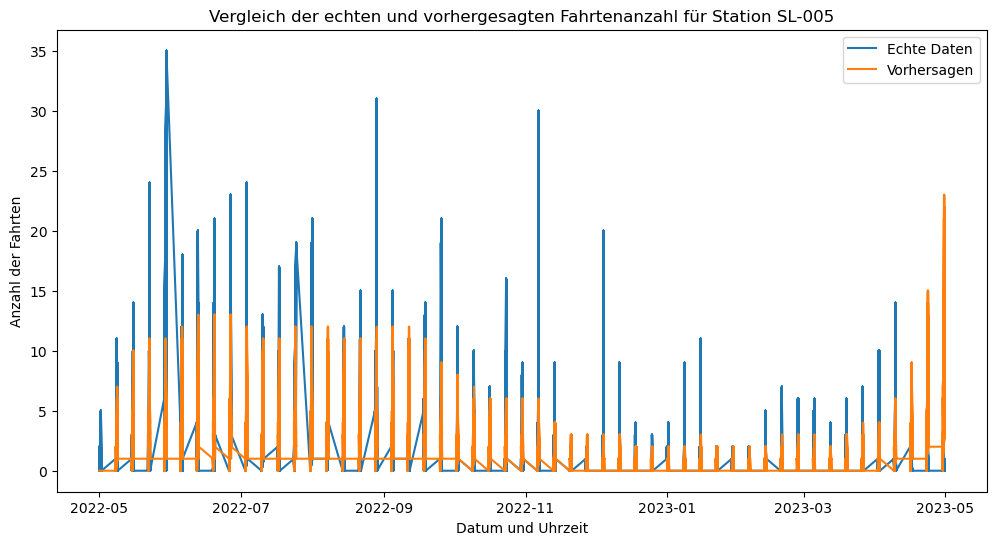

14:47:05 - cmdstanpy - INFO - Chain [1] start processing
14:47:05 - cmdstanpy - INFO - Chain [1] done processing


Station KA1504000135 - MSE: 13.943059299191376, MAE: 2.228099730458221


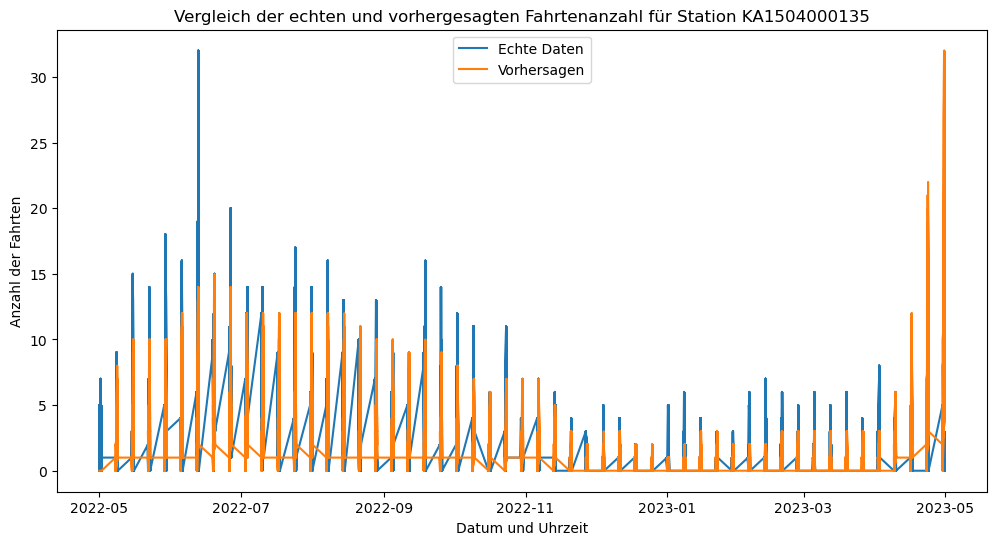

14:47:06 - cmdstanpy - INFO - Chain [1] start processing
14:47:06 - cmdstanpy - INFO - Chain [1] done processing


Station 13179 - MSE: 17.84153189577718, MAE: 2.393867924528302


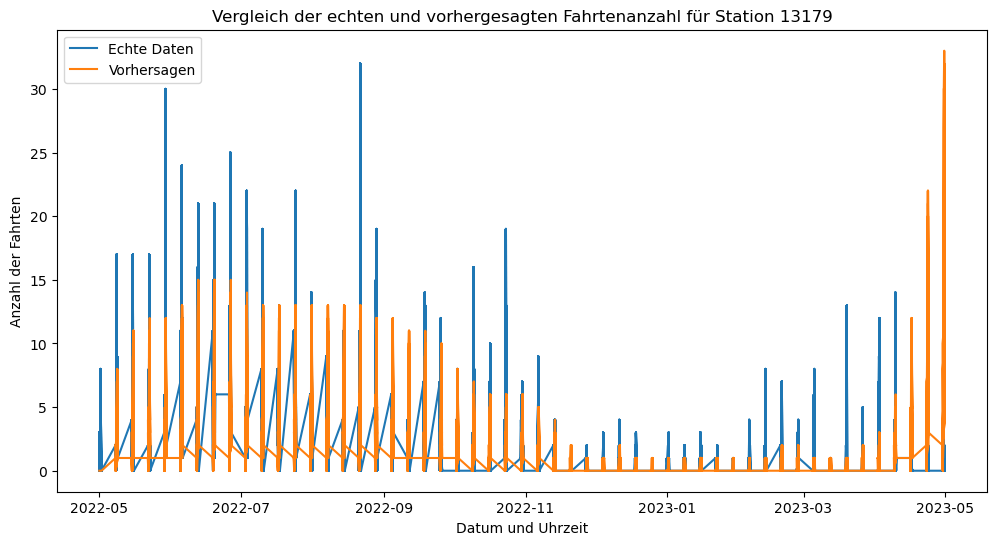

14:47:07 - cmdstanpy - INFO - Chain [1] start processing
14:47:07 - cmdstanpy - INFO - Chain [1] done processing


Station 13137 - MSE: 8.39173405211141, MAE: 1.8573674752920035


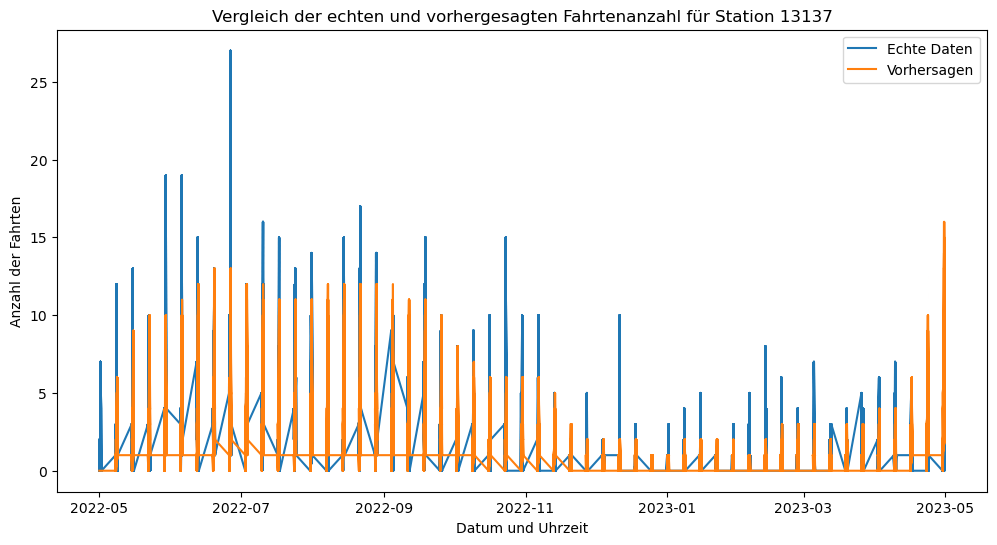

14:47:08 - cmdstanpy - INFO - Chain [1] start processing
14:47:08 - cmdstanpy - INFO - Chain [1] done processing


Station KA1503000043 - MSE: 8.299865229110512, MAE: 1.9088050314465408


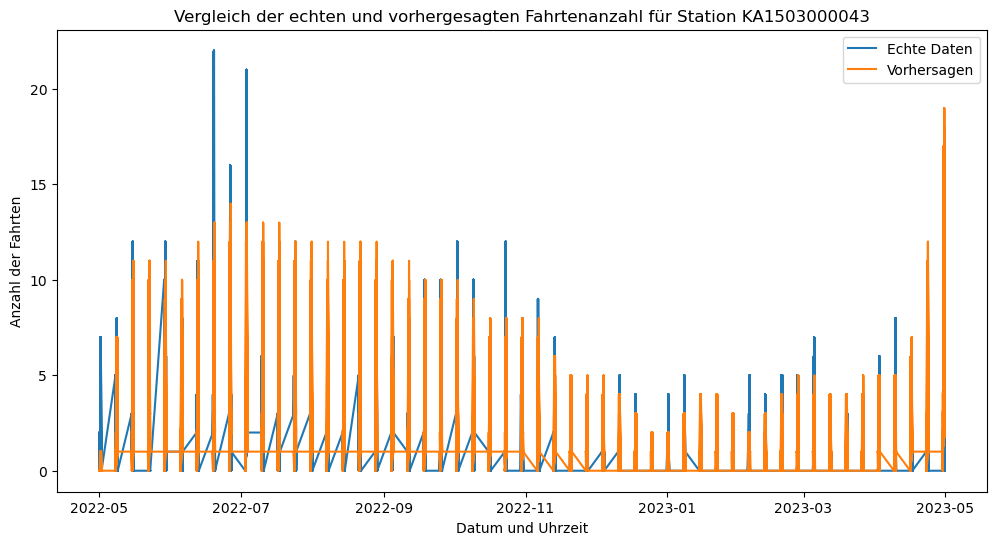

14:47:10 - cmdstanpy - INFO - Chain [1] start processing
14:47:10 - cmdstanpy - INFO - Chain [1] done processing


Station TA1305000032 - MSE: 5.917003593890386, MAE: 1.638477088948787


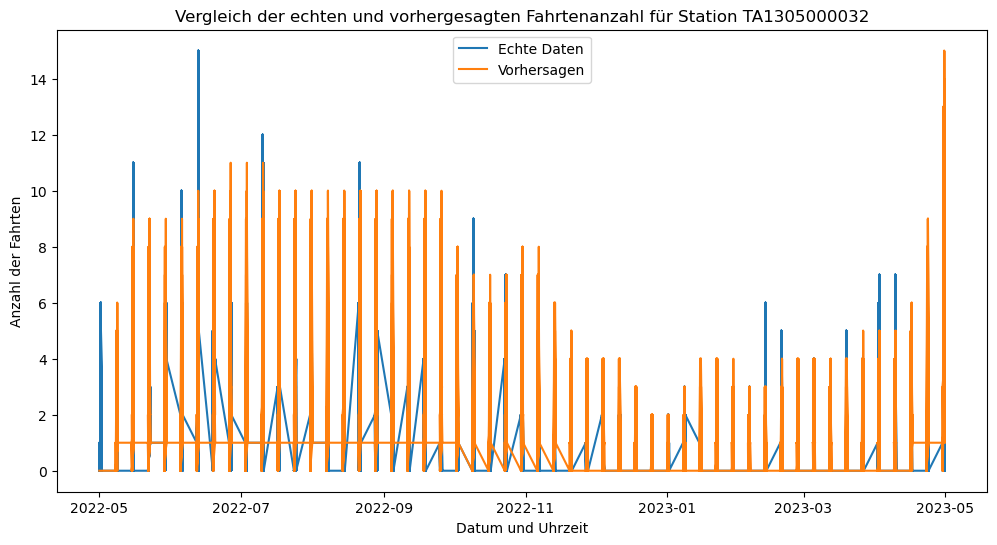

14:47:12 - cmdstanpy - INFO - Chain [1] start processing
14:47:12 - cmdstanpy - INFO - Chain [1] done processing


Station 13045 - MSE: 6.644317160826595, MAE: 1.7099056603773586


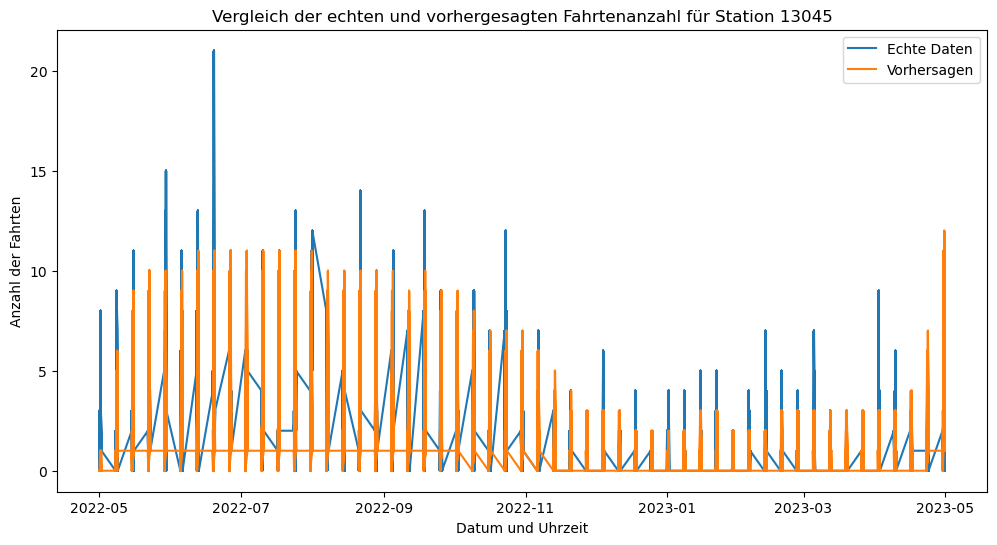

14:47:13 - cmdstanpy - INFO - Chain [1] start processing
14:47:13 - cmdstanpy - INFO - Chain [1] done processing


Station TA1306000012 - MSE: 7.249101527403414, MAE: 1.7300089847259659


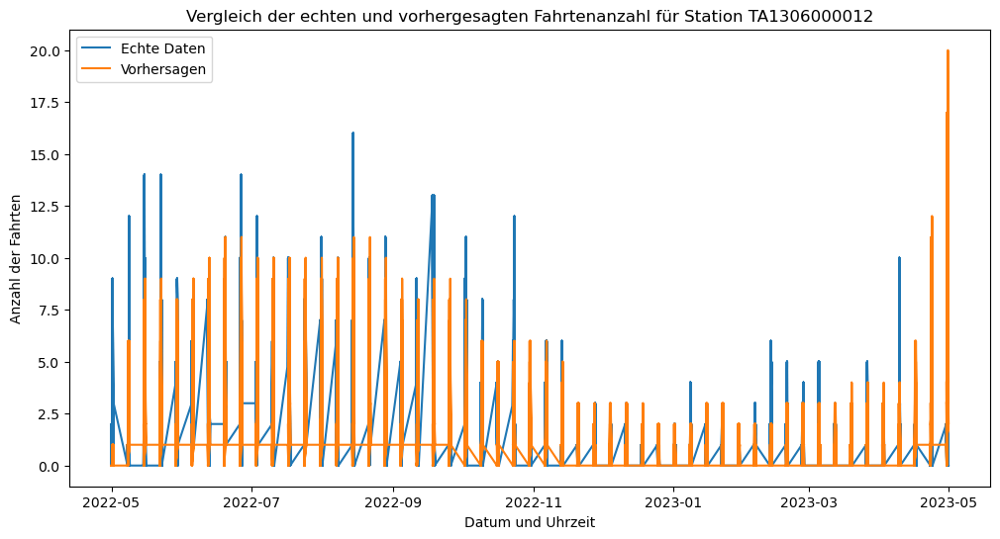

14:47:14 - cmdstanpy - INFO - Chain [1] start processing
14:47:14 - cmdstanpy - INFO - Chain [1] done processing


Station 13061 - MSE: 7.551212938005391, MAE: 1.6992362982929021


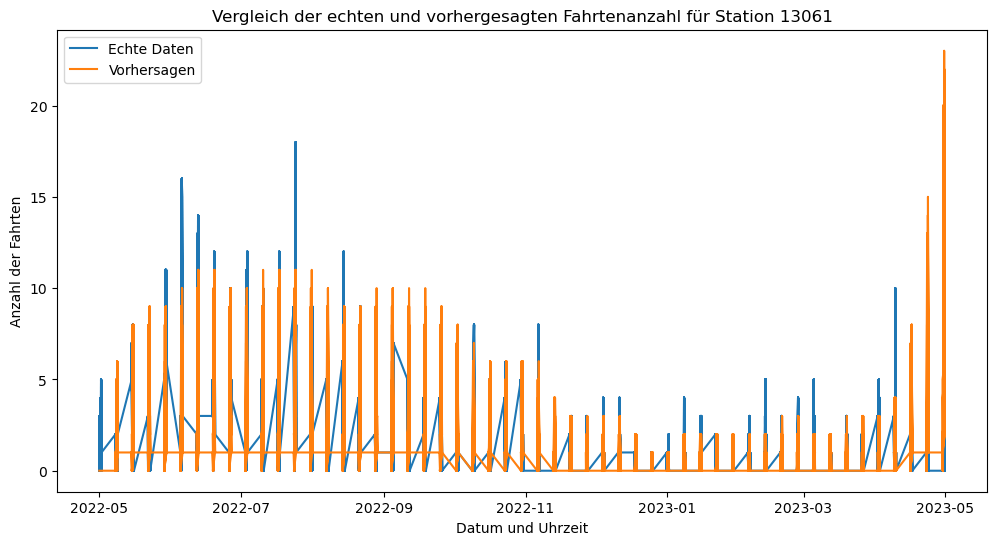

14:47:15 - cmdstanpy - INFO - Chain [1] start processing
14:47:15 - cmdstanpy - INFO - Chain [1] done processing


Station 13263 - MSE: 5.7725741239892185, MAE: 1.428234501347709


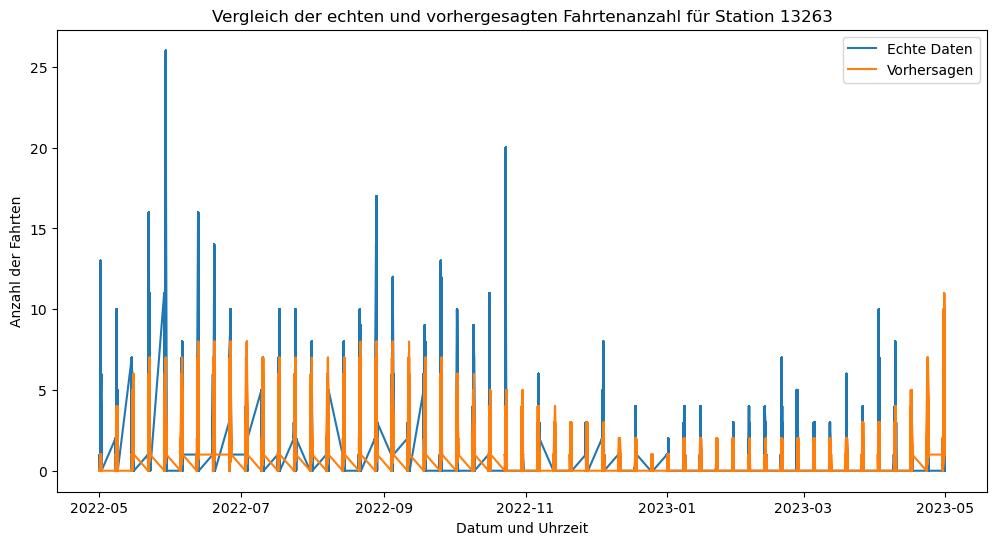

14:47:17 - cmdstanpy - INFO - Chain [1] start processing
14:47:17 - cmdstanpy - INFO - Chain [1] done processing


Station SL-008 - MSE: 4.973831985624439, MAE: 1.3671383647798743


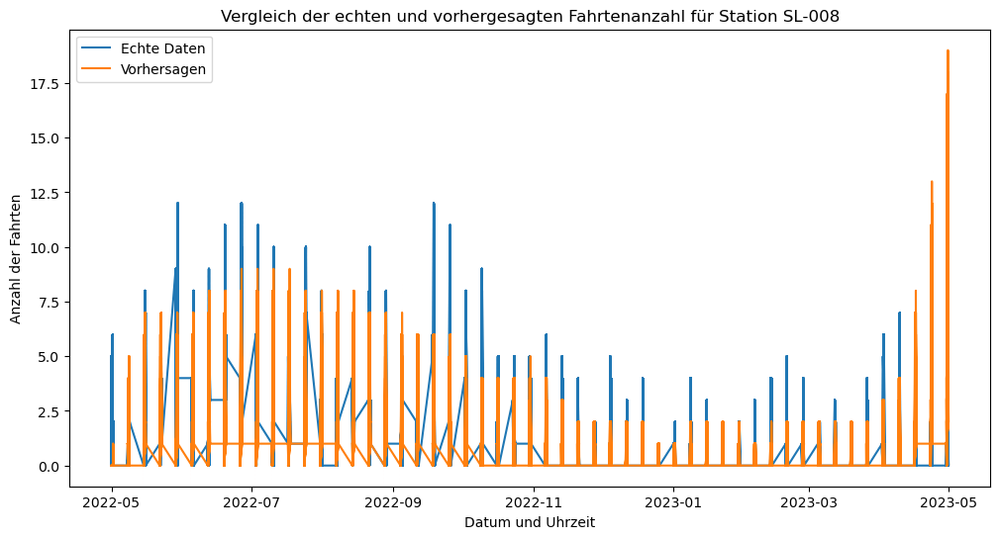

In [138]:

# Annahme: 'df' und 'demand_patterns' sind bereits vorbereitet
df['started_at'] = pd.to_datetime(df['started_at'])

# Berechnung und Visualisierung
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf Wochenbasis und Vorbereitung der Zeitreihen-Daten
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Aufteilen der Daten in Trainings- und Testdatensätze
    test_size = 4  # 4 Wochen
    train_data = weekly_data[:-test_size]
    test_data = weekly_data[-test_size:]

    # Trainieren des Prophet-Modells mit dem Trainingsdatensatz
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    # Vorhersage für den Testzeitraum
    future = model.make_future_dataframe(periods=test_size, freq='W')
    forecast = model.predict(future)

    # Berechnung der angepassten stündlichen Vorhersagewerte
    cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
    demand_pattern = demand_patterns[cluster_id]
    
    forecast['yhat'] = forecast['yhat'].clip(lower=0)  # Verhindern negativer Werte
    adjusted_forecast = {}
    times = []
    predicted_values = []
    for index, row in forecast.iterrows():
        week_forecast = row['yhat']
        for (weekday, hour), proportion in demand_pattern.items():
            datetime = pd.Timestamp(row['ds']) + pd.Timedelta(hours=hour)
            forecast_value = week_forecast * proportion
            adjusted_forecast[datetime] = round(forecast_value)
            times.append(datetime)
            predicted_values.append(round(forecast_value))

    # Ermitteln der echten stündlichen Werte
    actual_data_hourly = station_data.set_index('started_at').resample('H').size()
    actual_values = [actual_data_hourly.get(time, 0) for time in times]

    # Berechnung der Fehlermetriken
    mse = mean_squared_error(actual_values, predicted_values)
    mae = mean_absolute_error(actual_values, predicted_values)

    print(f"Station {station_id} - MSE: {mse}, MAE: {mae}")

    # Visualisierung der echten und vorhergesagten Daten
    plt.figure(figsize=(12, 6))
    plt.plot(times, actual_values, label='Echte Daten')
    plt.plot(times, predicted_values, label='Vorhersagen')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()


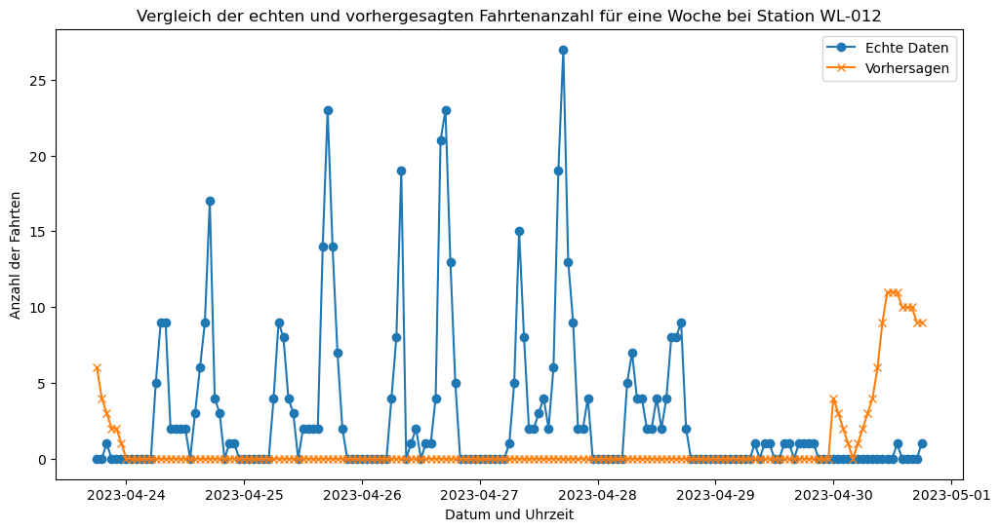

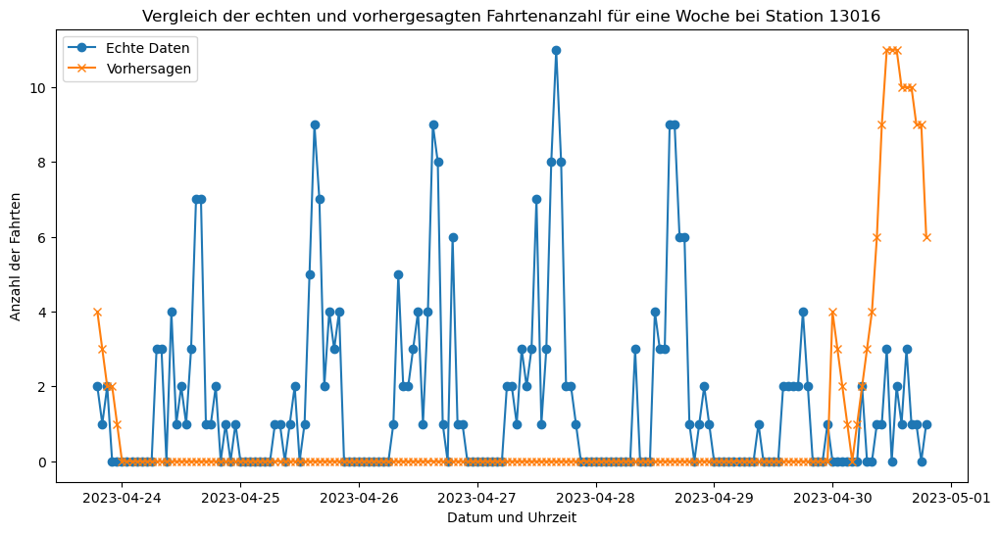

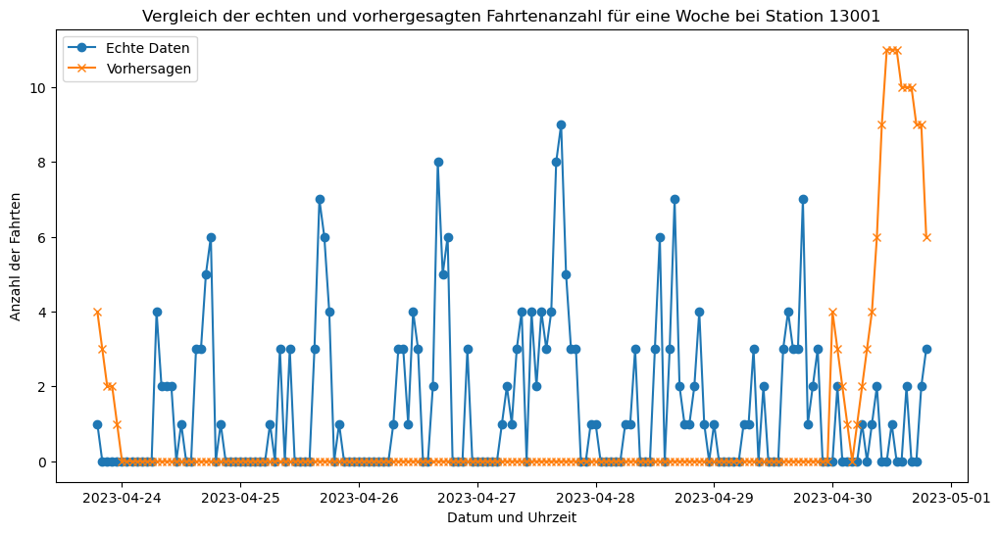

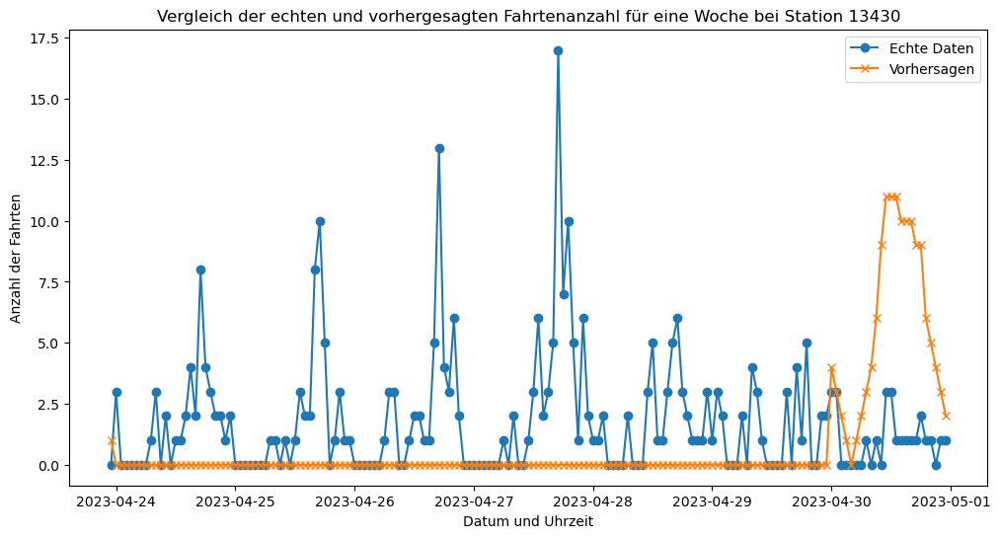

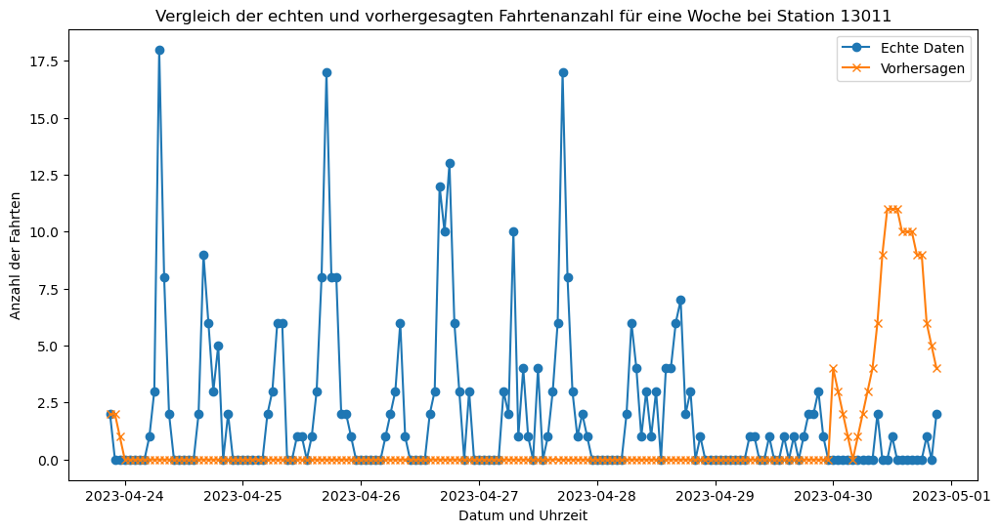

...

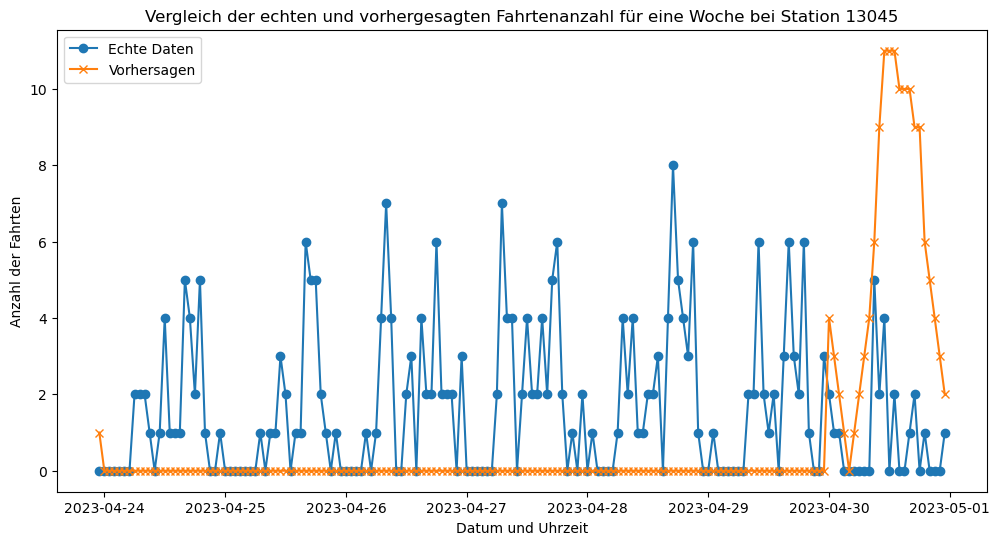

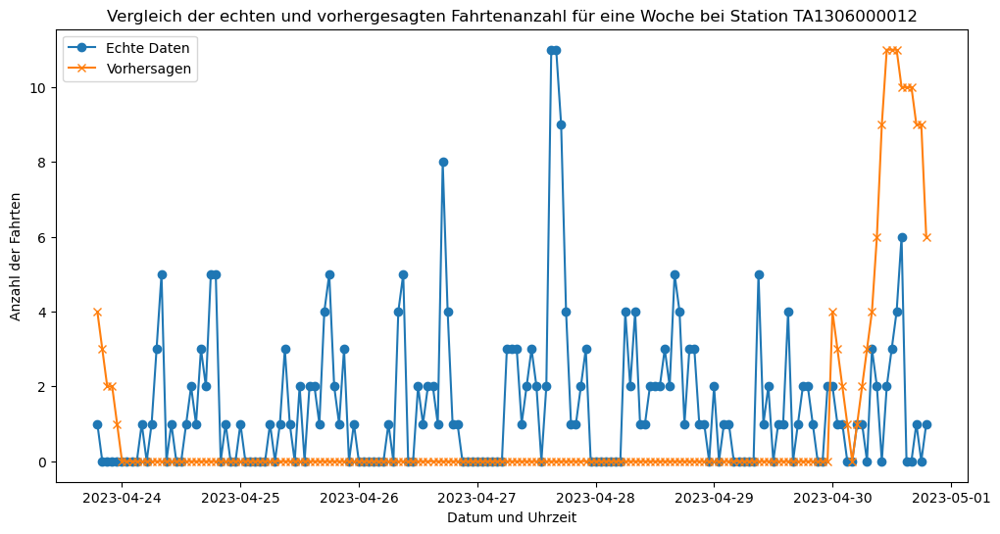

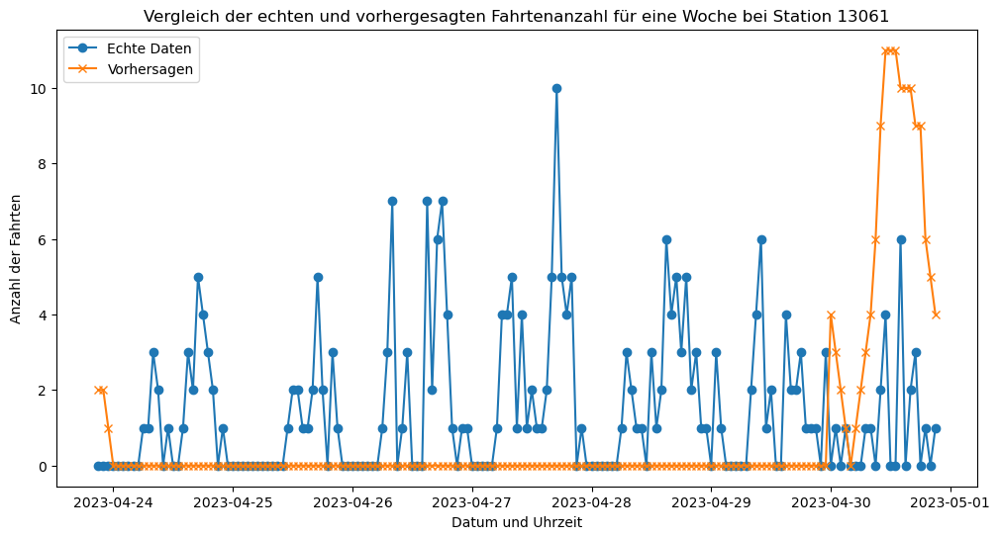

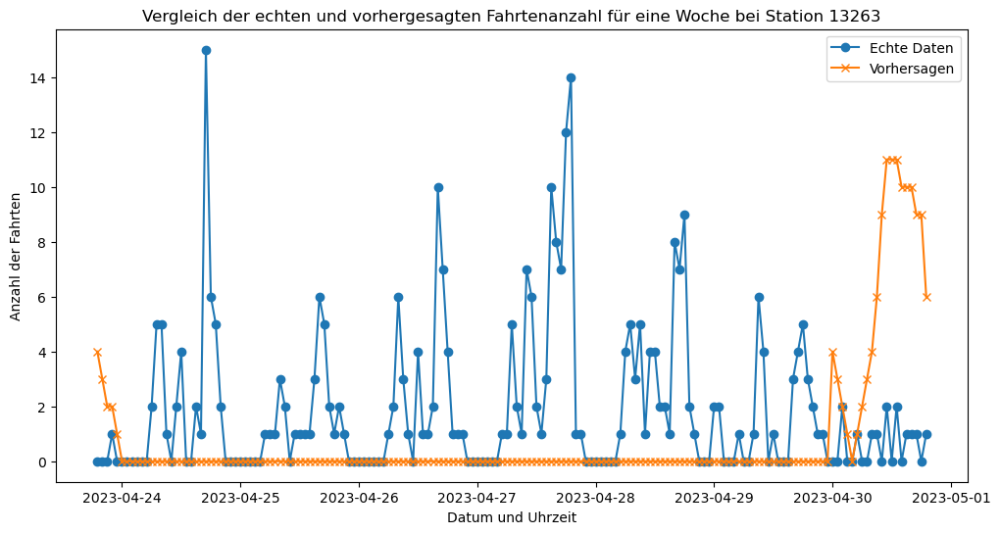

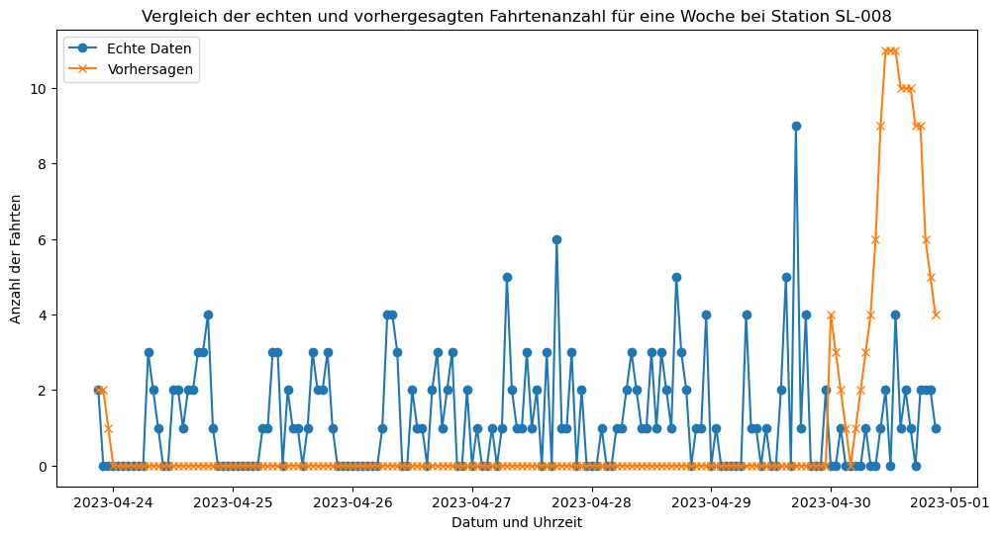

In [139]:


# Annahme: 'df' und 'demand_patterns' sind bereits vorbereitet
df['started_at'] = pd.to_datetime(df['started_at'])

# Berechnung und Visualisierung
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf stündlicher Basis
    hourly_data = station_data.set_index('started_at').resample('H').count()['ride_id']

    # Auswahl eines spezifischen Zeitraums für den Vergleich (z.B. die letzte verfügbare Woche)
    test_end = hourly_data.index.max()
    test_start = test_end - pd.Timedelta(days=7)
    actual_data_weekly = hourly_data[test_start:test_end]

    # Hier würde normalerweise der Modellierungsprozess stehen. Für die Demonstration verwenden wir direkt 'actual_data_weekly'
    # und gehen davon aus, dass 'adjusted_forecast' bereits vorher auf stündlicher Basis berechnet wurde.

    # Visualisierung der echten und vorhergesagten Daten für eine Woche
    plt.figure(figsize=(12, 6))
    plt.plot(actual_data_weekly.index, actual_data_weekly, label='Echte Daten', marker='o', linestyle='-')
    plt.plot(actual_data_weekly.index, [adjusted_forecast.get(time, 0) for time in actual_data_weekly.index], label='Vorhersagen', marker='x', linestyle='-')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für eine Woche bei Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()


In [119]:
# Aggregation der tatsächlichen Fahrtenanzahl auf stündlicher Basis
actual_data_hourly = df.groupby(['start_station_id', pd.Grouper(key='started_at', freq='H')]) \
                        .size() \
                        .reset_index(name='ride_count')

# Setzen Sie 'started_at' als Index, um die Resampling- und Vergleichsoperationen zu erleichtern
actual_data_hourly.set_index('started_at', inplace=True)

# Für jede wichtige Station:
for station_id in important_station_ids:
    # Extrahiere die echten Werte für diese Station
    actual_station_data = actual_data_hourly[actual_data_hourly['start_station_id'] == station_id]

    # Holen Sie die Vorhersagen für diese Station
    forecast_data = hourly_forecasts[station_id]
    forecast_data.set_index('ds', inplace=True)

    # Stellen Sie sicher, dass die Zeitindizes übereinstimmen
    common_index = actual_station_data.index.intersection(forecast_data.index)
    actual_station_data = actual_station_data.loc[common_index]
    forecast_data = forecast_data.loc[common_index]

    # Berechnung der Fehlermetriken
    mse = mean_squared_error(actual_station_data['ride_count'], forecast_data['yhat'])
    mae = mean_absolute_error(actual_station_data['ride_count'], forecast_data['yhat'])

    print(f"Station {station_id} - MSE: {mse}, MAE: {mae}")


KeyError: "None of ['ds'] are in the columns"

In [89]:
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)

station_forecasts = {}
for station_id in df['start_station_id'].unique():
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf Wochenbasis und Berechnung der Fahrtanzahl
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
    weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(weekly_data[['ds', 'y']])

    # Erstelle zukünftige Datenreihe für die Vorhersagen
    future = model.make_future_dataframe(periods=4, freq='W')  # Vorhersage für die nächsten 4 Wochen
    forecast = model.predict(future)

    # Verwende den durchschnittlichen Vorhersagewert der nächsten 4 Wochen
    # Dies berücksichtigt die langfristige Saisonalität und jüngste Trends
    adjusted_forecast = forecast['yhat'][-4:].mean()

    station_forecasts[station_id] = adjusted_forecast


15:14:57 - cmdstanpy - INFO - Chain [1] start processing
15:14:57 - cmdstanpy - INFO - Chain [1] done processing
15:14:58 - cmdstanpy - INFO - Chain [1] start processing
15:14:58 - cmdstanpy - INFO - Chain [1] done processing
15:14:58 - cmdstanpy - INFO - Chain [1] start processing
15:14:58 - cmdstanpy - INFO - Chain [1] done processing
15:14:58 - cmdstanpy - INFO - Chain [1] start processing
15:14:58 - cmdstanpy - INFO - Chain [1] done processing
15:14:59 - cmdstanpy - INFO - Chain [1] start processing
15:14:59 - cmdstanpy - INFO - Chain [1] done processing
15:14:59 - cmdstanpy - INFO - Chain [1] start processing
15:14:59 - cmdstanpy - INFO - Chain [1] done processing
15:14:59 - cmdstanpy - INFO - Chain [1] start processing
15:15:00 - cmdstanpy - INFO - Chain [1] done processing
15:15:00 - cmdstanpy - INFO - Chain [1] start processing
15:15:00 - cmdstanpy - INFO - Chain [1] done processing
15:15:00 - cmdstanpy - INFO - Chain [1] start processing
15:15:00 - cmdstanpy - INFO - Chain [1]

In [76]:
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)

station_forecasts = {}
for station_id in df['start_station_id'].unique():
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf Wochenbasis und Berechnung der Fahrtanzahl
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
    weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

    # Berechne den durchschnittlichen wöchentlichen Wert aus den historischen Daten
    historical_avg = weekly_data['y'].mean()

    model = Prophet()
    model.fit(weekly_data[['ds', 'y']])

    future = model.make_future_dataframe(periods=1, freq='W')
    forecast = model.predict(future)

 
    adjusted_forecast = historical_avg 

    station_forecasts[station_id] = adjusted_forecast


14:42:23 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1] done processing
14:42:24 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1] done processing
14:42:24 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1] done processing
14:42:24 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1] done processing
14:42:25 - cmdstanpy - INFO - Chain [1] start processing
14:42:25 - cmdstanpy - INFO - Chain [1] done processing
14:42:25 - cmdstanpy - INFO - Chain [1] start processing
14:42:25 - cmdstanpy - INFO - Chain [1] done processing
14:42:25 - cmdstanpy - INFO - Chain [1] start processing
14:42:25 - cmdstanpy - INFO - Chain [1] done processing
14:42:25 - cmdstanpy - INFO - Chain [1] start processing
14:42:26 - cmdstanpy - INFO - Chain [1] done processing
14:42:26 - cmdstanpy - INFO - Chain [1] start processing
14:42:26 - cmdstanpy - INFO - Chain [1]

In [84]:
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)

station_forecasts = {}
for station_id in df['start_station_id'].unique():
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf Wochenbasis und Berechnung der Fahrtanzahl
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
    weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

    # Berechne den durchschnittlichen wöchentlichen Wert aus den historischen Daten
    historical_avg = weekly_data['y'].mean()

    # Berücksichtige die letzten 4 Wochen für die jüngste Saisonalität
    recent_avg = weekly_data['y'][-4:].mean()

    # Kombiniere beide Werte, wobei der jüngsten Zeit ein höheres Gewicht gegeben wird
    # Zum Beispiel 25% historischer Durchschnitt und 75% jüngster Durchschnitt
    adjusted_forecast = 0.25 * historical_avg + 0.75 * recent_avg

    station_forecasts[station_id] = adjusted_forecast


In [91]:
# Angenommen, `demand_patterns` ist bereits für jedes Cluster berechnet
detailed_forecasts = {}
for station_id, weekly_total_forecast in station_forecasts.items():
    cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
    demand_pattern = demand_patterns[cluster_id]

    detailed_station_forecast = {}
    for (weekday, hour), proportion in demand_pattern.items():
        forecast_value = weekly_total_forecast * proportion
        detailed_station_forecast[(weekday, hour)] = round(forecast_value)

    detailed_forecasts[station_id] = detailed_station_forecast


In [90]:
station_forecasts

{'TA1307000117': 772.4967543489381,
 '13300': 1283.7557924432617,
 'TA1305000032': 751.2036893991021,
 '13196': 384.87361354255233,
 '13290': 247.24753365153455,
 'TA1309000061': 592.6292523002526,
 '13080': 178.35544524314582,
 'KA1503000053': 7.432256434731466,
 'KA1504000156': 87.22788468401163,
 'TA1307000142': 630.7828401157262,
 '13248': 217.7937015861748,
 '15632': 128.54856794683292,
 'KA1503000072': 287.8636748752502,
 '13075': 225.76698138393368,
 '13011': 769.0597829963835,
 '655': 56.9770836050492,
 'TA1307000121': 375.4364296834584,
 'TA1307000126': 609.9673755371158,
 'TA1307000048': 307.6409264805877,
 'TA1305000014': 709.5204120923361,
 'KA1504000134': 377.0395661650765,
 '620': 220.4236103206725,
 '18069': 71.03223111382422,
 '13243': 367.6979358001768,
 '632': 641.6184905424642,
 '13006': 264.9188030088819,
 'TA1307000149': 174.83151384403953,
 'TA1309000033': 513.2878725061908,
 'KA1503000015': 278.18977433316763,
 'KA1503000043': 929.0041855516201,
 'KA1706005007': 

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/2537673593.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


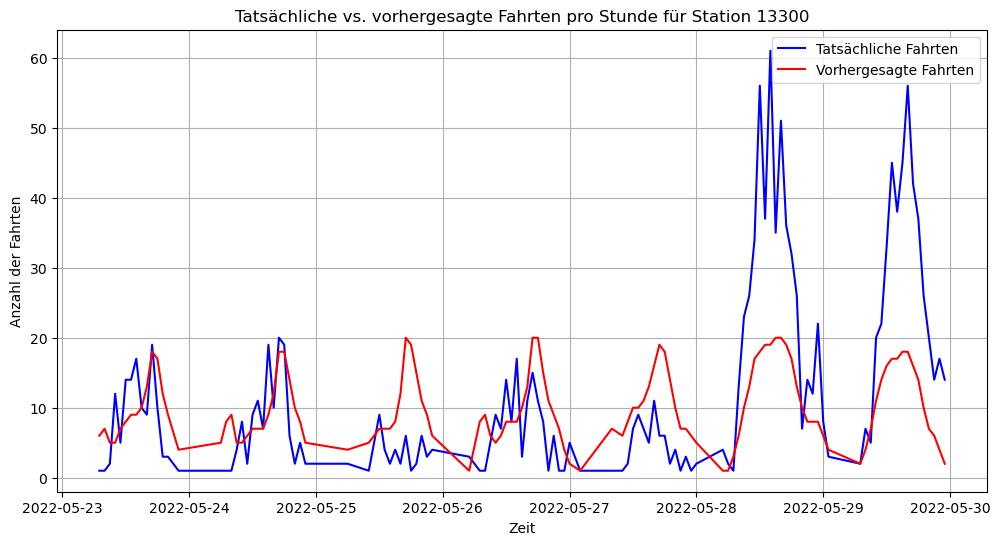

In [113]:
import matplotlib.pyplot as plt

selected_station_id = '13300'
actual_data = df[(df['start_station_id'] == selected_station_id) & 
                 (df['started_at'] >= '2022-05-23') & 
                 (df['started_at'] < '2022-05-30')]  # Passen Sie das Datum entsprechend an

# Aggregieren der Daten nach Stunde
actual_data['hour'] = actual_data['started_at'].dt.floor('H')
actual_rides = actual_data.groupby('hour').size()

# Tatsächliche Daten darstellen
plt.figure(figsize=(12, 6))
actual_time_index = actual_rides.index
plt.plot(actual_time_index, actual_rides, label='Tatsächliche Fahrten', color='blue')

# Vorhergesagte Daten vorbereiten
# Hier nehme ich an, dass du bereits eine Stunde-zu-Stunde Vorhersage in 'predicted_data' hast
# Die Vorhersagedaten sollten bereits der Stundenaggregation entsprechen
predicted_data = detailed_forecasts[selected_station_id]
# Du musst 'predicted_data' so umwandeln, dass es einen Zeitindex hat, der den tatsächlichen Daten entspricht
# Hier ist ein generischer Ansatz, wie du es machen könntest:
forecast_values = [predicted_data[(d.weekday(), d.hour)] for d in actual_time_index]

# Vorhergesagte Fahrten darstellen
plt.plot(actual_time_index, forecast_values, label='Vorhergesagte Fahrten', color='red')

# Titel und Legende
plt.title(f'Tatsächliche vs. vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')
plt.xlabel('Zeit')
plt.ylabel('Anzahl der Fahrten')
plt.legend()
plt.grid(True)
plt.show()


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


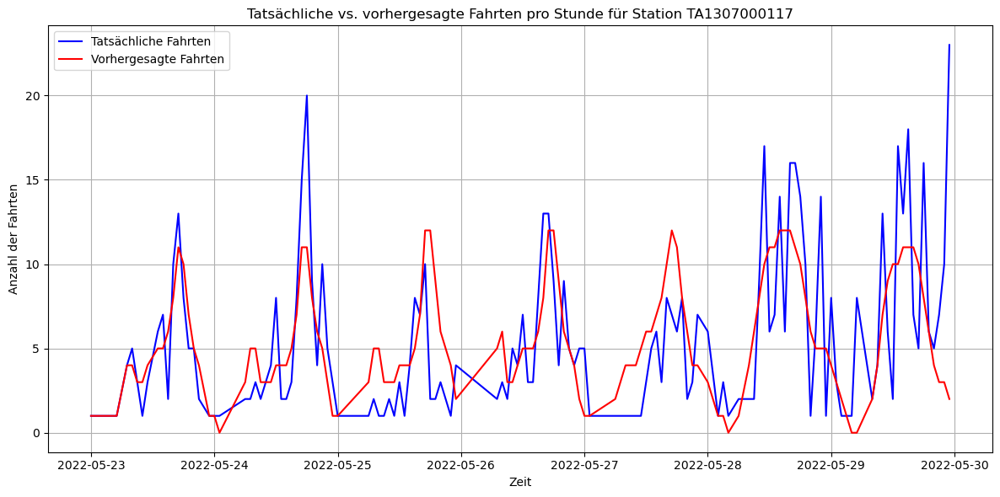

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


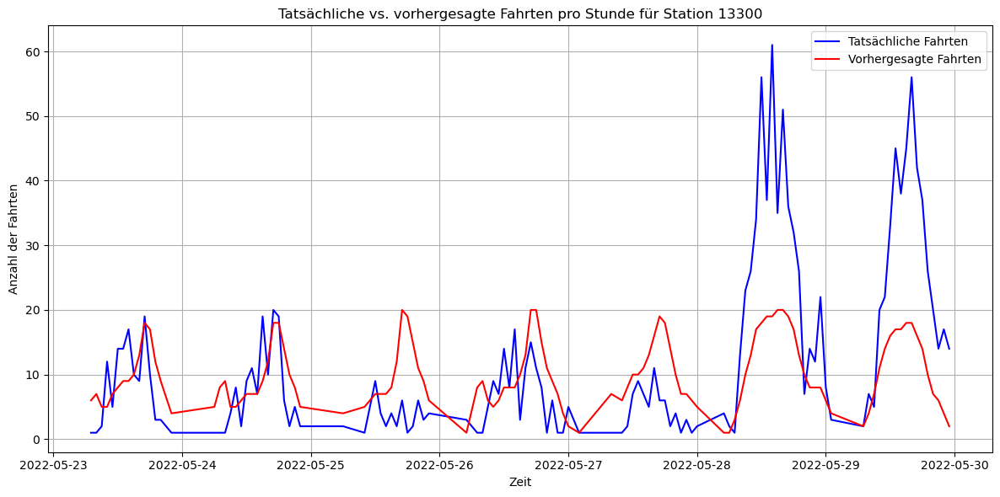

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


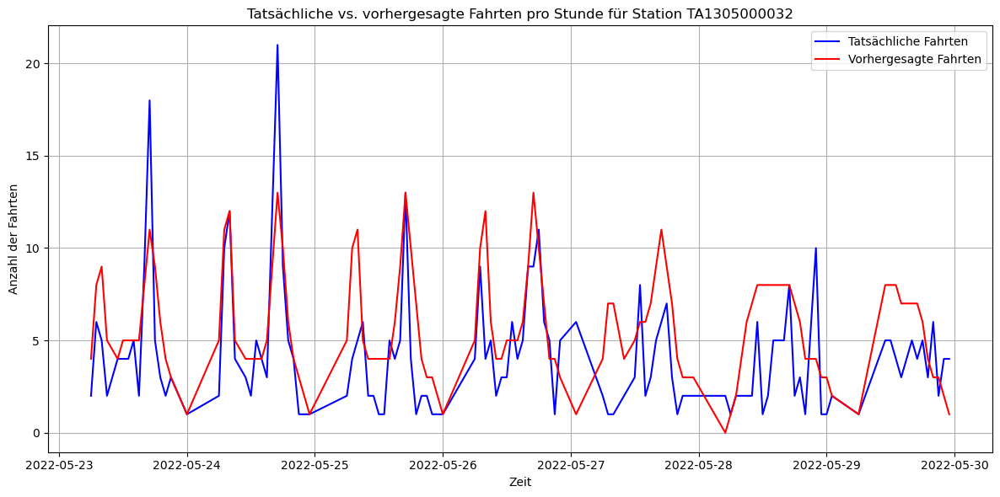

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


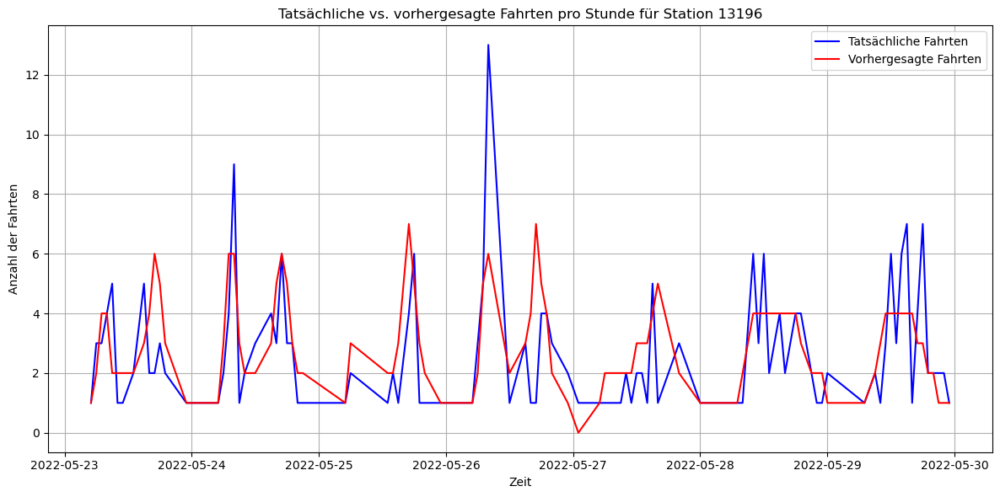

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


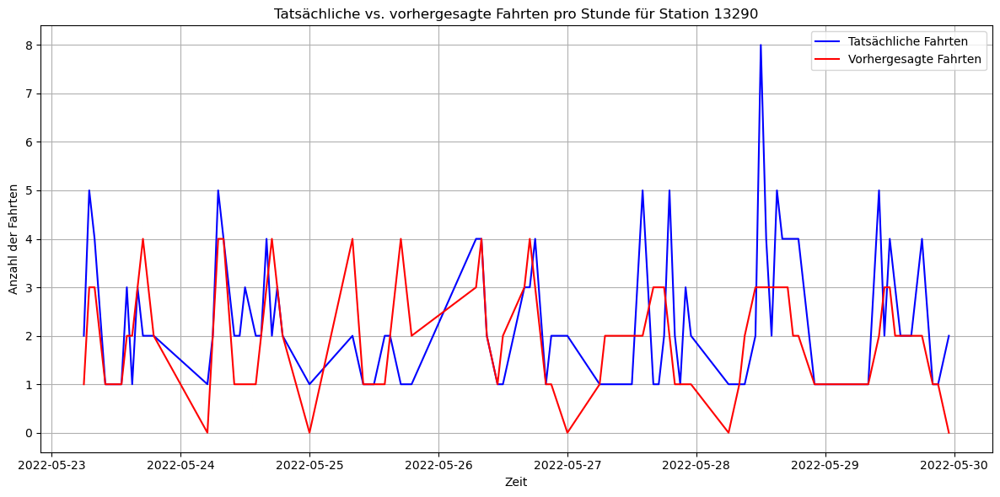

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


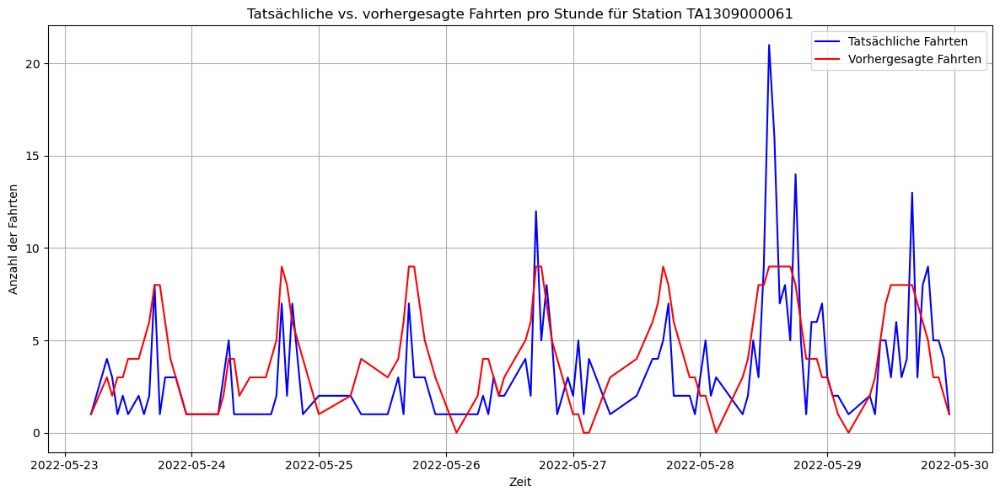

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


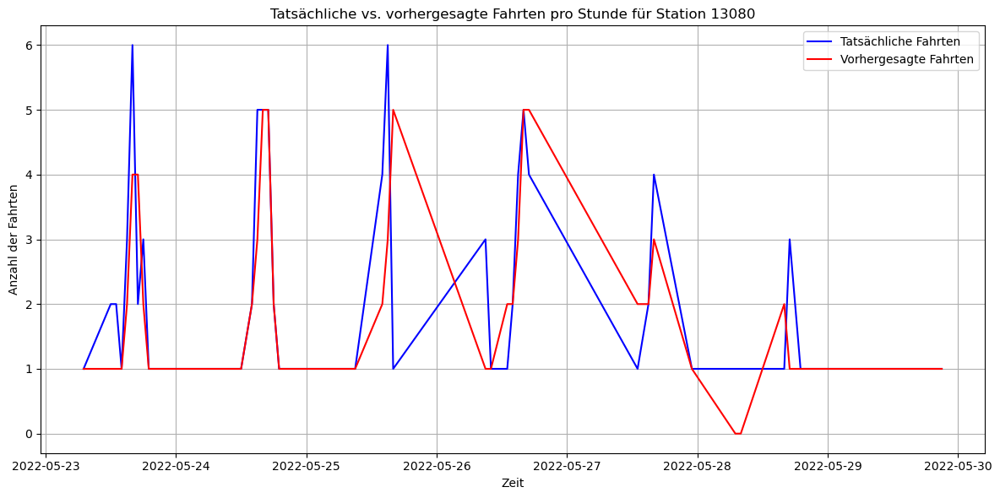

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


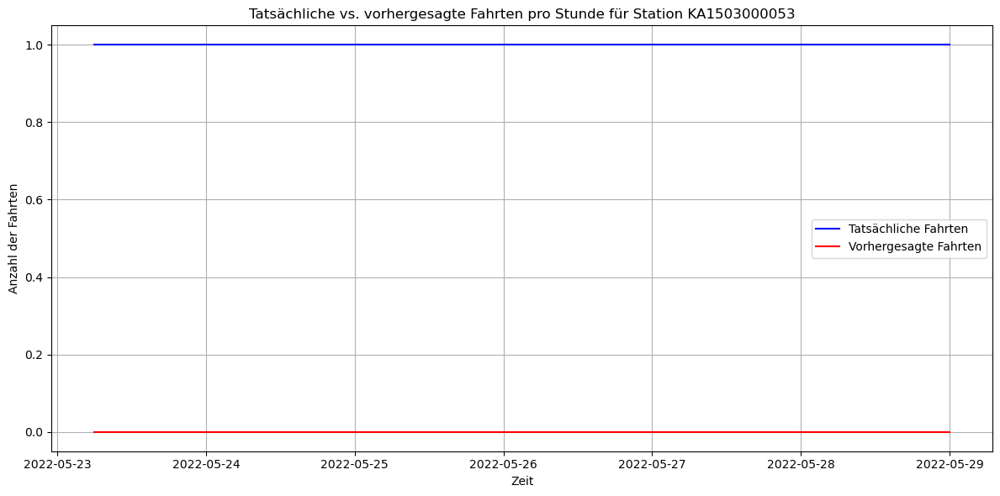

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


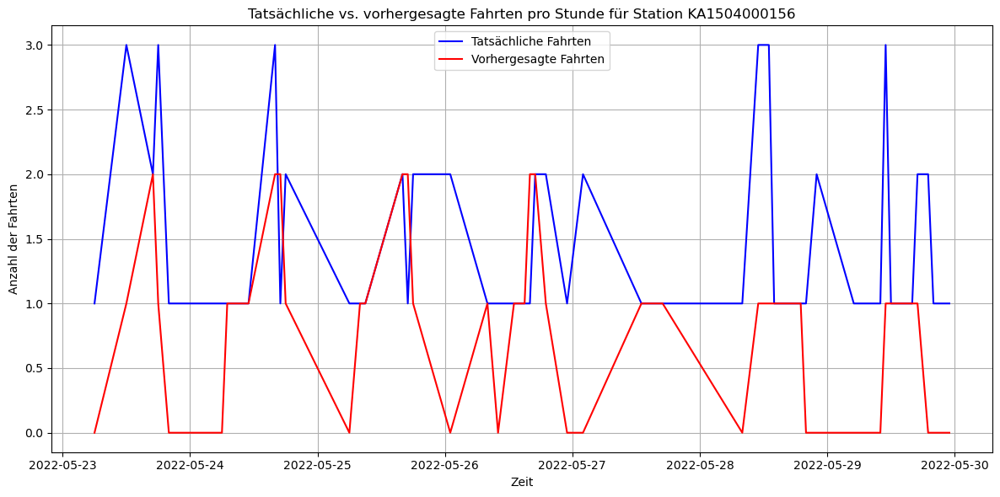

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


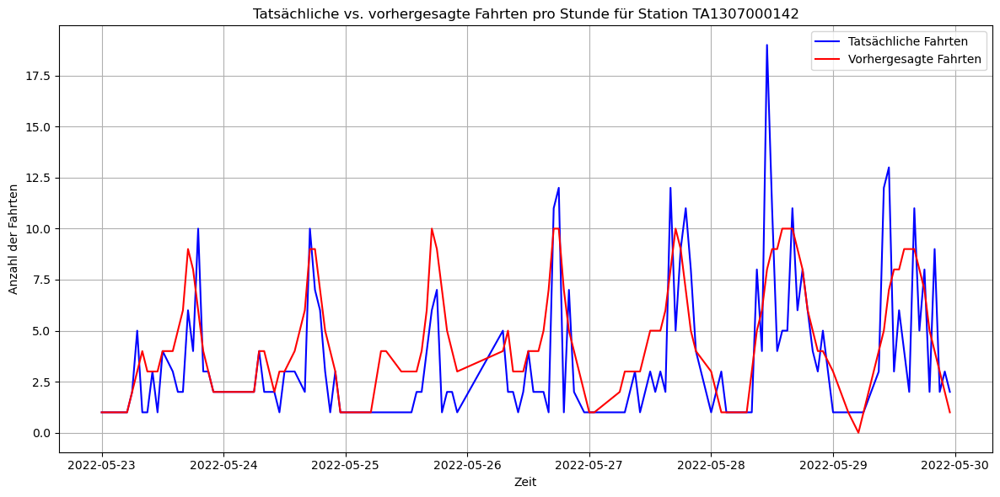

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


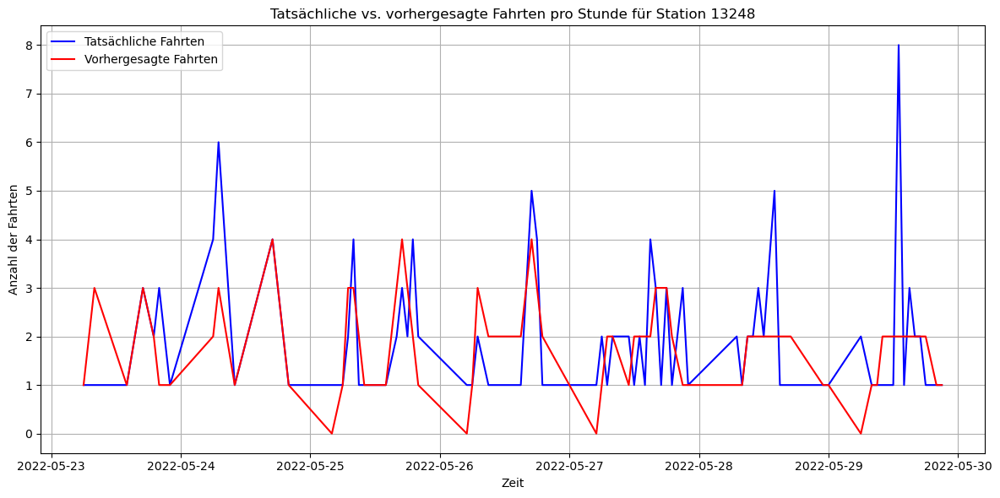

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


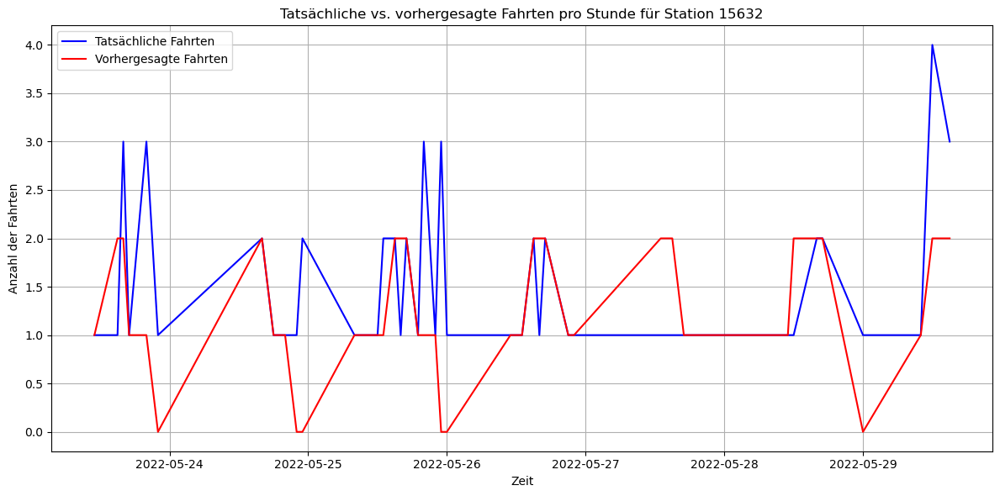

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


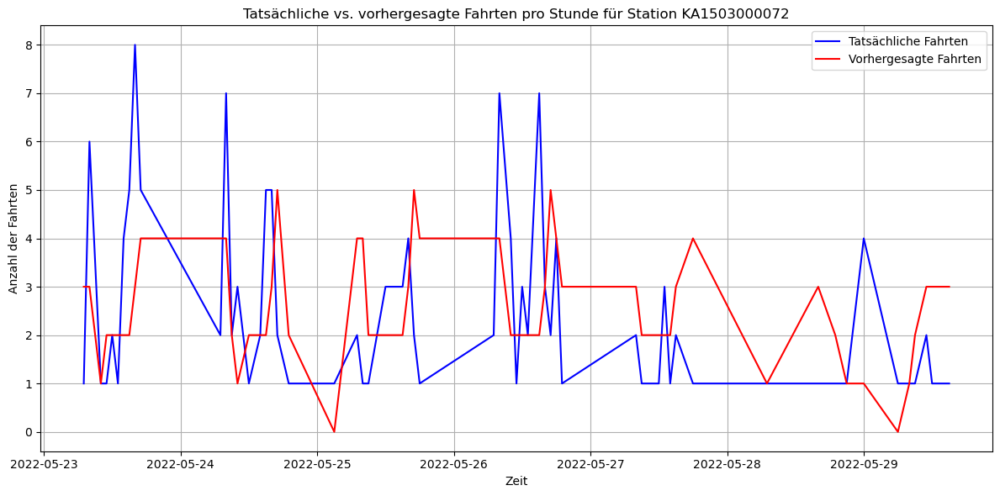

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


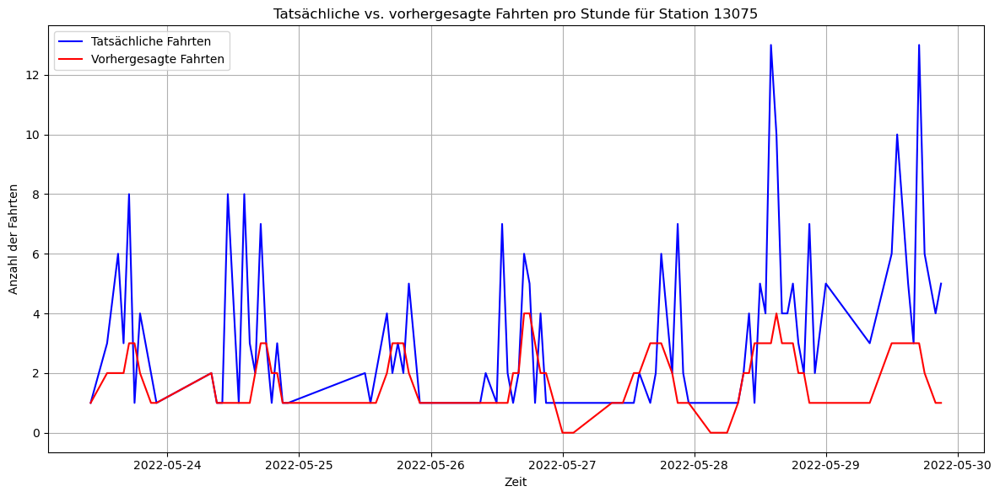

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


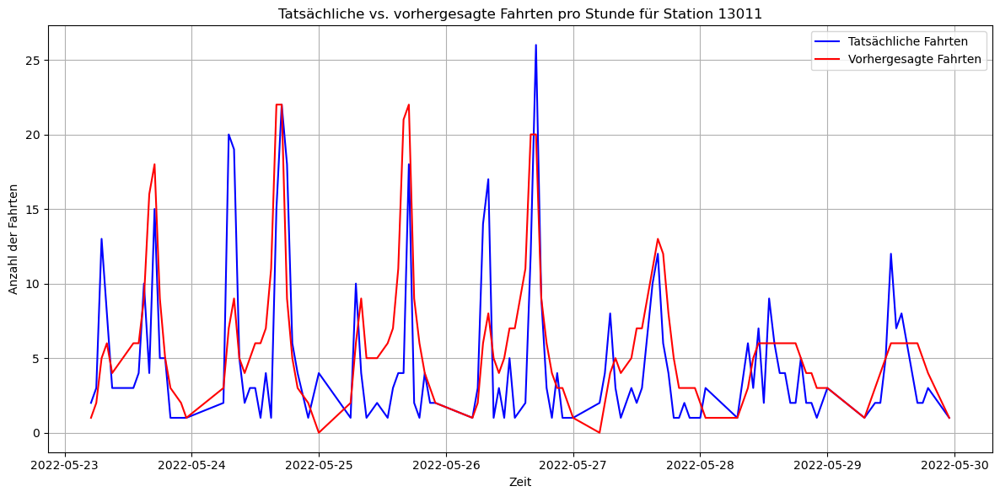

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


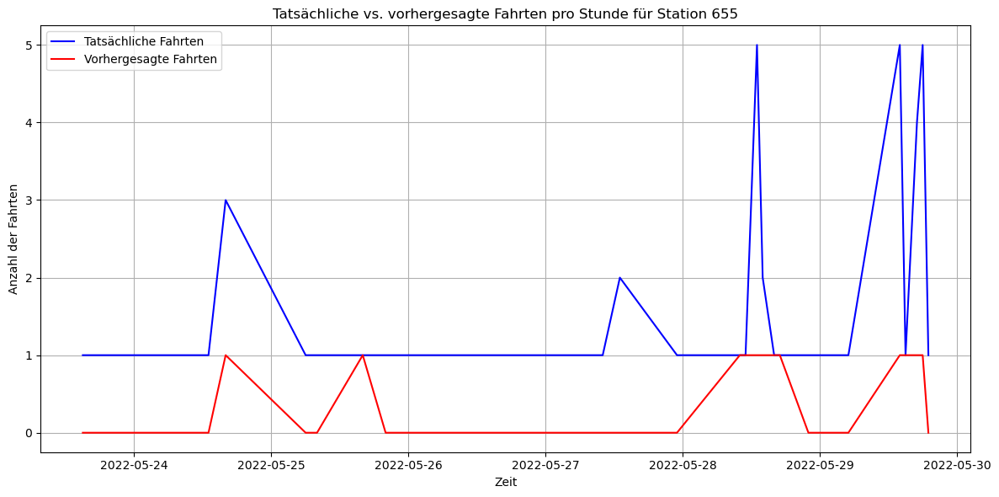

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


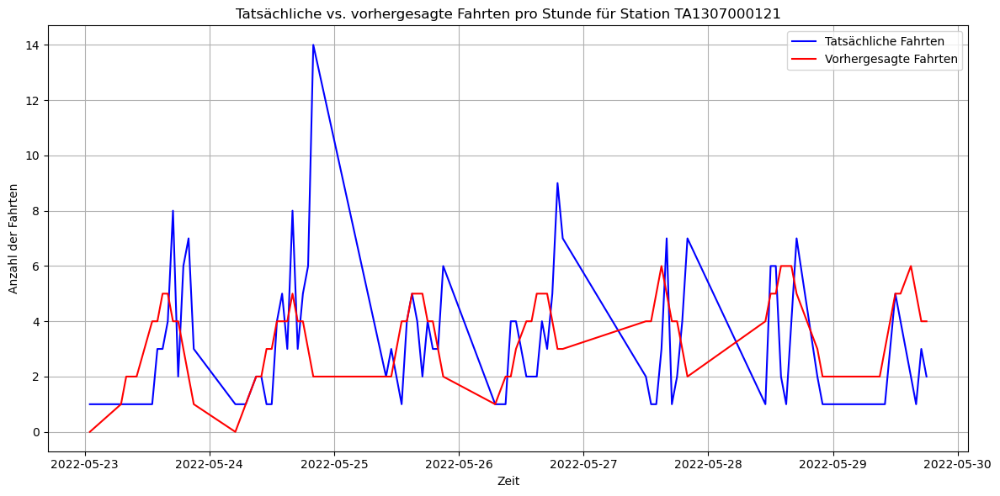

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


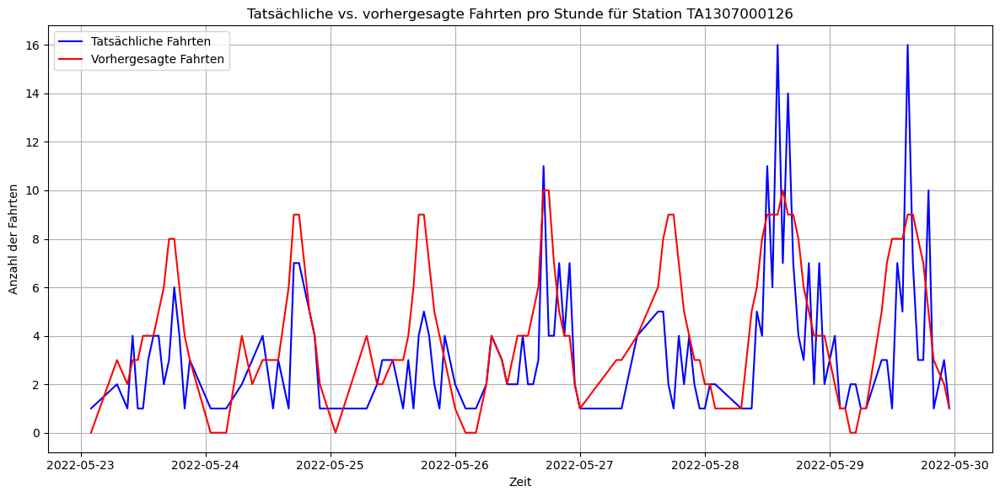

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


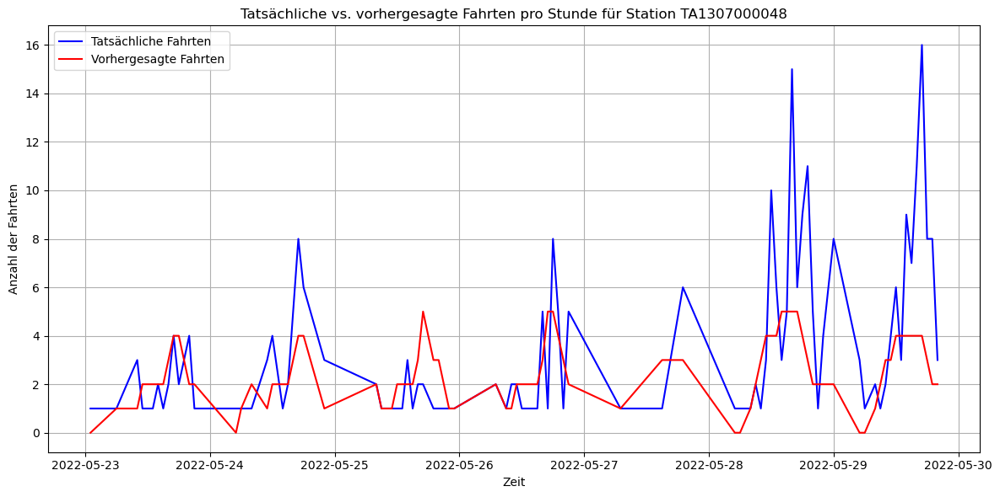

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/860719563.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')


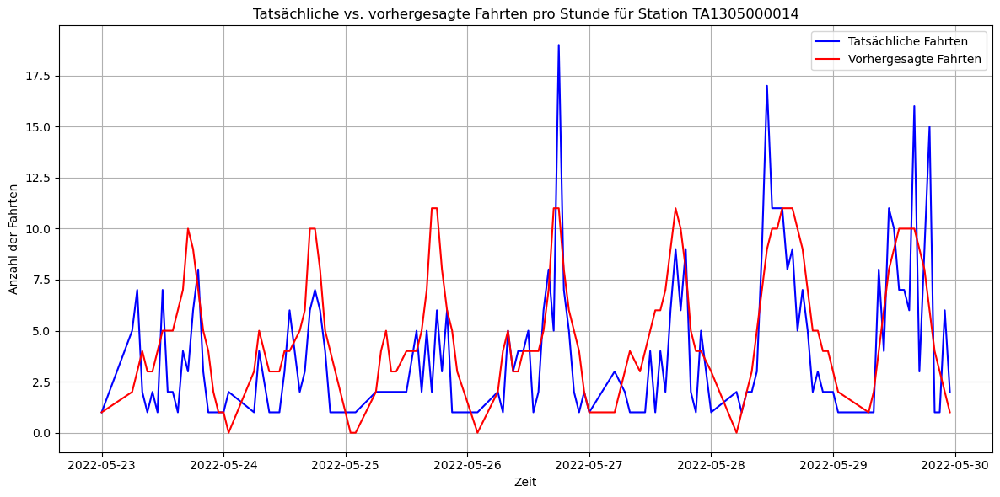

In [93]:
import matplotlib.pyplot as plt

# Wählen Sie die ersten 20 einzigartigen Stationen-IDs aus dem DataFrame aus
selected_station_ids = df['start_station_id'].unique()[:20]

for selected_station_id in selected_station_ids:
    actual_data = df[(df['start_station_id'] == selected_station_id) & 
                     (df['started_at'] >= '2022-05-23') & 
                     (df['started_at'] < '2022-05-30')]  # Passen Sie das Datum entsprechend an

    # Aggregieren der Daten nach Stunde
    actual_data['hour'] = actual_data['started_at'].dt.floor('H')
    actual_rides = actual_data.groupby('hour').size()

    # Tatsächliche Daten darstellen
    plt.figure(figsize=(12, 6))
    actual_time_index = actual_rides.index
    plt.plot(actual_time_index, actual_rides, label='Tatsächliche Fahrten', color='blue')

    # Vorhergesagte Daten vorbereiten
    predicted_data = detailed_forecasts.get(selected_station_id, {})
    forecast_values = [predicted_data.get((d.weekday(), d.hour), 0) for d in actual_time_index]

    # Vorhergesagte Fahrten darstellen
    plt.plot(actual_time_index, forecast_values, label='Vorhergesagte Fahrten', color='red')

    # Titel und Legende
    plt.title(f'Tatsächliche vs. vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')
    plt.xlabel('Zeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()  # Verbessert die Darstellung des Diagramms
    plt.show()


In [107]:
print(station_data.shape)  # Überprüfen, wie viele Datenpunkte vorhanden sind
print(weekly_data.shape)  # Überprüfen, wie viele Wochen Datenpunkte vorhanden sind

# Sicherstellen, dass genügend Daten für die Modellanpassung vorhanden sind
if weekly_data.shape[0] > 1:
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(weekly_data[['ds', 'y']])
    # und so weiter mit der Kreuzvalidierung und Leistungsbewertung
else:
    print(f"Nicht genügend Daten für Station {station_id} für die Modellierung.")


(0, 19)
(0, 20)
Nicht genügend Daten für Station example_station_id für die Modellierung.


In [108]:
valid_stations = df['start_station_id'].unique()

for station_id in valid_stations:
    station_data = df[df['start_station_id'] == station_id]
    station_data = station_data.set_index('started_at')
    weekly_data = station_data.resample('W').count().reset_index()
    
    if weekly_data.shape[0] > 1:
        print(f"Station {station_id} hat genügend Daten für die Modellierung.")
    else:
        print(f"Station {station_id} hat nicht genügend Daten.")


Station TA1307000117 hat genügend Daten für die Modellierung.
Station 13300 hat genügend Daten für die Modellierung.
Station TA1305000032 hat genügend Daten für die Modellierung.
Station 13196 hat genügend Daten für die Modellierung.
Station 13290 hat genügend Daten für die Modellierung.
Station TA1309000061 hat genügend Daten für die Modellierung.
Station 13080 hat genügend Daten für die Modellierung.
Station KA1503000053 hat genügend Daten für die Modellierung.
Station KA1504000156 hat genügend Daten für die Modellierung.
Station TA1307000142 hat genügend Daten für die Modellierung.
Station 13248 hat genügend Daten für die Modellierung.
Station 15632 hat genügend Daten für die Modellierung.
Station KA1503000072 hat genügend Daten für die Modellierung.
Station 13075 hat genügend Daten für die Modellierung.
Station 13011 hat genügend Daten für die Modellierung.
Station 655 hat genügend Daten für die Modellierung.
Station TA1307000121 hat genügend Daten für die Modellierung.
Station TA1

In [106]:
# Stelle sicher, dass 'started_at' als Index für das Resampling verwendet wird
station_data = station_data.set_index('started_at')

# Nun kannst du die Daten auf Wochenbasis aggregieren
weekly_data = station_data.resample('W').count().reset_index()
weekly_data.rename(columns={'ride_id': 'y'}, inplace=True)
weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

# Fortsetzung des Modelltrainings und der Kreuzvalidierung...
model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
model.fit(weekly_data[['ds', 'y']])

# Kreuzvalidierung durchführen
cv_results = cross_validation(model, initial='365 days', period='180 days', horizon='90 days')

# Leistungsmetriken berechnen
performance = performance_metrics(cv_results)

# Durchschnittliche Leistungsmetriken anzeigen
print(performance.mean())


ValueError: Dataframe has less than 2 non-NaN rows.

In [104]:


# Beispiel, wie du ein Modell für eine Station trainierst und testest
station_id = '13008'  # Beispiel-Station-ID
station_data = df[df['start_station_id'] == station_id]

# Aggregation der Daten auf Wochenbasis
weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
model.fit(weekly_data[['ds', 'y']])

# Kreuzvalidierung durchführen
# 'initial': die anfängliche Trainingsperiode
# 'period': der Abstand zwischen den Trainingsdatensätzen
# 'horizon': der Vorhersagehorizont
cv_results = cross_validation(model, initial='180 days', period='30 days', horizon='7 days')

# Leistungsmetriken berechnen
performance = performance_metrics(cv_results)

# Leistungsmetriken anzeigen
print(performance[['mae', 'rmse', 'mape']])


17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:54 - cmdstanpy - INFO - Chain [1] done processing
17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:54 - cmdstanpy - INFO - Chain [1] done processing
17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:54 - cmdstanpy - INFO - Chain [1] done processing
17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:54 - cmdstanpy - INFO - Chain [1] done processing
17:44:54 - cmdstanpy - INFO - Chain [1] start processing
17:44:55 - cmdstanpy - INFO - Chain [1] done processing
17:44:55 - cmdstanpy - INFO - Chain [1] start processing
17:44:55 - cmdstanpy - INFO - Chain [1] done processing


           mae         rmse       mape
0  1047.982389  1047.982389  16.902942
1   129.662017   129.662017   0.658183
2   332.471262   332.471262   1.142513
3   150.920054   150.920054   1.278984
4    35.704189    35.704189   0.793426
5   221.042322   221.042322   0.713040


In [100]:
from prophet.diagnostics import cross_validation, performance_metrics
import pandas as pd
from prophet import Prophet

df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)

overall_performance = pd.DataFrame()  # Ein DataFrame, um die gesamten Leistungsmetriken zu speichern

for station_id in df['start_station_id'].unique():
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf Wochenbasis
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
    weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(weekly_data[['ds', 'y']])

    # Kreuzvalidierung durchführen
    # Annahme, dass du mindestens ein Jahr Daten hast, um mit einer gewissen Saisonalität zu trainieren
    cv_results = cross_validation(model, initial='180 days', period='30 days', horizon='7 days')


    # Leistungsmetriken für die Station berechnen
    performance = performance_metrics(cv_results)

    # Füge die Station-ID zu den Leistungsmetriken hinzu, um zu identifizieren, von welcher Station sie kommen
    performance['station_id'] = station_id

    # Sammle die Leistungsmetriken für alle Stationen
    overall_performance = pd.concat([overall_performance, performance])

# Berechne durchschnittliche Leistungsmetriken über alle Stationen
average_performance = overall_performance.groupby('station_id').mean()

# Zeige die durchschnittlichen Metriken an
print(average_performance)


17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:31 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing
17:22:32 - cmdstanpy - INFO - Chain [1] start processing
17:22:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:32 - cmdstanpy - INFO - Chain [1] start processing
17:22:32 - cmdstanpy - INFO - Chain [1] done processing
17:22:32 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing
17:22:33 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing
17:22:33 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing
17:22:33 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing
17:22:33 - cmdstanpy - INFO - Chain [1] start processing
17:22:33 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:34 - cmdstanpy - INFO - Chain [1] done processing
17:22:34 - cmdstanpy - INFO - Chain [1] start processing
17:22:35 - cmdstanpy - INFO - Chain [1] done processing
17:22:35 - cmdstanpy - INFO - Chain [1] start processing
17:22:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:35 - cmdstanpy - INFO - Chain [1] start processing
17:22:35 - cmdstanpy - INFO - Chain [1] done processing
17:22:35 - cmdstanpy - INFO - Chain [1] start processing
17:22:35 - cmdstanpy - INFO - Chain [1] done processing
17:22:35 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1] done processing
17:22:36 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1] done processing
17:22:36 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1] done processing
17:22:36 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1] done processing
17:22:36 - cmdstanpy - INFO - Chain [1] start processing
17:22:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:36 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing
17:22:37 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing
17:22:37 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing
17:22:37 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing
17:22:37 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing
17:22:37 - cmdstanpy - INFO - Chain [1] start processing
17:22:37 - cmdstanpy - INFO - Chain [1] done processing
17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:38 - cmdstanpy - INFO - Chain [1] done processing
17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:38 - cmdstanpy - INFO - Chain [1] done processing
17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:38 - cmdstanpy - INFO - Chain [1] done processing
17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:38 - cmdstanpy - INFO - Chain [1] done processing
17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:38 - cmdstanpy - INFO - Chain [1] done processing
17:22:38 - cmdstanpy - INFO - Chain [1] start processing
17:22:39 - cmdstanpy - INFO - Chain [1] done processing
17:22:39 - cmdstanpy - INFO - Chain [1] start processing
17:22:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:39 - cmdstanpy - INFO - Chain [1] start processing
17:22:39 - cmdstanpy - INFO - Chain [1] done processing
17:22:39 - cmdstanpy - INFO - Chain [1] start processing
17:22:39 - cmdstanpy - INFO - Chain [1] done processing
17:22:39 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:40 - cmdstanpy - INFO - Chain [1] start processing
17:22:40 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:41 - cmdstanpy - INFO - Chain [1] done processing
17:22:41 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:42 - cmdstanpy - INFO - Chain [1] start processing
17:22:42 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:43 - cmdstanpy - INFO - Chain [1] done processing
17:22:43 - cmdstanpy - INFO - Chain [1] start processing
17:22:44 - cmdstanpy - INFO - Chain [1] done processing
17:22:44 - cmdstanpy - INFO - Chain [1] start processing
17:22:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:44 - cmdstanpy - INFO - Chain [1] start processing
17:22:44 - cmdstanpy - INFO - Chain [1] done processing
17:22:44 - cmdstanpy - INFO - Chain [1] start processing
17:22:45 - cmdstanpy - INFO - Chain [1] done processing
17:22:45 - cmdstanpy - INFO - Chain [1] start processing
17:22:45 - cmdstanpy - INFO - Chain [1] done processing
17:22:45 - cmdstanpy - INFO - Chain [1] start processing
17:22:45 - cmdstanpy - INFO - Chain [1] done processing
17:22:45 - cmdstanpy - INFO - Chain [1] start processing
17:22:45 - cmdstanpy - INFO - Chain [1] done processing
17:22:45 - cmdstanpy - INFO - Chain [1] start processing
17:22:45 - cmdstanpy - INFO - Chain [1] done processing
17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
17:22:46 - cmdstanpy - INFO - Chain [1] start processing
17:22:46 - cmdstanpy - INFO - Chain [1] done processing
17:22:47 - cmdstanpy - INFO - Chain [1] start processing
17:22:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:47 - cmdstanpy - INFO - Chain [1] start processing
17:22:47 - cmdstanpy - INFO - Chain [1] done processing
17:22:47 - cmdstanpy - INFO - Chain [1] start processing
17:22:47 - cmdstanpy - INFO - Chain [1] done processing
17:22:47 - cmdstanpy - INFO - Chain [1] start processing
17:22:48 - cmdstanpy - INFO - Chain [1] done processing
17:22:48 - cmdstanpy - INFO - Chain [1] start processing
17:22:48 - cmdstanpy - INFO - Chain [1] done processing
17:22:48 - cmdstanpy - INFO - Chain [1] start processing
17:22:48 - cmdstanpy - INFO - Chain [1] done processing
17:22:48 - cmdstanpy - INFO - Chain [1] start processing
17:22:48 - cmdstanpy - INFO - Chain [1] done processing
17:22:49 - cmdstanpy - INFO - Chain [1] start processing
17:22:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:49 - cmdstanpy - INFO - Chain [1] start processing
17:22:49 - cmdstanpy - INFO - Chain [1] done processing
17:22:49 - cmdstanpy - INFO - Chain [1] start processing
17:22:49 - cmdstanpy - INFO - Chain [1] done processing
17:22:49 - cmdstanpy - INFO - Chain [1] start processing
17:22:49 - cmdstanpy - INFO - Chain [1] done processing
17:22:49 - cmdstanpy - INFO - Chain [1] start processing
17:22:50 - cmdstanpy - INFO - Chain [1] done processing
17:22:50 - cmdstanpy - INFO - Chain [1] start processing
17:22:50 - cmdstanpy - INFO - Chain [1] done processing
17:22:50 - cmdstanpy - INFO - Chain [1] start processing
17:22:50 - cmdstanpy - INFO - Chain [1] done processing
17:22:51 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:51 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing
17:22:51 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing
17:22:51 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing
17:22:51 - cmdstanpy - INFO - Chain [1] start processing
17:22:51 - cmdstanpy - INFO - Chain [1] done processing
17:22:51 - cmdstanpy - INFO - Chain [1] start processing
17:22:52 - cmdstanpy - INFO - Chain [1] done processing
17:22:52 - cmdstanpy - INFO - Chain [1] start processing
17:22:52 - cmdstanpy - INFO - Chain [1] done processing
17:22:52 - cmdstanpy - INFO - Chain [1] start processing
17:22:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:53 - cmdstanpy - INFO - Chain [1] done processing
17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:53 - cmdstanpy - INFO - Chain [1] done processing
17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:53 - cmdstanpy - INFO - Chain [1] done processing
17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:53 - cmdstanpy - INFO - Chain [1] done processing
17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:53 - cmdstanpy - INFO - Chain [1] done processing
17:22:53 - cmdstanpy - INFO - Chain [1] start processing
17:22:53 - cmdstanpy - INFO - Chain [1] done processing
17:22:54 - cmdstanpy - INFO - Chain [1] start processing
17:22:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:54 - cmdstanpy - INFO - Chain [1] start processing
17:22:54 - cmdstanpy - INFO - Chain [1] done processing
17:22:54 - cmdstanpy - INFO - Chain [1] start processing
17:22:54 - cmdstanpy - INFO - Chain [1] done processing
17:22:54 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing
17:22:55 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing
17:22:55 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing
17:22:55 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing
17:22:55 - cmdstanpy - INFO - Chain [1] start processing
17:22:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:56 - cmdstanpy - INFO - Chain [1] done processing
17:22:56 - cmdstanpy - INFO - Chain [1] start processing
17:22:57 - cmdstanpy - INFO - Chain [1] done processing
17:22:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:57 - cmdstanpy - INFO - Chain [1] done processing
17:22:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:22:58 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:22:59 - cmdstanpy - INFO - Chain [1] start processing
17:22:59 - cmdstanpy - INFO - Chain [1] done processing
17:23:00 - cmdstanpy - INFO - Chain [1] start processing
17:23:00 - cmdstanpy - INFO - Chain [1] done processing
17:23:00 - cmdstanpy - INFO - Chain [1] start processing
17:23:00 - cmdstanpy - INFO - Chain [1] done processing
17:23:00 - cmdstanpy - INFO - Chain [1] start processing
17:23:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:00 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:01 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:01 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:01 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:01 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:01 - cmdstanpy - INFO - Chain [1] start processing
17:23:01 - cmdstanpy - INFO - Chain [1] done processing
17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:02 - cmdstanpy - INFO - Chain [1] done processing
17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:02 - cmdstanpy - INFO - Chain [1] done processing
17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:02 - cmdstanpy - INFO - Chain [1] done processing
17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:02 - cmdstanpy - INFO - Chain [1] done processing
17:23:02 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing
17:23:03 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing
17:23:03 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:03 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing
17:23:03 - cmdstanpy - INFO - Chain [1] start processing
17:23:03 - cmdstanpy - INFO - Chain [1] done processing
17:23:03 - cmdstanpy - INFO - Chain [1] start processing
17:23:04 - cmdstanpy - INFO - Chain [1] done processing
17:23:04 - cmdstanpy - INFO - Chain [1] start processing
17:23:04 - cmdstanpy - INFO - Chain [1] done processing
17:23:04 - cmdstanpy - INFO - Chain [1] start processing
17:23:04 - cmdstanpy - INFO - Chain [1] done processing
17:23:04 - cmdstanpy - INFO - Chain [1] start processing
17:23:04 - cmdstanpy - INFO - Chain [1] done processing
17:23:04 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:05 - cmdstanpy - INFO - Chain [1] start processing
17:23:05 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:06 - cmdstanpy - INFO - Chain [1] done processing
17:23:06 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
17:23:07 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
17:23:07 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:07 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
17:23:07 - cmdstanpy - INFO - Chain [1] start processing
17:23:07 - cmdstanpy - INFO - Chain [1] done processing
17:23:07 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:08 - cmdstanpy - INFO - Chain [1] done processing
17:23:08 - cmdstanpy - INFO - Chain [1] start processing
17:23:09 - cmdstanpy - INFO - Chain [1] done processing
17:23:09 - cmdstanpy - INFO - Chain [1] start processing
17:23:09 - cmdstanpy - INFO - Chain [1] done processing
17:23:09 - cmdstanpy - INFO - Chain [1] start processing
17:23:09 - cmdstanpy - INFO - Chain [1] done processing
17:23:09 - cmdstanpy - INFO - Chain [1] start processing
17:23:09 - cmdstanpy - INFO - Chain [1] done processing
17:23:09 - cmdstanpy - INFO - Chain [1] start processing
17:23:09 - cmdstanpy - INFO - Chain [1] done processing
17:23:09 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:10 - cmdstanpy - INFO - Chain [1] start processing
17:23:10 - cmdstanpy - INFO - Chain [1] done processing
17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:11 - cmdstanpy - INFO - Chain [1] done processing
17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:11 - cmdstanpy - INFO - Chain [1] done processing
17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:11 - cmdstanpy - INFO - Chain [1] done processing
17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:11 - cmdstanpy - INFO - Chain [1] done processing
17:23:11 - cmdstanpy - INFO - Chain [1] start processing
17:23:12 - cmdstanpy - INFO - Chain [1] done processing
17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:12 - cmdstanpy - INFO - Chain [1] done processing
17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:12 - cmdstanpy - INFO - Chain [1] done processing
17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:12 - cmdstanpy - INFO - Chain [1] done processing
17:23:12 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing
17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing
17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing
17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing
17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:14 - cmdstanpy - INFO - Chain [1] done processing
17:23:14 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
17:23:15 - cmdstanpy - INFO - Chain [1] start processing
17:23:15 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:16 - cmdstanpy - INFO - Chain [1] done processing
17:23:16 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:17 - cmdstanpy - INFO - Chain [1] done processing
17:23:17 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:18 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:19 - cmdstanpy - INFO - Chain [1] start processing
17:23:19 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:20 - cmdstanpy - INFO - Chain [1] done processing
17:23:20 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing
17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing
17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing
17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:22 - cmdstanpy - INFO - Chain [1] done processing
17:23:22 - cmdstanpy - INFO - Chain [1] start processing
17:23:22 - cmdstanpy - INFO - Chain [1] done processing
17:23:22 - cmdstanpy - INFO - Chain [1] start processing
17:23:22 - cmdstanpy - INFO - Chain [1] done processing
17:23:22 - cmdstanpy - INFO - Chain [1] start processing
17:23:22 - cmdstanpy - INFO - Chain [1] done processing
17:23:22 - cmdstanpy - INFO - Chain [1] start processing
17:23:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:22 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing
17:23:23 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing
17:23:23 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing
17:23:23 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing
17:23:23 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing
17:23:23 - cmdstanpy - INFO - Chain [1] start processing
17:23:23 - cmdstanpy - INFO - Chain [1] done processing
17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing
17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing
17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing
17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing
17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:24 - cmdstanpy - INFO - Chain [1] done processing
17:23:24 - cmdstanpy - INFO - Chain [1] start processing
17:23:25 - cmdstanpy - INFO - Chain [1] done processing
17:23:25 - cmdstanpy - INFO - Chain [1] start processing
17:23:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:25 - cmdstanpy - INFO - Chain [1] start processing
17:23:25 - cmdstanpy - INFO - Chain [1] done processing
17:23:25 - cmdstanpy - INFO - Chain [1] start processing
17:23:25 - cmdstanpy - INFO - Chain [1] done processing
17:23:25 - cmdstanpy - INFO - Chain [1] start processing
17:23:26 - cmdstanpy - INFO - Chain [1] done processing
17:23:26 - cmdstanpy - INFO - Chain [1] start processing
17:23:26 - cmdstanpy - INFO - Chain [1] done processing
17:23:26 - cmdstanpy - INFO - Chain [1] start processing
17:23:26 - cmdstanpy - INFO - Chain [1] done processing
17:23:26 - cmdstanpy - INFO - Chain [1] start processing
17:23:26 - cmdstanpy - INFO - Chain [1] done processing
17:23:26 - cmdstanpy - INFO - Chain [1] start processing
17:23:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:26 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing
17:23:27 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing
17:23:27 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing
17:23:27 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing
17:23:27 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing
17:23:27 - cmdstanpy - INFO - Chain [1] start processing
17:23:27 - cmdstanpy - INFO - Chain [1] done processing
17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing
17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing
17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing
17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing
17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:28 - cmdstanpy - INFO - Chain [1] done processing
17:23:28 - cmdstanpy - INFO - Chain [1] start processing
17:23:29 - cmdstanpy - INFO - Chain [1] done processing
17:23:29 - cmdstanpy - INFO - Chain [1] start processing
17:23:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:29 - cmdstanpy - INFO - Chain [1] start processing
17:23:29 - cmdstanpy - INFO - Chain [1] done processing
17:23:29 - cmdstanpy - INFO - Chain [1] start processing
17:23:29 - cmdstanpy - INFO - Chain [1] done processing
17:23:29 - cmdstanpy - INFO - Chain [1] start processing
17:23:30 - cmdstanpy - INFO - Chain [1] done processing
17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:30 - cmdstanpy - INFO - Chain [1] done processing
17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:30 - cmdstanpy - INFO - Chain [1] done processing
17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:30 - cmdstanpy - INFO - Chain [1] done processing
17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
17:23:31 - cmdstanpy - INFO - Chain [1] start processing
17:23:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:32 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing
17:23:32 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing
17:23:32 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing
17:23:32 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing
17:23:32 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing
17:23:32 - cmdstanpy - INFO - Chain [1] start processing
17:23:32 - cmdstanpy - INFO - Chain [1] done processing
17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
17:23:33 - cmdstanpy - INFO - Chain [1] start processing
17:23:33 - cmdstanpy - INFO - Chain [1] done processing
17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:34 - cmdstanpy - INFO - Chain [1] done processing
17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:34 - cmdstanpy - INFO - Chain [1] done processing
17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:34 - cmdstanpy - INFO - Chain [1] done processing
17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:34 - cmdstanpy - INFO - Chain [1] done processing
17:23:34 - cmdstanpy - INFO - Chain [1] start processing
17:23:35 - cmdstanpy - INFO - Chain [1] done processing
17:23:35 - cmdstanpy - INFO - Chain [1] start processing
17:23:35 - cmdstanpy - INFO - Chain [1] done processing
17:23:35 - cmdstanpy - INFO - Chain [1] start processing
17:23:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:35 - cmdstanpy - INFO - Chain [1] start processing
17:23:35 - cmdstanpy - INFO - Chain [1] done processing
17:23:35 - cmdstanpy - INFO - Chain [1] start processing
17:23:35 - cmdstanpy - INFO - Chain [1] done processing
17:23:36 - cmdstanpy - INFO - Chain [1] start processing
17:23:36 - cmdstanpy - INFO - Chain [1] done processing
17:23:36 - cmdstanpy - INFO - Chain [1] start processing
17:23:36 - cmdstanpy - INFO - Chain [1] done processing
17:23:36 - cmdstanpy - INFO - Chain [1] start processing
17:23:36 - cmdstanpy - INFO - Chain [1] done processing
17:23:36 - cmdstanpy - INFO - Chain [1] start processing
17:23:36 - cmdstanpy - INFO - Chain [1] done processing
17:23:36 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
17:23:37 - cmdstanpy - INFO - Chain [1] start processing
17:23:37 - cmdstanpy - INFO - Chain [1] done processing
17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing
17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing
17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing
17:23:38 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing
17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:39 - cmdstanpy - INFO - Chain [1] done processing
17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:39 - cmdstanpy - INFO - Chain [1] done processing
17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:39 - cmdstanpy - INFO - Chain [1] done processing
17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:40 - cmdstanpy - INFO - Chain [1] start processing
17:23:40 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:41 - cmdstanpy - INFO - Chain [1] done processing
17:23:41 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:42 - cmdstanpy - INFO - Chain [1] done processing
17:23:42 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1] done processing
17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1] done processing
17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1] done processing
17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:43 - cmdstanpy - INFO - Chain [1] done processing
17:23:43 - cmdstanpy - INFO - Chain [1] start processing
17:23:44 - cmdstanpy - INFO - Chain [1] done processing
17:23:44 - cmdstanpy - INFO - Chain [1] start processing
17:23:44 - cmdstanpy - INFO - Chain [1] done processing
17:23:44 - cmdstanpy - INFO - Chain [1] start processing
17:23:44 - cmdstanpy - INFO - Chain [1] done processing
17:23:44 - cmdstanpy - INFO - Chain [1] start processing
17:23:44 - cmdstanpy - INFO - Chain [1] done processing
17:23:44 - cmdstanpy - INFO - Chain [1] start processing
17:23:44 - cmdstanpy - INFO - Chain [1] done processing
17:23:44 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
17:23:45 - cmdstanpy - INFO - Chain [1] start processing
17:23:45 - cmdstanpy - INFO - Chain [1] done processing
17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing
17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing
17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing
17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing
17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:46 - cmdstanpy - INFO - Chain [1] done processing
17:23:46 - cmdstanpy - INFO - Chain [1] start processing
17:23:47 - cmdstanpy - INFO - Chain [1] done processing
17:23:47 - cmdstanpy - INFO - Chain [1] start processing
17:23:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:47 - cmdstanpy - INFO - Chain [1] start processing
17:23:47 - cmdstanpy - INFO - Chain [1] done processing
17:23:47 - cmdstanpy - INFO - Chain [1] start processing
17:23:47 - cmdstanpy - INFO - Chain [1] done processing
17:23:47 - cmdstanpy - INFO - Chain [1] start processing
17:23:47 - cmdstanpy - INFO - Chain [1] done processing
17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:48 - cmdstanpy - INFO - Chain [1] done processing
17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:48 - cmdstanpy - INFO - Chain [1] done processing
17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:48 - cmdstanpy - INFO - Chain [1] done processing
17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:48 - cmdstanpy - INFO - Chain [1] start processing
17:23:48 - cmdstanpy - INFO - Chain [1] done processing
17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:49 - cmdstanpy - INFO - Chain [1] done processing
17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:49 - cmdstanpy - INFO - Chain [1] done processing
17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:49 - cmdstanpy - INFO - Chain [1] done processing
17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:49 - cmdstanpy - INFO - Chain [1] done processing
17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:49 - cmdstanpy - INFO - Chain [1] done processing
17:23:49 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing
17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing
17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing
17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing
17:23:50 - cmdstanpy - INFO - Chain [1] start processing
17:23:50 - cmdstanpy - INFO - Chain [1] done processing
17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing
17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing
17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing
17:23:51 - cmdstanpy - INFO - Chain [1] start processing
17:23:51 - cmdstanpy - INFO - Chain [1] done processing
17:23:52 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing
17:23:52 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing
17:23:52 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing
17:23:52 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:53 - cmdstanpy - INFO - Chain [1] done processing
17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:54 - cmdstanpy - INFO - Chain [1] start processing
17:23:54 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:55 - cmdstanpy - INFO - Chain [1] done processing
17:23:55 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:56 - cmdstanpy - INFO - Chain [1] start processing
17:23:56 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:57 - cmdstanpy - INFO - Chain [1] done processing
17:23:57 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:58 - cmdstanpy - INFO - Chain [1] done processing
17:23:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:59 - cmdstanpy - INFO - Chain [1] done processing
17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:23:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:23:59 - cmdstanpy - INFO - Chain [1] done processing
17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:23:59 - cmdstanpy - INFO - Chain [1] done processing
17:23:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing
17:24:00 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing
17:24:00 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing
17:24:00 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing
17:24:01 - cmdstanpy - INFO - Chain [1] start processing
17:24:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:01 - cmdstanpy - INFO - Chain [1] start processing
17:24:01 - cmdstanpy - INFO - Chain [1] done processing
17:24:01 - cmdstanpy - INFO - Chain [1] start processing
17:24:01 - cmdstanpy - INFO - Chain [1] done processing
17:24:01 - cmdstanpy - INFO - Chain [1] start processing
17:24:01 - cmdstanpy - INFO - Chain [1] done processing
17:24:02 - cmdstanpy - INFO - Chain [1] start processing
17:24:02 - cmdstanpy - INFO - Chain [1] done processing
17:24:02 - cmdstanpy - INFO - Chain [1] start processing
17:24:02 - cmdstanpy - INFO - Chain [1] done processing
17:24:02 - cmdstanpy - INFO - Chain [1] start processing
17:24:02 - cmdstanpy - INFO - Chain [1] done processing
17:24:03 - cmdstanpy - INFO - Chain [1] start processing
17:24:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:03 - cmdstanpy - INFO - Chain [1] start processing
17:24:03 - cmdstanpy - INFO - Chain [1] done processing
17:24:03 - cmdstanpy - INFO - Chain [1] start processing
17:24:03 - cmdstanpy - INFO - Chain [1] done processing
17:24:03 - cmdstanpy - INFO - Chain [1] start processing
17:24:03 - cmdstanpy - INFO - Chain [1] done processing
17:24:03 - cmdstanpy - INFO - Chain [1] start processing
17:24:03 - cmdstanpy - INFO - Chain [1] done processing
17:24:04 - cmdstanpy - INFO - Chain [1] start processing
17:24:04 - cmdstanpy - INFO - Chain [1] done processing
17:24:04 - cmdstanpy - INFO - Chain [1] start processing
17:24:04 - cmdstanpy - INFO - Chain [1] done processing
17:24:04 - cmdstanpy - INFO - Chain [1] start processing
17:24:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:04 - cmdstanpy - INFO - Chain [1] start processing
17:24:05 - cmdstanpy - INFO - Chain [1] done processing
17:24:05 - cmdstanpy - INFO - Chain [1] start processing
17:24:05 - cmdstanpy - INFO - Chain [1] done processing
17:24:05 - cmdstanpy - INFO - Chain [1] start processing
17:24:06 - cmdstanpy - INFO - Chain [1] done processing
17:24:06 - cmdstanpy - INFO - Chain [1] start processing
17:24:06 - cmdstanpy - INFO - Chain [1] done processing
17:24:06 - cmdstanpy - INFO - Chain [1] start processing
17:24:06 - cmdstanpy - INFO - Chain [1] done processing
17:24:07 - cmdstanpy - INFO - Chain [1] start processing
17:24:07 - cmdstanpy - INFO - Chain [1] done processing
17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
17:24:08 - cmdstanpy - INFO - Chain [1] start processing
17:24:08 - cmdstanpy - INFO - Chain [1] done processing
17:24:09 - cmdstanpy - INFO - Chain [1] start processing
17:24:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:09 - cmdstanpy - INFO - Chain [1] start processing
17:24:09 - cmdstanpy - INFO - Chain [1] done processing
17:24:09 - cmdstanpy - INFO - Chain [1] start processing
17:24:10 - cmdstanpy - INFO - Chain [1] done processing
17:24:10 - cmdstanpy - INFO - Chain [1] start processing
17:24:10 - cmdstanpy - INFO - Chain [1] done processing
17:24:10 - cmdstanpy - INFO - Chain [1] start processing
17:24:10 - cmdstanpy - INFO - Chain [1] done processing
17:24:10 - cmdstanpy - INFO - Chain [1] start processing
17:24:10 - cmdstanpy - INFO - Chain [1] done processing
17:24:10 - cmdstanpy - INFO - Chain [1] start processing
17:24:10 - cmdstanpy - INFO - Chain [1] done processing
17:24:11 - cmdstanpy - INFO - Chain [1] start processing
17:24:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:11 - cmdstanpy - INFO - Chain [1] start processing
17:24:11 - cmdstanpy - INFO - Chain [1] done processing
17:24:11 - cmdstanpy - INFO - Chain [1] start processing
17:24:11 - cmdstanpy - INFO - Chain [1] done processing
17:24:11 - cmdstanpy - INFO - Chain [1] start processing
17:24:11 - cmdstanpy - INFO - Chain [1] done processing
17:24:12 - cmdstanpy - INFO - Chain [1] start processing
17:24:12 - cmdstanpy - INFO - Chain [1] done processing
17:24:12 - cmdstanpy - INFO - Chain [1] start processing
17:24:12 - cmdstanpy - INFO - Chain [1] done processing
17:24:12 - cmdstanpy - INFO - Chain [1] start processing
17:24:12 - cmdstanpy - INFO - Chain [1] done processing
17:24:13 - cmdstanpy - INFO - Chain [1] start processing
17:24:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:13 - cmdstanpy - INFO - Chain [1] start processing
17:24:13 - cmdstanpy - INFO - Chain [1] done processing
17:24:13 - cmdstanpy - INFO - Chain [1] start processing
17:24:13 - cmdstanpy - INFO - Chain [1] done processing
17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing
17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing
17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing
17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing
17:24:14 - cmdstanpy - INFO - Chain [1] start processing
17:24:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing
17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing
17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing
17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:16 - cmdstanpy - INFO - Chain [1] done processing
17:24:16 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing
17:24:17 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing
17:24:17 - cmdstanpy - INFO - Chain [1] start processing
17:24:17 - cmdstanpy - INFO - Chain [1] done processing
17:24:17 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:18 - cmdstanpy - INFO - Chain [1] start processing
17:24:18 - cmdstanpy - INFO - Chain [1] done processing
17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing
17:24:19 - cmdstanpy - INFO - Chain [1] start processing
17:24:20 - cmdstanpy - INFO - Chain [1] done processing
17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:20 - cmdstanpy - INFO - Chain [1] done processing
17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:20 - cmdstanpy - INFO - Chain [1] done processing
17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing
17:24:21 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing
17:24:21 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing
17:24:21 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing
17:24:21 - cmdstanpy - INFO - Chain [1] start processing
17:24:21 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:22 - cmdstanpy - INFO - Chain [1] done processing
17:24:22 - cmdstanpy - INFO - Chain [1] start processing
17:24:23 - cmdstanpy - INFO - Chain [1] done processing
17:24:23 - cmdstanpy - INFO - Chain [1] start processing
17:24:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:24 - cmdstanpy - INFO - Chain [1] start processing
17:24:24 - cmdstanpy - INFO - Chain [1] done processing
17:24:25 - cmdstanpy - INFO - Chain [1] start processing
17:24:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:25 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing
17:24:26 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing
17:24:26 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing
17:24:26 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing
17:24:26 - cmdstanpy - INFO - Chain [1] start processing
17:24:26 - cmdstanpy - INFO - Chain [1] done processing
17:24:27 - cmdstanpy - INFO - Chain [1] start processing
17:24:27 - cmdstanpy - INFO - Chain [1] done processing
17:24:27 - cmdstanpy - INFO - Chain [1] start processing
17:24:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:27 - cmdstanpy - INFO - Chain [1] start processing
17:24:28 - cmdstanpy - INFO - Chain [1] done processing
17:24:28 - cmdstanpy - INFO - Chain [1] start processing
17:24:28 - cmdstanpy - INFO - Chain [1] done processing
17:24:28 - cmdstanpy - INFO - Chain [1] start processing
17:24:28 - cmdstanpy - INFO - Chain [1] done processing
17:24:28 - cmdstanpy - INFO - Chain [1] start processing
17:24:28 - cmdstanpy - INFO - Chain [1] done processing
17:24:28 - cmdstanpy - INFO - Chain [1] start processing
17:24:29 - cmdstanpy - INFO - Chain [1] done processing
17:24:29 - cmdstanpy - INFO - Chain [1] start processing
17:24:29 - cmdstanpy - INFO - Chain [1] done processing
17:24:29 - cmdstanpy - INFO - Chain [1] start processing
17:24:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing
17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing
17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing
17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing
17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing
17:24:30 - cmdstanpy - INFO - Chain [1] start processing
17:24:30 - cmdstanpy - INFO - Chain [1] done processing
17:24:31 - cmdstanpy - INFO - Chain [1] start processing
17:24:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:31 - cmdstanpy - INFO - Chain [1] start processing
17:24:31 - cmdstanpy - INFO - Chain [1] done processing
17:24:31 - cmdstanpy - INFO - Chain [1] start processing
17:24:31 - cmdstanpy - INFO - Chain [1] done processing
17:24:31 - cmdstanpy - INFO - Chain [1] start processing
17:24:31 - cmdstanpy - INFO - Chain [1] done processing
17:24:31 - cmdstanpy - INFO - Chain [1] start processing
17:24:32 - cmdstanpy - INFO - Chain [1] done processing
17:24:32 - cmdstanpy - INFO - Chain [1] start processing
17:24:32 - cmdstanpy - INFO - Chain [1] done processing
17:24:32 - cmdstanpy - INFO - Chain [1] start processing
17:24:32 - cmdstanpy - INFO - Chain [1] done processing
17:24:32 - cmdstanpy - INFO - Chain [1] start processing
17:24:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:32 - cmdstanpy - INFO - Chain [1] start processing
17:24:33 - cmdstanpy - INFO - Chain [1] done processing
17:24:33 - cmdstanpy - INFO - Chain [1] start processing
17:24:33 - cmdstanpy - INFO - Chain [1] done processing
17:24:33 - cmdstanpy - INFO - Chain [1] start processing
17:24:33 - cmdstanpy - INFO - Chain [1] done processing
17:24:33 - cmdstanpy - INFO - Chain [1] start processing
17:24:33 - cmdstanpy - INFO - Chain [1] done processing
17:24:33 - cmdstanpy - INFO - Chain [1] start processing
17:24:33 - cmdstanpy - INFO - Chain [1] done processing
17:24:33 - cmdstanpy - INFO - Chain [1] start processing
17:24:33 - cmdstanpy - INFO - Chain [1] done processing
17:24:34 - cmdstanpy - INFO - Chain [1] start processing
17:24:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:34 - cmdstanpy - INFO - Chain [1] start processing
17:24:34 - cmdstanpy - INFO - Chain [1] done processing
17:24:34 - cmdstanpy - INFO - Chain [1] start processing
17:24:34 - cmdstanpy - INFO - Chain [1] done processing
17:24:34 - cmdstanpy - INFO - Chain [1] start processing
17:24:35 - cmdstanpy - INFO - Chain [1] done processing
17:24:35 - cmdstanpy - INFO - Chain [1] start processing
17:24:35 - cmdstanpy - INFO - Chain [1] done processing
17:24:35 - cmdstanpy - INFO - Chain [1] start processing
17:24:35 - cmdstanpy - INFO - Chain [1] done processing
17:24:35 - cmdstanpy - INFO - Chain [1] start processing
17:24:35 - cmdstanpy - INFO - Chain [1] done processing
17:24:35 - cmdstanpy - INFO - Chain [1] start processing
17:24:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:35 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing
17:24:36 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing
17:24:36 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing
17:24:36 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing
17:24:36 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing
17:24:36 - cmdstanpy - INFO - Chain [1] start processing
17:24:36 - cmdstanpy - INFO - Chain [1] done processing
17:24:37 - cmdstanpy - INFO - Chain [1] start processing
17:24:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:37 - cmdstanpy - INFO - Chain [1] start processing
17:24:37 - cmdstanpy - INFO - Chain [1] done processing
17:24:37 - cmdstanpy - INFO - Chain [1] start processing
17:24:37 - cmdstanpy - INFO - Chain [1] done processing
17:24:37 - cmdstanpy - INFO - Chain [1] start processing
17:24:37 - cmdstanpy - INFO - Chain [1] done processing
17:24:37 - cmdstanpy - INFO - Chain [1] start processing
17:24:37 - cmdstanpy - INFO - Chain [1] done processing
17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:38 - cmdstanpy - INFO - Chain [1] done processing
17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:38 - cmdstanpy - INFO - Chain [1] done processing
17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:38 - cmdstanpy - INFO - Chain [1] done processing
17:24:38 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:39 - cmdstanpy - INFO - Chain [1] start processing
17:24:39 - cmdstanpy - INFO - Chain [1] done processing
17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing
17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing
17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing
17:24:40 - cmdstanpy - INFO - Chain [1] start processing
17:24:41 - cmdstanpy - INFO - Chain [1] done processing
17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:41 - cmdstanpy - INFO - Chain [1] done processing
17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:41 - cmdstanpy - INFO - Chain [1] done processing
17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing
17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing
17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing
17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing
17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:42 - cmdstanpy - INFO - Chain [1] done processing
17:24:42 - cmdstanpy - INFO - Chain [1] start processing
17:24:43 - cmdstanpy - INFO - Chain [1] done processing
17:24:43 - cmdstanpy - INFO - Chain [1] start processing
17:24:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:43 - cmdstanpy - INFO - Chain [1] start processing
17:24:43 - cmdstanpy - INFO - Chain [1] done processing
17:24:43 - cmdstanpy - INFO - Chain [1] start processing
17:24:43 - cmdstanpy - INFO - Chain [1] done processing
17:24:43 - cmdstanpy - INFO - Chain [1] start processing
17:24:43 - cmdstanpy - INFO - Chain [1] done processing
17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:44 - cmdstanpy - INFO - Chain [1] done processing
17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:44 - cmdstanpy - INFO - Chain [1] done processing
17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:44 - cmdstanpy - INFO - Chain [1] done processing
17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:44 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:45 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:45 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:45 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:45 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:45 - cmdstanpy - INFO - Chain [1] start processing
17:24:45 - cmdstanpy - INFO - Chain [1] done processing
17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:46 - cmdstanpy - INFO - Chain [1] done processing
17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:46 - cmdstanpy - INFO - Chain [1] done processing
17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:46 - cmdstanpy - INFO - Chain [1] done processing
17:24:46 - cmdstanpy - INFO - Chain [1] start processing
17:24:46 - cmdstanpy - INFO - Chain [1] done processing
17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:47 - cmdstanpy - INFO - Chain [1] done processing
17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:47 - cmdstanpy - INFO - Chain [1] done processing
17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:47 - cmdstanpy - INFO - Chain [1] done processing
17:24:47 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:48 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:48 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:48 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:48 - cmdstanpy - INFO - Chain [1] start processing
17:24:48 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:49 - cmdstanpy - INFO - Chain [1] done processing
17:24:49 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing
17:24:50 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing
17:24:50 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:50 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing
17:24:50 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing
17:24:50 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing
17:24:51 - cmdstanpy - INFO - Chain [1] start processing
17:24:51 - cmdstanpy - INFO - Chain [1] done processing
17:24:51 - cmdstanpy - INFO - Chain [1] start processing
17:24:51 - cmdstanpy - INFO - Chain [1] done processing
17:24:51 - cmdstanpy - INFO - Chain [1] start processing
17:24:51 - cmdstanpy - INFO - Chain [1] done processing
17:24:51 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing
17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing
17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing
17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing
17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:52 - cmdstanpy - INFO - Chain [1] done processing
17:24:52 - cmdstanpy - INFO - Chain [1] start processing
17:24:53 - cmdstanpy - INFO - Chain [1] done processing
17:24:53 - cmdstanpy - INFO - Chain [1] start processing
17:24:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:53 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:54 - cmdstanpy - INFO - Chain [1] start processing
17:24:54 - cmdstanpy - INFO - Chain [1] done processing
17:24:55 - cmdstanpy - INFO - Chain [1] start processing
17:24:55 - cmdstanpy - INFO - Chain [1] done processing
17:24:55 - cmdstanpy - INFO - Chain [1] start processing
17:24:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:55 - cmdstanpy - INFO - Chain [1] start processing
17:24:55 - cmdstanpy - INFO - Chain [1] done processing
17:24:55 - cmdstanpy - INFO - Chain [1] start processing
17:24:56 - cmdstanpy - INFO - Chain [1] done processing
17:24:56 - cmdstanpy - INFO - Chain [1] start processing
17:24:56 - cmdstanpy - INFO - Chain [1] done processing
17:24:56 - cmdstanpy - INFO - Chain [1] start processing
17:24:56 - cmdstanpy - INFO - Chain [1] done processing
17:24:56 - cmdstanpy - INFO - Chain [1] start processing
17:24:56 - cmdstanpy - INFO - Chain [1] done processing
17:24:56 - cmdstanpy - INFO - Chain [1] start processing
17:24:56 - cmdstanpy - INFO - Chain [1] done processing
17:24:57 - cmdstanpy - INFO - Chain [1] start processing
17:24:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:57 - cmdstanpy - INFO - Chain [1] start processing
17:24:57 - cmdstanpy - INFO - Chain [1] done processing
17:24:57 - cmdstanpy - INFO - Chain [1] start processing
17:24:57 - cmdstanpy - INFO - Chain [1] done processing
17:24:57 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1] done processing
17:24:58 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1] done processing
17:24:58 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1] done processing
17:24:58 - cmdstanpy - INFO - Chain [1] start processing
17:24:58 - cmdstanpy - INFO - Chain [1] done processing
17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:59 - cmdstanpy - INFO - Chain [1] done processing
17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:59 - cmdstanpy - INFO - Chain [1] done processing
17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:59 - cmdstanpy - INFO - Chain [1] done processing
17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:24:59 - cmdstanpy - INFO - Chain [1] done processing
17:24:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:00 - cmdstanpy - INFO - Chain [1] done processing
17:25:00 - cmdstanpy - INFO - Chain [1] start processing
17:25:00 - cmdstanpy - INFO - Chain [1] done processing
17:25:00 - cmdstanpy - INFO - Chain [1] start processing
17:25:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:00 - cmdstanpy - INFO - Chain [1] start processing
17:25:00 - cmdstanpy - INFO - Chain [1] done processing
17:25:01 - cmdstanpy - INFO - Chain [1] start processing
17:25:01 - cmdstanpy - INFO - Chain [1] done processing
17:25:01 - cmdstanpy - INFO - Chain [1] start processing
17:25:01 - cmdstanpy - INFO - Chain [1] done processing
17:25:01 - cmdstanpy - INFO - Chain [1] start processing
17:25:01 - cmdstanpy - INFO - Chain [1] done processing
17:25:01 - cmdstanpy - INFO - Chain [1] start processing
17:25:01 - cmdstanpy - INFO - Chain [1] done processing
17:25:02 - cmdstanpy - INFO - Chain [1] start processing
17:25:02 - cmdstanpy - INFO - Chain [1] done processing
17:25:03 - cmdstanpy - INFO - Chain [1] start processing
17:25:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:03 - cmdstanpy - INFO - Chain [1] start processing
17:25:03 - cmdstanpy - INFO - Chain [1] done processing
17:25:03 - cmdstanpy - INFO - Chain [1] start processing
17:25:03 - cmdstanpy - INFO - Chain [1] done processing
17:25:03 - cmdstanpy - INFO - Chain [1] start processing
17:25:03 - cmdstanpy - INFO - Chain [1] done processing
17:25:03 - cmdstanpy - INFO - Chain [1] start processing
17:25:04 - cmdstanpy - INFO - Chain [1] done processing
17:25:04 - cmdstanpy - INFO - Chain [1] start processing
17:25:04 - cmdstanpy - INFO - Chain [1] done processing
17:25:04 - cmdstanpy - INFO - Chain [1] start processing
17:25:04 - cmdstanpy - INFO - Chain [1] done processing
17:25:04 - cmdstanpy - INFO - Chain [1] start processing
17:25:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:05 - cmdstanpy - INFO - Chain [1] start processing
17:25:05 - cmdstanpy - INFO - Chain [1] done processing
17:25:05 - cmdstanpy - INFO - Chain [1] start processing
17:25:05 - cmdstanpy - INFO - Chain [1] done processing
17:25:05 - cmdstanpy - INFO - Chain [1] start processing
17:25:05 - cmdstanpy - INFO - Chain [1] done processing
17:25:06 - cmdstanpy - INFO - Chain [1] start processing
17:25:06 - cmdstanpy - INFO - Chain [1] done processing
17:25:06 - cmdstanpy - INFO - Chain [1] start processing
17:25:06 - cmdstanpy - INFO - Chain [1] done processing
17:25:06 - cmdstanpy - INFO - Chain [1] start processing
17:25:06 - cmdstanpy - INFO - Chain [1] done processing
17:25:06 - cmdstanpy - INFO - Chain [1] start processing
17:25:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:07 - cmdstanpy - INFO - Chain [1] start processing
17:25:07 - cmdstanpy - INFO - Chain [1] done processing
17:25:07 - cmdstanpy - INFO - Chain [1] start processing
17:25:07 - cmdstanpy - INFO - Chain [1] done processing
17:25:07 - cmdstanpy - INFO - Chain [1] start processing
17:25:07 - cmdstanpy - INFO - Chain [1] done processing
17:25:07 - cmdstanpy - INFO - Chain [1] start processing
17:25:07 - cmdstanpy - INFO - Chain [1] done processing
17:25:07 - cmdstanpy - INFO - Chain [1] start processing
17:25:07 - cmdstanpy - INFO - Chain [1] done processing
17:25:08 - cmdstanpy - INFO - Chain [1] start processing
17:25:08 - cmdstanpy - INFO - Chain [1] done processing
17:25:08 - cmdstanpy - INFO - Chain [1] start processing
17:25:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:08 - cmdstanpy - INFO - Chain [1] start processing
17:25:09 - cmdstanpy - INFO - Chain [1] done processing
17:25:09 - cmdstanpy - INFO - Chain [1] start processing
17:25:09 - cmdstanpy - INFO - Chain [1] done processing
17:25:09 - cmdstanpy - INFO - Chain [1] start processing
17:25:10 - cmdstanpy - INFO - Chain [1] done processing
17:25:10 - cmdstanpy - INFO - Chain [1] start processing
17:25:10 - cmdstanpy - INFO - Chain [1] done processing
17:25:10 - cmdstanpy - INFO - Chain [1] start processing
17:25:10 - cmdstanpy - INFO - Chain [1] done processing
17:25:10 - cmdstanpy - INFO - Chain [1] start processing
17:25:11 - cmdstanpy - INFO - Chain [1] done processing
17:25:11 - cmdstanpy - INFO - Chain [1] start processing
17:25:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:11 - cmdstanpy - INFO - Chain [1] start processing
17:25:11 - cmdstanpy - INFO - Chain [1] done processing
17:25:12 - cmdstanpy - INFO - Chain [1] start processing
17:25:12 - cmdstanpy - INFO - Chain [1] done processing
17:25:12 - cmdstanpy - INFO - Chain [1] start processing
17:25:12 - cmdstanpy - INFO - Chain [1] done processing
17:25:12 - cmdstanpy - INFO - Chain [1] start processing
17:25:12 - cmdstanpy - INFO - Chain [1] done processing
17:25:12 - cmdstanpy - INFO - Chain [1] start processing
17:25:12 - cmdstanpy - INFO - Chain [1] done processing
17:25:13 - cmdstanpy - INFO - Chain [1] start processing
17:25:13 - cmdstanpy - INFO - Chain [1] done processing
17:25:14 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:14 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing
17:25:14 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing
17:25:14 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing
17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:15 - cmdstanpy - INFO - Chain [1] done processing
17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:15 - cmdstanpy - INFO - Chain [1] done processing
17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:15 - cmdstanpy - INFO - Chain [1] done processing
17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:16 - cmdstanpy - INFO - Chain [1] done processing
17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:16 - cmdstanpy - INFO - Chain [1] done processing
17:25:16 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing
17:25:17 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing
17:25:17 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing
17:25:17 - cmdstanpy - INFO - Chain [1] start processing
17:25:17 - cmdstanpy - INFO - Chain [1] done processing
17:25:17 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:18 - cmdstanpy - INFO - Chain [1] done processing
17:25:18 - cmdstanpy - INFO - Chain [1] start processing
17:25:19 - cmdstanpy - INFO - Chain [1] done processing
17:25:19 - cmdstanpy - INFO - Chain [1] start processing
17:25:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:19 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing
17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing
17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing
17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing
17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing
17:25:20 - cmdstanpy - INFO - Chain [1] start processing
17:25:20 - cmdstanpy - INFO - Chain [1] done processing
17:25:21 - cmdstanpy - INFO - Chain [1] start processing
17:25:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:21 - cmdstanpy - INFO - Chain [1] start processing
17:25:21 - cmdstanpy - INFO - Chain [1] done processing
17:25:21 - cmdstanpy - INFO - Chain [1] start processing
17:25:21 - cmdstanpy - INFO - Chain [1] done processing
17:25:21 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing
17:25:22 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing
17:25:22 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing
17:25:22 - cmdstanpy - INFO - Chain [1] start processing
17:25:22 - cmdstanpy - INFO - Chain [1] done processing
17:25:23 - cmdstanpy - INFO - Chain [1] start processing
17:25:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:23 - cmdstanpy - INFO - Chain [1] start processing
17:25:23 - cmdstanpy - INFO - Chain [1] done processing
17:25:23 - cmdstanpy - INFO - Chain [1] start processing
17:25:23 - cmdstanpy - INFO - Chain [1] done processing
17:25:23 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing
17:25:24 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing
17:25:24 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing
17:25:24 - cmdstanpy - INFO - Chain [1] start processing
17:25:24 - cmdstanpy - INFO - Chain [1] done processing
17:25:24 - cmdstanpy - INFO - Chain [1] start processing
17:25:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:25 - cmdstanpy - INFO - Chain [1] done processing
17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:25 - cmdstanpy - INFO - Chain [1] done processing
17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:25 - cmdstanpy - INFO - Chain [1] done processing
17:25:25 - cmdstanpy - INFO - Chain [1] start processing
17:25:25 - cmdstanpy - INFO - Chain [1] done processing
17:25:26 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing
17:25:26 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing
17:25:26 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:26 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing
17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:27 - cmdstanpy - INFO - Chain [1] done processing
17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:28 - cmdstanpy - INFO - Chain [1] done processing
17:25:28 - cmdstanpy - INFO - Chain [1] start processing
17:25:29 - cmdstanpy - INFO - Chain [1] done processing
17:25:29 - cmdstanpy - INFO - Chain [1] start processing
17:25:29 - cmdstanpy - INFO - Chain [1] done processing
17:25:29 - cmdstanpy - INFO - Chain [1] start processing
17:25:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:29 - cmdstanpy - INFO - Chain [1] start processing
17:25:29 - cmdstanpy - INFO - Chain [1] done processing
17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:30 - cmdstanpy - INFO - Chain [1] start processing
17:25:30 - cmdstanpy - INFO - Chain [1] done processing
17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:31 - cmdstanpy - INFO - Chain [1] done processing
17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:31 - cmdstanpy - INFO - Chain [1] done processing
17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:31 - cmdstanpy - INFO - Chain [1] done processing
17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:31 - cmdstanpy - INFO - Chain [1] done processing
17:25:31 - cmdstanpy - INFO - Chain [1] start processing
17:25:32 - cmdstanpy - INFO - Chain [1] done processing
17:25:32 - cmdstanpy - INFO - Chain [1] start processing
17:25:32 - cmdstanpy - INFO - Chain [1] done processing
17:25:32 - cmdstanpy - INFO - Chain [1] start processing
17:25:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:32 - cmdstanpy - INFO - Chain [1] start processing
17:25:33 - cmdstanpy - INFO - Chain [1] done processing
17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:33 - cmdstanpy - INFO - Chain [1] done processing
17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:33 - cmdstanpy - INFO - Chain [1] done processing
17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:33 - cmdstanpy - INFO - Chain [1] done processing
17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:33 - cmdstanpy - INFO - Chain [1] done processing
17:25:33 - cmdstanpy - INFO - Chain [1] start processing
17:25:33 - cmdstanpy - INFO - Chain [1] done processing
17:25:34 - cmdstanpy - INFO - Chain [1] start processing
17:25:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:34 - cmdstanpy - INFO - Chain [1] start processing
17:25:34 - cmdstanpy - INFO - Chain [1] done processing
17:25:34 - cmdstanpy - INFO - Chain [1] start processing
17:25:34 - cmdstanpy - INFO - Chain [1] done processing
17:25:34 - cmdstanpy - INFO - Chain [1] start processing
17:25:35 - cmdstanpy - INFO - Chain [1] done processing
17:25:35 - cmdstanpy - INFO - Chain [1] start processing
17:25:35 - cmdstanpy - INFO - Chain [1] done processing
17:25:35 - cmdstanpy - INFO - Chain [1] start processing
17:25:35 - cmdstanpy - INFO - Chain [1] done processing
17:25:35 - cmdstanpy - INFO - Chain [1] start processing
17:25:35 - cmdstanpy - INFO - Chain [1] done processing
17:25:35 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:36 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing
17:25:36 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing
17:25:36 - cmdstanpy - INFO - Chain [1] start processing
17:25:36 - cmdstanpy - INFO - Chain [1] done processing
17:25:37 - cmdstanpy - INFO - Chain [1] start processing
17:25:37 - cmdstanpy - INFO - Chain [1] done processing
17:25:37 - cmdstanpy - INFO - Chain [1] start processing
17:25:37 - cmdstanpy - INFO - Chain [1] done processing
17:25:37 - cmdstanpy - INFO - Chain [1] start processing
17:25:37 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:38 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing
17:25:39 - cmdstanpy - INFO - Chain [1] start processing
17:25:39 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:40 - cmdstanpy - INFO - Chain [1] done processing
17:25:40 - cmdstanpy - INFO - Chain [1] start processing
17:25:41 - cmdstanpy - INFO - Chain [1] done processing
17:25:41 - cmdstanpy - INFO - Chain [1] start processing
17:25:41 - cmdstanpy - INFO - Chain [1] done processing
17:25:41 - cmdstanpy - INFO - Chain [1] start processing
17:25:41 - cmdstanpy - INFO - Chain [1] done processing
17:25:41 - cmdstanpy - INFO - Chain [1] start processing
17:25:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing
17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing
17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing
17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing
17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing
17:25:42 - cmdstanpy - INFO - Chain [1] start processing
17:25:42 - cmdstanpy - INFO - Chain [1] done processing
17:25:43 - cmdstanpy - INFO - Chain [1] start processing
17:25:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:43 - cmdstanpy - INFO - Chain [1] start processing
17:25:43 - cmdstanpy - INFO - Chain [1] done processing
17:25:43 - cmdstanpy - INFO - Chain [1] start processing
17:25:43 - cmdstanpy - INFO - Chain [1] done processing
17:25:43 - cmdstanpy - INFO - Chain [1] start processing
17:25:44 - cmdstanpy - INFO - Chain [1] done processing
17:25:44 - cmdstanpy - INFO - Chain [1] start processing
17:25:44 - cmdstanpy - INFO - Chain [1] done processing
17:25:44 - cmdstanpy - INFO - Chain [1] start processing
17:25:44 - cmdstanpy - INFO - Chain [1] done processing
17:25:44 - cmdstanpy - INFO - Chain [1] start processing
17:25:44 - cmdstanpy - INFO - Chain [1] done processing
17:25:44 - cmdstanpy - INFO - Chain [1] start processing
17:25:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:45 - cmdstanpy - INFO - Chain [1] start processing
17:25:45 - cmdstanpy - INFO - Chain [1] done processing
17:25:45 - cmdstanpy - INFO - Chain [1] start processing
17:25:45 - cmdstanpy - INFO - Chain [1] done processing
17:25:45 - cmdstanpy - INFO - Chain [1] start processing
17:25:45 - cmdstanpy - INFO - Chain [1] done processing
17:25:45 - cmdstanpy - INFO - Chain [1] start processing
17:25:45 - cmdstanpy - INFO - Chain [1] done processing
17:25:45 - cmdstanpy - INFO - Chain [1] start processing
17:25:46 - cmdstanpy - INFO - Chain [1] done processing
17:25:46 - cmdstanpy - INFO - Chain [1] start processing
17:25:46 - cmdstanpy - INFO - Chain [1] done processing
17:25:46 - cmdstanpy - INFO - Chain [1] start processing
17:25:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:46 - cmdstanpy - INFO - Chain [1] start processing
17:25:46 - cmdstanpy - INFO - Chain [1] done processing
17:25:47 - cmdstanpy - INFO - Chain [1] start processing
17:25:47 - cmdstanpy - INFO - Chain [1] done processing
17:25:47 - cmdstanpy - INFO - Chain [1] start processing
17:25:47 - cmdstanpy - INFO - Chain [1] done processing
17:25:47 - cmdstanpy - INFO - Chain [1] start processing
17:25:47 - cmdstanpy - INFO - Chain [1] done processing
17:25:47 - cmdstanpy - INFO - Chain [1] start processing
17:25:47 - cmdstanpy - INFO - Chain [1] done processing
17:25:47 - cmdstanpy - INFO - Chain [1] start processing
17:25:47 - cmdstanpy - INFO - Chain [1] done processing
17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:48 - cmdstanpy - INFO - Chain [1] done processing
17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:48 - cmdstanpy - INFO - Chain [1] done processing
17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:48 - cmdstanpy - INFO - Chain [1] done processing
17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:48 - cmdstanpy - INFO - Chain [1] done processing
17:25:48 - cmdstanpy - INFO - Chain [1] start processing
17:25:49 - cmdstanpy - INFO - Chain [1] done processing
17:25:49 - cmdstanpy - INFO - Chain [1] start processing
17:25:49 - cmdstanpy - INFO - Chain [1] done processing
17:25:49 - cmdstanpy - INFO - Chain [1] start processing
17:25:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:49 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing
17:25:50 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing
17:25:50 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing
17:25:50 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing
17:25:50 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing
17:25:50 - cmdstanpy - INFO - Chain [1] start processing
17:25:50 - cmdstanpy - INFO - Chain [1] done processing
17:25:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:51 - cmdstanpy - INFO - Chain [1] done processing
17:25:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:51 - cmdstanpy - INFO - Chain [1] done processing
17:25:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:51 - cmdstanpy - INFO - Chain [1] done processing
17:25:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:52 - cmdstanpy - INFO - Chain [1] done processing
17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:25:52 - cmdstanpy - INFO - Chain [1] done processing
17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:25:52 - cmdstanpy - INFO - Chain [1] done processing
17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:25:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:53 - cmdstanpy - INFO - Chain [1] done processing
17:25:53 - cmdstanpy - INFO - Chain [1] start processing
17:25:54 - cmdstanpy - INFO - Chain [1] done processing
17:25:54 - cmdstanpy - INFO - Chain [1] start processing
17:25:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:54 - cmdstanpy - INFO - Chain [1] start processing
17:25:54 - cmdstanpy - INFO - Chain [1] done processing
17:25:54 - cmdstanpy - INFO - Chain [1] start processing
17:25:54 - cmdstanpy - INFO - Chain [1] done processing
17:25:54 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing
17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing
17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing
17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:55 - cmdstanpy - INFO - Chain [1] done processing
17:25:55 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:56 - cmdstanpy - INFO - Chain [1] done processing
17:25:56 - cmdstanpy - INFO - Chain [1] start processing
17:25:57 - cmdstanpy - INFO - Chain [1] done processing
17:25:57 - cmdstanpy - INFO - Chain [1] start processing
17:25:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:57 - cmdstanpy - INFO - Chain [1] start processing
17:25:57 - cmdstanpy - INFO - Chain [1] done processing
17:25:57 - cmdstanpy - INFO - Chain [1] start processing
17:25:57 - cmdstanpy - INFO - Chain [1] done processing
17:25:57 - cmdstanpy - INFO - Chain [1] start processing
17:25:57 - cmdstanpy - INFO - Chain [1] done processing
17:25:57 - cmdstanpy - INFO - Chain [1] start processing
17:25:58 - cmdstanpy - INFO - Chain [1] done processing
17:25:58 - cmdstanpy - INFO - Chain [1] start processing
17:25:58 - cmdstanpy - INFO - Chain [1] done processing
17:25:58 - cmdstanpy - INFO - Chain [1] start processing
17:25:58 - cmdstanpy - INFO - Chain [1] done processing
17:25:58 - cmdstanpy - INFO - Chain [1] start processing
17:25:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:25:58 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing
17:25:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing
17:25:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing
17:25:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing
17:25:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing
17:25:59 - cmdstanpy - INFO - Chain [1] start processing
17:25:59 - cmdstanpy - INFO - Chain [1] done processing
17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:00 - cmdstanpy - INFO - Chain [1] done processing
17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:00 - cmdstanpy - INFO - Chain [1] done processing
17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:00 - cmdstanpy - INFO - Chain [1] done processing
17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:00 - cmdstanpy - INFO - Chain [1] done processing
17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:00 - cmdstanpy - INFO - Chain [1] done processing
17:26:00 - cmdstanpy - INFO - Chain [1] start processing
17:26:01 - cmdstanpy - INFO - Chain [1] done processing
17:26:01 - cmdstanpy - INFO - Chain [1] start processing
17:26:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:01 - cmdstanpy - INFO - Chain [1] start processing
17:26:01 - cmdstanpy - INFO - Chain [1] done processing
17:26:01 - cmdstanpy - INFO - Chain [1] start processing
17:26:01 - cmdstanpy - INFO - Chain [1] done processing
17:26:02 - cmdstanpy - INFO - Chain [1] start processing
17:26:02 - cmdstanpy - INFO - Chain [1] done processing
17:26:02 - cmdstanpy - INFO - Chain [1] start processing
17:26:02 - cmdstanpy - INFO - Chain [1] done processing
17:26:02 - cmdstanpy - INFO - Chain [1] start processing
17:26:02 - cmdstanpy - INFO - Chain [1] done processing
17:26:02 - cmdstanpy - INFO - Chain [1] start processing
17:26:02 - cmdstanpy - INFO - Chain [1] done processing
17:26:03 - cmdstanpy - INFO - Chain [1] start processing
17:26:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:03 - cmdstanpy - INFO - Chain [1] start processing
17:26:03 - cmdstanpy - INFO - Chain [1] done processing
17:26:03 - cmdstanpy - INFO - Chain [1] start processing
17:26:03 - cmdstanpy - INFO - Chain [1] done processing
17:26:03 - cmdstanpy - INFO - Chain [1] start processing
17:26:03 - cmdstanpy - INFO - Chain [1] done processing
17:26:03 - cmdstanpy - INFO - Chain [1] start processing
17:26:03 - cmdstanpy - INFO - Chain [1] done processing
17:26:04 - cmdstanpy - INFO - Chain [1] start processing
17:26:04 - cmdstanpy - INFO - Chain [1] done processing
17:26:04 - cmdstanpy - INFO - Chain [1] start processing
17:26:04 - cmdstanpy - INFO - Chain [1] done processing
17:26:04 - cmdstanpy - INFO - Chain [1] start processing
17:26:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:04 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing
17:26:05 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing
17:26:05 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing
17:26:05 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing
17:26:05 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing
17:26:05 - cmdstanpy - INFO - Chain [1] start processing
17:26:05 - cmdstanpy - INFO - Chain [1] done processing
17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:06 - cmdstanpy - INFO - Chain [1] done processing
17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:06 - cmdstanpy - INFO - Chain [1] done processing
17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:06 - cmdstanpy - INFO - Chain [1] done processing
17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:06 - cmdstanpy - INFO - Chain [1] done processing
17:26:06 - cmdstanpy - INFO - Chain [1] start processing
17:26:07 - cmdstanpy - INFO - Chain [1] done processing
17:26:07 - cmdstanpy - INFO - Chain [1] start processing
17:26:07 - cmdstanpy - INFO - Chain [1] done processing
17:26:07 - cmdstanpy - INFO - Chain [1] start processing
17:26:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:07 - cmdstanpy - INFO - Chain [1] start processing
17:26:07 - cmdstanpy - INFO - Chain [1] done processing
17:26:07 - cmdstanpy - INFO - Chain [1] start processing
17:26:08 - cmdstanpy - INFO - Chain [1] done processing
17:26:08 - cmdstanpy - INFO - Chain [1] start processing
17:26:08 - cmdstanpy - INFO - Chain [1] done processing
17:26:08 - cmdstanpy - INFO - Chain [1] start processing
17:26:08 - cmdstanpy - INFO - Chain [1] done processing
17:26:08 - cmdstanpy - INFO - Chain [1] start processing
17:26:08 - cmdstanpy - INFO - Chain [1] done processing
17:26:08 - cmdstanpy - INFO - Chain [1] start processing
17:26:08 - cmdstanpy - INFO - Chain [1] done processing
17:26:09 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:09 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing
17:26:09 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing
17:26:09 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing
17:26:09 - cmdstanpy - INFO - Chain [1] start processing
17:26:09 - cmdstanpy - INFO - Chain [1] done processing
17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:10 - cmdstanpy - INFO - Chain [1] done processing
17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:10 - cmdstanpy - INFO - Chain [1] done processing
17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:10 - cmdstanpy - INFO - Chain [1] done processing
17:26:10 - cmdstanpy - INFO - Chain [1] start processing
17:26:11 - cmdstanpy - INFO - Chain [1] done processing
17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:11 - cmdstanpy - INFO - Chain [1] done processing
17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:11 - cmdstanpy - INFO - Chain [1] done processing
17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:11 - cmdstanpy - INFO - Chain [1] done processing
17:26:11 - cmdstanpy - INFO - Chain [1] start processing
17:26:11 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:12 - cmdstanpy - INFO - Chain [1] start processing
17:26:12 - cmdstanpy - INFO - Chain [1] done processing
17:26:13 - cmdstanpy - INFO - Chain [1] start processing
17:26:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:13 - cmdstanpy - INFO - Chain [1] start processing
17:26:13 - cmdstanpy - INFO - Chain [1] done processing
17:26:13 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:14 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:14 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:14 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:14 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:15 - cmdstanpy - INFO - Chain [1] done processing
17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing
17:26:16 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:16 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing
17:26:16 - cmdstanpy - INFO - Chain [1] start processing
17:26:16 - cmdstanpy - INFO - Chain [1] done processing
17:26:16 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing
17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:17 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:18 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:18 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:18 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:18 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:18 - cmdstanpy - INFO - Chain [1] start processing
17:26:18 - cmdstanpy - INFO - Chain [1] done processing
17:26:19 - cmdstanpy - INFO - Chain [1] start processing
17:26:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:19 - cmdstanpy - INFO - Chain [1] start processing
17:26:19 - cmdstanpy - INFO - Chain [1] done processing
17:26:19 - cmdstanpy - INFO - Chain [1] start processing
17:26:19 - cmdstanpy - INFO - Chain [1] done processing
17:26:19 - cmdstanpy - INFO - Chain [1] start processing
17:26:19 - cmdstanpy - INFO - Chain [1] done processing
17:26:19 - cmdstanpy - INFO - Chain [1] start processing
17:26:19 - cmdstanpy - INFO - Chain [1] done processing
17:26:20 - cmdstanpy - INFO - Chain [1] start processing
17:26:20 - cmdstanpy - INFO - Chain [1] done processing
17:26:20 - cmdstanpy - INFO - Chain [1] start processing
17:26:20 - cmdstanpy - INFO - Chain [1] done processing
17:26:20 - cmdstanpy - INFO - Chain [1] start processing
17:26:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:20 - cmdstanpy - INFO - Chain [1] start processing
17:26:20 - cmdstanpy - INFO - Chain [1] done processing
17:26:21 - cmdstanpy - INFO - Chain [1] start processing
17:26:21 - cmdstanpy - INFO - Chain [1] done processing
17:26:21 - cmdstanpy - INFO - Chain [1] start processing
17:26:21 - cmdstanpy - INFO - Chain [1] done processing
17:26:21 - cmdstanpy - INFO - Chain [1] start processing
17:26:21 - cmdstanpy - INFO - Chain [1] done processing
17:26:21 - cmdstanpy - INFO - Chain [1] start processing
17:26:21 - cmdstanpy - INFO - Chain [1] done processing
17:26:21 - cmdstanpy - INFO - Chain [1] start processing
17:26:21 - cmdstanpy - INFO - Chain [1] done processing
17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing
17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing
17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing
17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing
17:26:22 - cmdstanpy - INFO - Chain [1] start processing
17:26:23 - cmdstanpy - INFO - Chain [1] done processing
17:26:23 - cmdstanpy - INFO - Chain [1] start processing
17:26:23 - cmdstanpy - INFO - Chain [1] done processing
17:26:23 - cmdstanpy - INFO - Chain [1] start processing
17:26:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:23 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
17:26:25 - cmdstanpy - INFO - Chain [1] start processing
17:26:25 - cmdstanpy - INFO - Chain [1] done processing
17:26:26 - cmdstanpy - INFO - Chain [1] start processing
17:26:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:26 - cmdstanpy - INFO - Chain [1] start processing
17:26:26 - cmdstanpy - INFO - Chain [1] done processing
17:26:26 - cmdstanpy - INFO - Chain [1] start processing
17:26:26 - cmdstanpy - INFO - Chain [1] done processing
17:26:26 - cmdstanpy - INFO - Chain [1] start processing
17:26:26 - cmdstanpy - INFO - Chain [1] done processing
17:26:26 - cmdstanpy - INFO - Chain [1] start processing
17:26:27 - cmdstanpy - INFO - Chain [1] done processing
17:26:27 - cmdstanpy - INFO - Chain [1] start processing
17:26:27 - cmdstanpy - INFO - Chain [1] done processing
17:26:27 - cmdstanpy - INFO - Chain [1] start processing
17:26:27 - cmdstanpy - INFO - Chain [1] done processing
17:26:27 - cmdstanpy - INFO - Chain [1] start processing
17:26:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:27 - cmdstanpy - INFO - Chain [1] start processing
17:26:27 - cmdstanpy - INFO - Chain [1] done processing
17:26:27 - cmdstanpy - INFO - Chain [1] start processing
17:26:28 - cmdstanpy - INFO - Chain [1] done processing
17:26:28 - cmdstanpy - INFO - Chain [1] start processing
17:26:28 - cmdstanpy - INFO - Chain [1] done processing
17:26:28 - cmdstanpy - INFO - Chain [1] start processing
17:26:28 - cmdstanpy - INFO - Chain [1] done processing
17:26:28 - cmdstanpy - INFO - Chain [1] start processing
17:26:28 - cmdstanpy - INFO - Chain [1] done processing
17:26:28 - cmdstanpy - INFO - Chain [1] start processing
17:26:28 - cmdstanpy - INFO - Chain [1] done processing
17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:29 - cmdstanpy - INFO - Chain [1] done processing
17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:29 - cmdstanpy - INFO - Chain [1] done processing
17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:29 - cmdstanpy - INFO - Chain [1] done processing
17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:29 - cmdstanpy - INFO - Chain [1] done processing
17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:29 - cmdstanpy - INFO - Chain [1] done processing
17:26:29 - cmdstanpy - INFO - Chain [1] start processing
17:26:30 - cmdstanpy - INFO - Chain [1] done processing
17:26:30 - cmdstanpy - INFO - Chain [1] start processing
17:26:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:30 - cmdstanpy - INFO - Chain [1] start processing
17:26:30 - cmdstanpy - INFO - Chain [1] done processing
17:26:30 - cmdstanpy - INFO - Chain [1] start processing
17:26:30 - cmdstanpy - INFO - Chain [1] done processing
17:26:30 - cmdstanpy - INFO - Chain [1] start processing
17:26:30 - cmdstanpy - INFO - Chain [1] done processing
17:26:31 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing
17:26:31 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing
17:26:31 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing
17:26:31 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:31 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing
17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:32 - cmdstanpy - INFO - Chain [1] done processing
17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:32 - cmdstanpy - INFO - Chain [1] done processing
17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:32 - cmdstanpy - INFO - Chain [1] done processing
17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:32 - cmdstanpy - INFO - Chain [1] done processing
17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:32 - cmdstanpy - INFO - Chain [1] done processing
17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
17:26:33 - cmdstanpy - INFO - Chain [1] start processing
17:26:33 - cmdstanpy - INFO - Chain [1] done processing
17:26:34 - cmdstanpy - INFO - Chain [1] start processing
17:26:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:34 - cmdstanpy - INFO - Chain [1] start processing
17:26:34 - cmdstanpy - INFO - Chain [1] done processing
17:26:34 - cmdstanpy - INFO - Chain [1] start processing
17:26:35 - cmdstanpy - INFO - Chain [1] done processing
17:26:35 - cmdstanpy - INFO - Chain [1] start processing
17:26:35 - cmdstanpy - INFO - Chain [1] done processing
17:26:35 - cmdstanpy - INFO - Chain [1] start processing
17:26:35 - cmdstanpy - INFO - Chain [1] done processing
17:26:35 - cmdstanpy - INFO - Chain [1] start processing
17:26:35 - cmdstanpy - INFO - Chain [1] done processing
17:26:35 - cmdstanpy - INFO - Chain [1] start processing
17:26:35 - cmdstanpy - INFO - Chain [1] done processing
17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:36 - cmdstanpy - INFO - Chain [1] done processing
17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:36 - cmdstanpy - INFO - Chain [1] done processing
17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:36 - cmdstanpy - INFO - Chain [1] done processing
17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:36 - cmdstanpy - INFO - Chain [1] done processing
17:26:36 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing
17:26:37 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing
17:26:37 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:37 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing
17:26:37 - cmdstanpy - INFO - Chain [1] start processing
17:26:37 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:38 - cmdstanpy - INFO - Chain [1] done processing
17:26:38 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:39 - cmdstanpy - INFO - Chain [1] done processing
17:26:39 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:40 - cmdstanpy - INFO - Chain [1] done processing
17:26:40 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1] done processing
17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1] done processing
17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1] done processing
17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:41 - cmdstanpy - INFO - Chain [1] done processing
17:26:41 - cmdstanpy - INFO - Chain [1] start processing
17:26:42 - cmdstanpy - INFO - Chain [1] done processing
17:26:42 - cmdstanpy - INFO - Chain [1] start processing
17:26:42 - cmdstanpy - INFO - Chain [1] done processing
17:26:42 - cmdstanpy - INFO - Chain [1] start processing
17:26:42 - cmdstanpy - INFO - Chain [1] done processing
17:26:42 - cmdstanpy - INFO - Chain [1] start processing
17:26:42 - cmdstanpy - INFO - Chain [1] done processing
17:26:42 - cmdstanpy - INFO - Chain [1] start processing
17:26:42 - cmdstanpy - INFO - Chain [1] done processing
17:26:42 - cmdstanpy - INFO - Chain [1] start processing
17:26:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:43 - cmdstanpy - INFO - Chain [1] done processing
17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:43 - cmdstanpy - INFO - Chain [1] done processing
17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:43 - cmdstanpy - INFO - Chain [1] done processing
17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:43 - cmdstanpy - INFO - Chain [1] done processing
17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:44 - cmdstanpy - INFO - Chain [1] done processing
17:26:44 - cmdstanpy - INFO - Chain [1] start processing
17:26:44 - cmdstanpy - INFO - Chain [1] done processing
17:26:44 - cmdstanpy - INFO - Chain [1] start processing
17:26:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:44 - cmdstanpy - INFO - Chain [1] start processing
17:26:44 - cmdstanpy - INFO - Chain [1] done processing
17:26:44 - cmdstanpy - INFO - Chain [1] start processing
17:26:44 - cmdstanpy - INFO - Chain [1] done processing
17:26:45 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing
17:26:45 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing
17:26:45 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing
17:26:45 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing
17:26:45 - cmdstanpy - INFO - Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
17:26:46 - cmdstanpy - INFO - Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
17:26:47 - cmdstanpy - INFO - Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
17:26:48 - cmdstanpy - INFO - Chain [1] start processing
17:26:48 - cmdstanpy - INFO - Chain [1] done processing
17:26:48 - cmdstanpy - INFO - Chain [1] start processing
17:26:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:48 - cmdstanpy - INFO - Chain [1] start processing
17:26:48 - cmdstanpy - INFO - Chain [1] done processing
17:26:48 - cmdstanpy - INFO - Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing
17:26:49 - cmdstanpy - INFO - Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing
17:26:49 - cmdstanpy - INFO - Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing
17:26:49 - cmdstanpy - INFO - Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing
17:26:49 - cmdstanpy - INFO - Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing
17:26:50 - cmdstanpy - INFO - Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:50 - cmdstanpy - INFO - Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing
17:26:50 - cmdstanpy - INFO - Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing
17:26:50 - cmdstanpy - INFO - Chain [1] start processing
17:26:51 - cmdstanpy - INFO - Chain [1] done processing
17:26:51 - cmdstanpy - INFO - Chain [1] start processing
17:26:51 - cmdstanpy - INFO - Chain [1] done processing
17:26:51 - cmdstanpy - INFO - Chain [1] start processing
17:26:51 - cmdstanpy - INFO - Chain [1] done processing
17:26:51 - cmdstanpy - INFO - Chain [1] start processing
17:26:51 - cmdstanpy - INFO - Chain [1] done processing
17:26:51 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
17:26:53 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:56 - cmdstanpy - INFO - Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:57 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing
17:26:59 - cmdstanpy - INFO - Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:26:59 - cmdstanpy - INFO - Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing
17:26:59 - cmdstanpy - INFO - Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing
17:26:59 - cmdstanpy - INFO - Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing
17:26:59 - cmdstanpy - INFO - Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing
17:27:00 - cmdstanpy - INFO - Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing
17:27:00 - cmdstanpy - INFO - Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing
17:27:00 - cmdstanpy - INFO - Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:00 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
17:27:02 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing
17:27:03 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing
17:27:03 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:03 - cmdstanpy - INFO - Chain [1] start processing
17:27:03 - cmdstanpy - INFO - Chain [1] done processing
17:27:03 - cmdstanpy - INFO - Chain [1] start processing
17:27:04 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:04 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:04 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:04 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:04 - cmdstanpy - INFO - Chain [1] done processing
17:27:04 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing
17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing
17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing
17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:05 - cmdstanpy - INFO - Chain [1] done processing
17:27:05 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:06 - cmdstanpy - INFO - Chain [1] done processing
17:27:06 - cmdstanpy - INFO - Chain [1] start processing
17:27:07 - cmdstanpy - INFO - Chain [1] done processing
17:27:07 - cmdstanpy - INFO - Chain [1] start processing
17:27:07 - cmdstanpy - INFO - Chain [1] done processing
17:27:07 - cmdstanpy - INFO - Chain [1] start processing
17:27:07 - cmdstanpy - INFO - Chain [1] done processing
17:27:07 - cmdstanpy - INFO - Chain [1] start processing
17:27:07 - cmdstanpy - INFO - Chain [1] done processing
17:27:07 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:09 - cmdstanpy - INFO - Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1] done processing
17:27:10 - cmdstanpy - INFO - Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1] done processing
17:27:10 - cmdstanpy - INFO - Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1] done processing
17:27:10 - cmdstanpy - INFO - Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:10 - cmdstanpy - INFO - Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1] done processing
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
17:27:12 - cmdstanpy - INFO - Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
17:27:20 - cmdstanpy - INFO - Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
17:27:20 - cmdstanpy - INFO - Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:20 - cmdstanpy - INFO - Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
17:27:20 - cmdstanpy - INFO - Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
17:27:20 - cmdstanpy - INFO - Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing
17:27:21 - cmdstanpy - INFO - Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing
17:27:21 - cmdstanpy - INFO - Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing
17:27:21 - cmdstanpy - INFO - Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing
17:27:21 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:22 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
17:27:23 - cmdstanpy - INFO - Chain [1] start processing
17:27:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:23 - cmdstanpy - INFO - Chain [1] start processing
17:27:23 - cmdstanpy - INFO - Chain [1] done processing
17:27:23 - cmdstanpy - INFO - Chain [1] start processing
17:27:23 - cmdstanpy - INFO - Chain [1] done processing
17:27:23 - cmdstanpy - INFO - Chain [1] start processing
17:27:23 - cmdstanpy - INFO - Chain [1] done processing
17:27:23 - cmdstanpy - INFO - Chain [1] start processing
17:27:24 - cmdstanpy - INFO - Chain [1] done processing
17:27:24 - cmdstanpy - INFO - Chain [1] start processing
17:27:24 - cmdstanpy - INFO - Chain [1] done processing
17:27:24 - cmdstanpy - INFO - Chain [1] start processing
17:27:24 - cmdstanpy - INFO - Chain [1] done processing
17:27:24 - cmdstanpy - INFO - Chain [1] start processing
17:27:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:24 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
17:27:26 - cmdstanpy - INFO - Chain [1] start processing
17:27:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/3 [00:00<?, ?it/s]

17:27:26 - cmdstanpy - INFO - Chain [1] start processing
17:27:26 - cmdstanpy - INFO - Chain [1] done processing
17:27:26 - cmdstanpy - INFO - Chain [1] start processing
17:27:26 - cmdstanpy - INFO - Chain [1] done processing
17:27:26 - cmdstanpy - INFO - Chain [1] start processing
17:27:26 - cmdstanpy - INFO - Chain [1] done processing
17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:27 - cmdstanpy - INFO - Chain [1] done processing
17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:27 - cmdstanpy - INFO - Chain [1] done processing
17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:27 - cmdstanpy - INFO - Chain [1] done processing
17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:27 - cmdstanpy - INFO - Chain [1] done processing
17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:27 - cmdstanpy - INFO - Chain [1] done processing
17:27:27 - cmdstanpy - INFO - Chain [1] start processing
17:27:28 - cmdstanpy - INFO - Chain [1] done processing
17:27:28 - cmdstanpy - INFO - Chain [1] start processing
17:27:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:28 - cmdstanpy - INFO - Chain [1] start processing
17:27:28 - cmdstanpy - INFO - Chain [1] done processing
17:27:29 - cmdstanpy - INFO - Chain [1] start processing
17:27:29 - cmdstanpy - INFO - Chain [1] done processing
17:27:29 - cmdstanpy - INFO - Chain [1] start processing
17:27:29 - cmdstanpy - INFO - Chain [1] done processing
17:27:29 - cmdstanpy - INFO - Chain [1] start processing
17:27:29 - cmdstanpy - INFO - Chain [1] done processing
17:27:29 - cmdstanpy - INFO - Chain [1] start processing
17:27:29 - cmdstanpy - INFO - Chain [1] done processing
17:27:29 - cmdstanpy - INFO - Chain [1] start processing
17:27:29 - cmdstanpy - INFO - Chain [1] done processing
17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:30 - cmdstanpy - INFO - Chain [1] done processing
17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:30 - cmdstanpy - INFO - Chain [1] done processing
17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:30 - cmdstanpy - INFO - Chain [1] done processing
17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:31 - cmdstanpy - INFO - Chain [1] done processing
17:27:31 - cmdstanpy - INFO - Chain [1] start processing
17:27:31 - cmdstanpy - INFO - Chain [1] done processing
17:27:31 - cmdstanpy - INFO - Chain [1] start processing
17:27:31 - cmdstanpy - INFO - Chain [1] done processing
17:27:31 - cmdstanpy - INFO - Chain [1] start processing
17:27:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:31 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing
17:27:32 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing
17:27:32 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing
17:27:32 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing
17:27:32 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing
17:27:32 - cmdstanpy - INFO - Chain [1] start processing
17:27:32 - cmdstanpy - INFO - Chain [1] done processing
17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:33 - cmdstanpy - INFO - Chain [1] done processing
17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:33 - cmdstanpy - INFO - Chain [1] done processing
17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:33 - cmdstanpy - INFO - Chain [1] done processing
17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:33 - cmdstanpy - INFO - Chain [1] done processing
17:27:33 - cmdstanpy - INFO - Chain [1] start processing
17:27:34 - cmdstanpy - INFO - Chain [1] done processing
17:27:34 - cmdstanpy - INFO - Chain [1] start processing
17:27:34 - cmdstanpy - INFO - Chain [1] done processing
17:27:34 - cmdstanpy - INFO - Chain [1] start processing
17:27:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:34 - cmdstanpy - INFO - Chain [1] start processing
17:27:34 - cmdstanpy - INFO - Chain [1] done processing
17:27:34 - cmdstanpy - INFO - Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing
17:27:35 - cmdstanpy - INFO - Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing
17:27:35 - cmdstanpy - INFO - Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing
17:27:35 - cmdstanpy - INFO - Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing
17:27:35 - cmdstanpy - INFO - Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing
17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing
17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing
17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing
17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing
17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:36 - cmdstanpy - INFO - Chain [1] done processing
17:27:36 - cmdstanpy - INFO - Chain [1] start processing
17:27:37 - cmdstanpy - INFO - Chain [1] done processing
17:27:37 - cmdstanpy - INFO - Chain [1] start processing
17:27:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:37 - cmdstanpy - INFO - Chain [1] start processing
17:27:37 - cmdstanpy - INFO - Chain [1] done processing
17:27:37 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing
17:27:41 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing
17:27:41 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing
17:27:41 - cmdstanpy - INFO - Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing
17:27:41 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
17:27:42 - cmdstanpy - INFO - Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
17:27:43 - cmdstanpy - INFO - Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:43 - cmdstanpy - INFO - Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing
17:27:43 - cmdstanpy - INFO - Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing
17:27:43 - cmdstanpy - INFO - Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing
17:27:43 - cmdstanpy - INFO - Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing
17:27:44 - cmdstanpy - INFO - Chain [1] start processing
17:27:44 - cmdstanpy - INFO - Chain [1] done processing
17:27:44 - cmdstanpy - INFO - Chain [1] start processing
17:27:44 - cmdstanpy - INFO - Chain [1] done processing
17:27:44 - cmdstanpy - INFO - Chain [1] start processing
17:27:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:44 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
17:27:45 - cmdstanpy - INFO - Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
17:27:46 - cmdstanpy - INFO - Chain [1] start processing
17:27:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:46 - cmdstanpy - INFO - Chain [1] start processing
17:27:46 - cmdstanpy - INFO - Chain [1] done processing
17:27:46 - cmdstanpy - INFO - Chain [1] start processing
17:27:46 - cmdstanpy - INFO - Chain [1] done processing
17:27:46 - cmdstanpy - INFO - Chain [1] start processing
17:27:46 - cmdstanpy - INFO - Chain [1] done processing
17:27:46 - cmdstanpy - INFO - Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing
17:27:47 - cmdstanpy - INFO - Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing
17:27:47 - cmdstanpy - INFO - Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing
17:27:47 - cmdstanpy - INFO - Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:47 - cmdstanpy - INFO - Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing
17:27:48 - cmdstanpy - INFO - Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing
17:27:48 - cmdstanpy - INFO - Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing
17:27:48 - cmdstanpy - INFO - Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing
17:27:48 - cmdstanpy - INFO - Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing
17:27:48 - cmdstanpy - INFO - Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing
17:27:50 - cmdstanpy - INFO - Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:50 - cmdstanpy - INFO - Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing
17:27:50 - cmdstanpy - INFO - Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing
17:27:51 - cmdstanpy - INFO - Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing
17:27:51 - cmdstanpy - INFO - Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing
17:27:51 - cmdstanpy - INFO - Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing
17:27:51 - cmdstanpy - INFO - Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing
17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
17:27:52 - cmdstanpy - INFO - Chain [1] start processing
17:27:52 - cmdstanpy - INFO - Chain [1] done processing
17:27:53 - cmdstanpy - INFO - Chain [1] start processing
17:27:53 - cmdstanpy - INFO - Chain [1] done processing
17:27:53 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:54 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing
17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing
17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing
17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:55 - cmdstanpy - INFO - Chain [1] done processing
17:27:55 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
17:27:56 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
17:27:56 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
17:27:56 - cmdstanpy - INFO - Chain [1] start processing
17:27:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:56 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:57 - cmdstanpy - INFO - Chain [1] start processing
17:27:57 - cmdstanpy - INFO - Chain [1] done processing
17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:58 - cmdstanpy - INFO - Chain [1] done processing
17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:58 - cmdstanpy - INFO - Chain [1] done processing
17:27:58 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1] done processing
17:27:59 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1] done processing
17:27:59 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1] done processing
17:27:59 - cmdstanpy - INFO - Chain [1] start processing
17:27:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:00 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:00 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1] done processing
17:28:00 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1] done processing
17:28:00 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1] done processing
17:28:00 - cmdstanpy - INFO - Chain [1] start processing
17:28:00 - cmdstanpy - INFO - Chain [1] done processing
17:28:01 - cmdstanpy - INFO - Chain [1] start processing
17:28:01 - cmdstanpy - INFO - Chain [1] done processing
17:28:01 - cmdstanpy - INFO - Chain [1] start processing
17:28:01 - cmdstanpy - INFO - Chain [1] done processing
17:28:01 - cmdstanpy - INFO - Chain [1] start processing
17:28:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:01 - cmdstanpy - INFO - Chain [1] start processing
17:28:01 - cmdstanpy - INFO - Chain [1] done processing
17:28:01 - cmdstanpy - INFO - Chain [1] start processing
17:28:01 - cmdstanpy - INFO - Chain [1] done processing
17:28:02 - cmdstanpy - INFO - Chain [1] start processing
17:28:02 - cmdstanpy - INFO - Chain [1] done processing
17:28:02 - cmdstanpy - INFO - Chain [1] start processing
17:28:02 - cmdstanpy - INFO - Chain [1] done processing
17:28:02 - cmdstanpy - INFO - Chain [1] start processing
17:28:02 - cmdstanpy - INFO - Chain [1] done processing
17:28:02 - cmdstanpy - INFO - Chain [1] start processing
17:28:02 - cmdstanpy - INFO - Chain [1] done processing
17:28:02 - cmdstanpy - INFO - Chain [1] start processing
17:28:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:03 - cmdstanpy - INFO - Chain [1] done processing
17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:03 - cmdstanpy - INFO - Chain [1] done processing
17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:03 - cmdstanpy - INFO - Chain [1] done processing
17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:03 - cmdstanpy - INFO - Chain [1] done processing
17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:04 - cmdstanpy - INFO - Chain [1] done processing
17:28:04 - cmdstanpy - INFO - Chain [1] start processing
17:28:04 - cmdstanpy - INFO - Chain [1] done processing
17:28:04 - cmdstanpy - INFO - Chain [1] start processing
17:28:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:04 - cmdstanpy - INFO - Chain [1] start processing
17:28:04 - cmdstanpy - INFO - Chain [1] done processing
17:28:04 - cmdstanpy - INFO - Chain [1] start processing
17:28:04 - cmdstanpy - INFO - Chain [1] done processing
17:28:05 - cmdstanpy - INFO - Chain [1] start processing
17:28:05 - cmdstanpy - INFO - Chain [1] done processing
17:28:05 - cmdstanpy - INFO - Chain [1] start processing
17:28:05 - cmdstanpy - INFO - Chain [1] done processing
17:28:05 - cmdstanpy - INFO - Chain [1] start processing
17:28:05 - cmdstanpy - INFO - Chain [1] done processing
17:28:05 - cmdstanpy - INFO - Chain [1] start processing
17:28:05 - cmdstanpy - INFO - Chain [1] done processing
17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:06 - cmdstanpy - INFO - Chain [1] done processing
17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:06 - cmdstanpy - INFO - Chain [1] done processing
17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:06 - cmdstanpy - INFO - Chain [1] done processing
17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:06 - cmdstanpy - INFO - Chain [1] done processing
17:28:06 - cmdstanpy - INFO - Chain [1] start processing
17:28:07 - cmdstanpy - INFO - Chain [1] done processing
17:28:07 - cmdstanpy - INFO - Chain [1] start processing
17:28:07 - cmdstanpy - INFO - Chain [1] done processing
17:28:07 - cmdstanpy - INFO - Chain [1] start processing
17:28:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:07 - cmdstanpy - INFO - Chain [1] start processing
17:28:07 - cmdstanpy - INFO - Chain [1] done processing
17:28:07 - cmdstanpy - INFO - Chain [1] start processing
17:28:07 - cmdstanpy - INFO - Chain [1] done processing
17:28:08 - cmdstanpy - INFO - Chain [1] start processing
17:28:08 - cmdstanpy - INFO - Chain [1] done processing
17:28:08 - cmdstanpy - INFO - Chain [1] start processing
17:28:08 - cmdstanpy - INFO - Chain [1] done processing
17:28:08 - cmdstanpy - INFO - Chain [1] start processing
17:28:08 - cmdstanpy - INFO - Chain [1] done processing
17:28:08 - cmdstanpy - INFO - Chain [1] start processing
17:28:08 - cmdstanpy - INFO - Chain [1] done processing
17:28:08 - cmdstanpy - INFO - Chain [1] start processing
17:28:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing
17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing
17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing
17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing
17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing
17:28:09 - cmdstanpy - INFO - Chain [1] start processing
17:28:09 - cmdstanpy - INFO - Chain [1] done processing
17:28:10 - cmdstanpy - INFO - Chain [1] start processing
17:28:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:10 - cmdstanpy - INFO - Chain [1] start processing
17:28:10 - cmdstanpy - INFO - Chain [1] done processing
17:28:10 - cmdstanpy - INFO - Chain [1] start processing
17:28:11 - cmdstanpy - INFO - Chain [1] done processing
17:28:11 - cmdstanpy - INFO - Chain [1] start processing
17:28:11 - cmdstanpy - INFO - Chain [1] done processing
17:28:11 - cmdstanpy - INFO - Chain [1] start processing
17:28:11 - cmdstanpy - INFO - Chain [1] done processing
17:28:11 - cmdstanpy - INFO - Chain [1] start processing
17:28:11 - cmdstanpy - INFO - Chain [1] done processing
17:28:11 - cmdstanpy - INFO - Chain [1] start processing
17:28:11 - cmdstanpy - INFO - Chain [1] done processing
17:28:12 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:12 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing
17:28:12 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing
17:28:12 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing
17:28:12 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing
17:28:12 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing
17:28:13 - cmdstanpy - INFO - Chain [1] start processing
17:28:13 - cmdstanpy - INFO - Chain [1] done processing
17:28:13 - cmdstanpy - INFO - Chain [1] start processing
17:28:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:13 - cmdstanpy - INFO - Chain [1] start processing
17:28:13 - cmdstanpy - INFO - Chain [1] done processing
17:28:13 - cmdstanpy - INFO - Chain [1] start processing
17:28:14 - cmdstanpy - INFO - Chain [1] done processing
17:28:14 - cmdstanpy - INFO - Chain [1] start processing
17:28:14 - cmdstanpy - INFO - Chain [1] done processing
17:28:14 - cmdstanpy - INFO - Chain [1] start processing
17:28:14 - cmdstanpy - INFO - Chain [1] done processing
17:28:14 - cmdstanpy - INFO - Chain [1] start processing
17:28:14 - cmdstanpy - INFO - Chain [1] done processing
17:28:14 - cmdstanpy - INFO - Chain [1] start processing
17:28:14 - cmdstanpy - INFO - Chain [1] done processing
17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing
17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing
17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing
17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:15 - cmdstanpy - INFO - Chain [1] done processing
17:28:15 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing
17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing
17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing
17:28:16 - cmdstanpy - INFO - Chain [1] start processing
17:28:16 - cmdstanpy - INFO - Chain [1] done processing
17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:17 - cmdstanpy - INFO - Chain [1] done processing
17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:17 - cmdstanpy - INFO - Chain [1] done processing
17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:17 - cmdstanpy - INFO - Chain [1] done processing
17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:17 - cmdstanpy - INFO - Chain [1] done processing
17:28:17 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:18 - cmdstanpy - INFO - Chain [1] done processing
17:28:18 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing
17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing
17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing
17:28:19 - cmdstanpy - INFO - Chain [1] start processing
17:28:19 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:20 - cmdstanpy - INFO - Chain [1] done processing
17:28:20 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
17:28:21 - cmdstanpy - INFO - Chain [1] start processing
17:28:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:22 - cmdstanpy - INFO - Chain [1] start processing
17:28:22 - cmdstanpy - INFO - Chain [1] done processing
17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing
17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing
17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing
17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing
17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:23 - cmdstanpy - INFO - Chain [1] done processing
17:28:23 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing
17:28:24 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:24 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing
17:28:24 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing
17:28:24 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing
17:28:24 - cmdstanpy - INFO - Chain [1] start processing
17:28:25 - cmdstanpy - INFO - Chain [1] done processing
17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:25 - cmdstanpy - INFO - Chain [1] done processing
17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:25 - cmdstanpy - INFO - Chain [1] done processing
17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:26 - cmdstanpy - INFO - Chain [1] start processing
17:28:26 - cmdstanpy - INFO - Chain [1] done processing
17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:27 - cmdstanpy - INFO - Chain [1] done processing
17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:27 - cmdstanpy - INFO - Chain [1] done processing
17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:27 - cmdstanpy - INFO - Chain [1] done processing
17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:27 - cmdstanpy - INFO - Chain [1] done processing
17:28:27 - cmdstanpy - INFO - Chain [1] start processing
17:28:28 - cmdstanpy - INFO - Chain [1] done processing
17:28:28 - cmdstanpy - INFO - Chain [1] start processing
17:28:28 - cmdstanpy - INFO - Chain [1] done processing
17:28:28 - cmdstanpy - INFO - Chain [1] start processing
17:28:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:28 - cmdstanpy - INFO - Chain [1] start processing
17:28:29 - cmdstanpy - INFO - Chain [1] done processing
17:28:29 - cmdstanpy - INFO - Chain [1] start processing
17:28:29 - cmdstanpy - INFO - Chain [1] done processing
17:28:29 - cmdstanpy - INFO - Chain [1] start processing
17:28:29 - cmdstanpy - INFO - Chain [1] done processing
17:28:29 - cmdstanpy - INFO - Chain [1] start processing
17:28:29 - cmdstanpy - INFO - Chain [1] done processing
17:28:29 - cmdstanpy - INFO - Chain [1] start processing
17:28:29 - cmdstanpy - INFO - Chain [1] done processing
17:28:29 - cmdstanpy - INFO - Chain [1] start processing
17:28:30 - cmdstanpy - INFO - Chain [1] done processing
17:28:30 - cmdstanpy - INFO - Chain [1] start processing
17:28:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:30 - cmdstanpy - INFO - Chain [1] start processing
17:28:30 - cmdstanpy - INFO - Chain [1] done processing
17:28:30 - cmdstanpy - INFO - Chain [1] start processing
17:28:30 - cmdstanpy - INFO - Chain [1] done processing
17:28:30 - cmdstanpy - INFO - Chain [1] start processing
17:28:31 - cmdstanpy - INFO - Chain [1] done processing
17:28:31 - cmdstanpy - INFO - Chain [1] start processing
17:28:31 - cmdstanpy - INFO - Chain [1] done processing
17:28:31 - cmdstanpy - INFO - Chain [1] start processing
17:28:31 - cmdstanpy - INFO - Chain [1] done processing
17:28:31 - cmdstanpy - INFO - Chain [1] start processing
17:28:31 - cmdstanpy - INFO - Chain [1] done processing
17:28:31 - cmdstanpy - INFO - Chain [1] start processing
17:28:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:31 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:32 - cmdstanpy - INFO - Chain [1] start processing
17:28:32 - cmdstanpy - INFO - Chain [1] done processing
17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1] done processing
17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1] done processing
17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1] done processing
17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:33 - cmdstanpy - INFO - Chain [1] done processing
17:28:33 - cmdstanpy - INFO - Chain [1] start processing
17:28:34 - cmdstanpy - INFO - Chain [1] done processing
17:28:34 - cmdstanpy - INFO - Chain [1] start processing
17:28:34 - cmdstanpy - INFO - Chain [1] done processing
17:28:34 - cmdstanpy - INFO - Chain [1] start processing
17:28:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:34 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing
17:28:35 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing
17:28:35 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing
17:28:35 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing
17:28:35 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing
17:28:35 - cmdstanpy - INFO - Chain [1] start processing
17:28:35 - cmdstanpy - INFO - Chain [1] done processing
17:28:36 - cmdstanpy - INFO - Chain [1] start processing
17:28:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:36 - cmdstanpy - INFO - Chain [1] start processing
17:28:36 - cmdstanpy - INFO - Chain [1] done processing
17:28:36 - cmdstanpy - INFO - Chain [1] start processing
17:28:36 - cmdstanpy - INFO - Chain [1] done processing
17:28:36 - cmdstanpy - INFO - Chain [1] start processing
17:28:36 - cmdstanpy - INFO - Chain [1] done processing
17:28:36 - cmdstanpy - INFO - Chain [1] start processing
17:28:37 - cmdstanpy - INFO - Chain [1] done processing
17:28:37 - cmdstanpy - INFO - Chain [1] start processing
17:28:37 - cmdstanpy - INFO - Chain [1] done processing
17:28:37 - cmdstanpy - INFO - Chain [1] start processing
17:28:37 - cmdstanpy - INFO - Chain [1] done processing
17:28:37 - cmdstanpy - INFO - Chain [1] start processing
17:28:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:38 - cmdstanpy - INFO - Chain [1] start processing
17:28:38 - cmdstanpy - INFO - Chain [1] done processing
17:28:38 - cmdstanpy - INFO - Chain [1] start processing
17:28:38 - cmdstanpy - INFO - Chain [1] done processing
17:28:38 - cmdstanpy - INFO - Chain [1] start processing
17:28:38 - cmdstanpy - INFO - Chain [1] done processing
17:28:38 - cmdstanpy - INFO - Chain [1] start processing
17:28:38 - cmdstanpy - INFO - Chain [1] done processing
17:28:38 - cmdstanpy - INFO - Chain [1] start processing
17:28:39 - cmdstanpy - INFO - Chain [1] done processing
17:28:39 - cmdstanpy - INFO - Chain [1] start processing
17:28:39 - cmdstanpy - INFO - Chain [1] done processing
17:28:39 - cmdstanpy - INFO - Chain [1] start processing
17:28:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:39 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing
17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing
17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing
17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing
17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing
17:28:40 - cmdstanpy - INFO - Chain [1] start processing
17:28:40 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:41 - cmdstanpy - INFO - Chain [1] done processing
17:28:41 - cmdstanpy - INFO - Chain [1] start processing
17:28:42 - cmdstanpy - INFO - Chain [1] done processing
17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:42 - cmdstanpy - INFO - Chain [1] done processing
17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:42 - cmdstanpy - INFO - Chain [1] done processing
17:28:42 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:43 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:43 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:43 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:43 - cmdstanpy - INFO - Chain [1] start processing
17:28:43 - cmdstanpy - INFO - Chain [1] done processing
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:44 - cmdstanpy - INFO - Chain [1] done processing
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
17:28:45 - cmdstanpy - INFO - Chain [1] done processing
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:45 - cmdstanpy - INFO - Chain [1] done processing
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:45 - cmdstanpy - INFO - Chain [1] done processing
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:45 - cmdstanpy - INFO - Chain [1] done processing
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing
17:28:46 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing
17:28:46 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing
17:28:46 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing
17:28:46 - cmdstanpy - INFO - Chain [1] start processing
17:28:46 - cmdstanpy - INFO - Chain [1] done processing
17:28:46 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
17:28:47 - cmdstanpy - INFO - Chain [1] start processing
17:28:47 - cmdstanpy - INFO - Chain [1] done processing
17:28:48 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:48 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing
17:28:48 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing
17:28:48 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing
17:28:48 - cmdstanpy - INFO - Chain [1] start processing
17:28:48 - cmdstanpy - INFO - Chain [1] done processing
17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:49 - cmdstanpy - INFO - Chain [1] done processing
17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:49 - cmdstanpy - INFO - Chain [1] done processing
17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:49 - cmdstanpy - INFO - Chain [1] done processing
17:28:49 - cmdstanpy - INFO - Chain [1] start processing
17:28:49 - cmdstanpy - INFO - Chain [1] done processing
17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing
17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing
17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing
17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing
17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing
17:28:51 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing
17:28:51 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing
17:28:51 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing
17:28:51 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing
17:28:51 - cmdstanpy - INFO - Chain [1] start processing
17:28:51 - cmdstanpy - INFO - Chain [1] done processing
17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing
17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing
17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing
17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:52 - cmdstanpy - INFO - Chain [1] done processing
17:28:52 - cmdstanpy - INFO - Chain [1] start processing
17:28:53 - cmdstanpy - INFO - Chain [1] done processing
17:28:53 - cmdstanpy - INFO - Chain [1] start processing
17:28:53 - cmdstanpy - INFO - Chain [1] done processing
17:28:53 - cmdstanpy - INFO - Chain [1] start processing
17:28:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:53 - cmdstanpy - INFO - Chain [1] start processing
17:28:53 - cmdstanpy - INFO - Chain [1] done processing
17:28:53 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing
17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing
17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing
17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing
17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing
17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:55 - cmdstanpy - INFO - Chain [1] start processing
17:28:55 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:56 - cmdstanpy - INFO - Chain [1] done processing
17:28:56 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing
17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing
17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing
17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:57 - cmdstanpy - INFO - Chain [1] done processing
17:28:57 - cmdstanpy - INFO - Chain [1] start processing
17:28:58 - cmdstanpy - INFO - Chain [1] done processing
17:28:58 - cmdstanpy - INFO - Chain [1] start processing
17:28:58 - cmdstanpy - INFO - Chain [1] done processing
17:28:58 - cmdstanpy - INFO - Chain [1] start processing
17:28:58 - cmdstanpy - INFO - Chain [1] done processing
17:28:58 - cmdstanpy - INFO - Chain [1] start processing
17:28:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:28:58 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:28:59 - cmdstanpy - INFO - Chain [1] done processing
17:28:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:00 - cmdstanpy - INFO - Chain [1] start processing
17:29:00 - cmdstanpy - INFO - Chain [1] done processing
17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:01 - cmdstanpy - INFO - Chain [1] done processing
17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:01 - cmdstanpy - INFO - Chain [1] done processing
17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:01 - cmdstanpy - INFO - Chain [1] done processing
17:29:01 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing
17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
17:29:03 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
17:29:03 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
17:29:03 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
17:29:03 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:03 - cmdstanpy - INFO - Chain [1] start processing
17:29:03 - cmdstanpy - INFO - Chain [1] done processing
17:29:04 - cmdstanpy - INFO - Chain [1] start processing
17:29:04 - cmdstanpy - INFO - Chain [1] done processing
17:29:04 - cmdstanpy - INFO - Chain [1] start processing
17:29:04 - cmdstanpy - INFO - Chain [1] done processing
17:29:04 - cmdstanpy - INFO - Chain [1] start processing
17:29:04 - cmdstanpy - INFO - Chain [1] done processing
17:29:04 - cmdstanpy - INFO - Chain [1] start processing
17:29:04 - cmdstanpy - INFO - Chain [1] done processing
17:29:04 - cmdstanpy - INFO - Chain [1] start processing
17:29:04 - cmdstanpy - INFO - Chain [1] done processing
17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing
17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing
17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing
17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing
17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:05 - cmdstanpy - INFO - Chain [1] done processing
17:29:05 - cmdstanpy - INFO - Chain [1] start processing
17:29:06 - cmdstanpy - INFO - Chain [1] done processing
17:29:06 - cmdstanpy - INFO - Chain [1] start processing
17:29:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:06 - cmdstanpy - INFO - Chain [1] start processing
17:29:06 - cmdstanpy - INFO - Chain [1] done processing
17:29:06 - cmdstanpy - INFO - Chain [1] start processing
17:29:06 - cmdstanpy - INFO - Chain [1] done processing
17:29:06 - cmdstanpy - INFO - Chain [1] start processing
17:29:07 - cmdstanpy - INFO - Chain [1] done processing
17:29:07 - cmdstanpy - INFO - Chain [1] start processing
17:29:07 - cmdstanpy - INFO - Chain [1] done processing
17:29:07 - cmdstanpy - INFO - Chain [1] start processing
17:29:07 - cmdstanpy - INFO - Chain [1] done processing
17:29:07 - cmdstanpy - INFO - Chain [1] start processing
17:29:07 - cmdstanpy - INFO - Chain [1] done processing
17:29:07 - cmdstanpy - INFO - Chain [1] start processing
17:29:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:08 - cmdstanpy - INFO - Chain [1] done processing
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:09 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing
17:29:09 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing
17:29:09 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing
17:29:09 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing
17:29:09 - cmdstanpy - INFO - Chain [1] start processing
17:29:09 - cmdstanpy - INFO - Chain [1] done processing
17:29:09 - cmdstanpy - INFO - Chain [1] start processing
17:29:10 - cmdstanpy - INFO - Chain [1] done processing
17:29:10 - cmdstanpy - INFO - Chain [1] start processing
17:29:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:10 - cmdstanpy - INFO - Chain [1] start processing
17:29:10 - cmdstanpy - INFO - Chain [1] done processing
17:29:10 - cmdstanpy - INFO - Chain [1] start processing
17:29:10 - cmdstanpy - INFO - Chain [1] done processing
17:29:10 - cmdstanpy - INFO - Chain [1] start processing
17:29:10 - cmdstanpy - INFO - Chain [1] done processing
17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:11 - cmdstanpy - INFO - Chain [1] done processing
17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:11 - cmdstanpy - INFO - Chain [1] done processing
17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:11 - cmdstanpy - INFO - Chain [1] done processing
17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:11 - cmdstanpy - INFO - Chain [1] done processing
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
17:29:12 - cmdstanpy - INFO - Chain [1] done processing
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
17:29:12 - cmdstanpy - INFO - Chain [1] done processing
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
17:29:12 - cmdstanpy - INFO - Chain [1] done processing
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
17:29:12 - cmdstanpy - INFO - Chain [1] done processing
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
17:29:12 - cmdstanpy - INFO - Chain [1] done processing
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:13 - cmdstanpy - INFO - Chain [1] done processing
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:13 - cmdstanpy - INFO - Chain [1] done processing
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:13 - cmdstanpy - INFO - Chain [1] done processing
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:13 - cmdstanpy - INFO - Chain [1] done processing
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:13 - cmdstanpy - INFO - Chain [1] done processing
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
17:29:14 - cmdstanpy - INFO - Chain [1] done processing
17:29:14 - cmdstanpy - INFO - Chain [1] start processing
17:29:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:14 - cmdstanpy - INFO - Chain [1] start processing
17:29:14 - cmdstanpy - INFO - Chain [1] done processing
17:29:14 - cmdstanpy - INFO - Chain [1] start processing
17:29:14 - cmdstanpy - INFO - Chain [1] done processing
17:29:14 - cmdstanpy - INFO - Chain [1] start processing
17:29:14 - cmdstanpy - INFO - Chain [1] done processing
17:29:14 - cmdstanpy - INFO - Chain [1] start processing
17:29:15 - cmdstanpy - INFO - Chain [1] done processing
17:29:15 - cmdstanpy - INFO - Chain [1] start processing
17:29:15 - cmdstanpy - INFO - Chain [1] done processing
17:29:15 - cmdstanpy - INFO - Chain [1] start processing
17:29:15 - cmdstanpy - INFO - Chain [1] done processing
17:29:15 - cmdstanpy - INFO - Chain [1] start processing
17:29:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:15 - cmdstanpy - INFO - Chain [1] start processing
17:29:15 - cmdstanpy - INFO - Chain [1] done processing
17:29:15 - cmdstanpy - INFO - Chain [1] start processing
17:29:16 - cmdstanpy - INFO - Chain [1] done processing
17:29:16 - cmdstanpy - INFO - Chain [1] start processing
17:29:16 - cmdstanpy - INFO - Chain [1] done processing
17:29:16 - cmdstanpy - INFO - Chain [1] start processing
17:29:16 - cmdstanpy - INFO - Chain [1] done processing
17:29:16 - cmdstanpy - INFO - Chain [1] start processing
17:29:16 - cmdstanpy - INFO - Chain [1] done processing
17:29:16 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
17:29:17 - cmdstanpy - INFO - Chain [1] start processing
17:29:17 - cmdstanpy - INFO - Chain [1] done processing
17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:18 - cmdstanpy - INFO - Chain [1] done processing
17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:18 - cmdstanpy - INFO - Chain [1] done processing
17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:18 - cmdstanpy - INFO - Chain [1] done processing
17:29:18 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:19 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:20 - cmdstanpy - INFO - Chain [1] start processing
17:29:20 - cmdstanpy - INFO - Chain [1] done processing
17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
17:29:21 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:22 - cmdstanpy - INFO - Chain [1] done processing
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:23 - cmdstanpy - INFO - Chain [1] done processing
17:29:23 - cmdstanpy - INFO - Chain [1] start processing
17:29:23 - cmdstanpy - INFO - Chain [1] done processing
17:29:23 - cmdstanpy - INFO - Chain [1] start processing
17:29:23 - cmdstanpy - INFO - Chain [1] done processing
17:29:23 - cmdstanpy - INFO - Chain [1] start processing
17:29:23 - cmdstanpy - INFO - Chain [1] done processing
17:29:24 - cmdstanpy - INFO - Chain [1] start processing
17:29:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:24 - cmdstanpy - INFO - Chain [1] start processing
17:29:24 - cmdstanpy - INFO - Chain [1] done processing
17:29:24 - cmdstanpy - INFO - Chain [1] start processing
17:29:25 - cmdstanpy - INFO - Chain [1] done processing
17:29:25 - cmdstanpy - INFO - Chain [1] start processing
17:29:25 - cmdstanpy - INFO - Chain [1] done processing
17:29:25 - cmdstanpy - INFO - Chain [1] start processing
17:29:25 - cmdstanpy - INFO - Chain [1] done processing
17:29:25 - cmdstanpy - INFO - Chain [1] start processing
17:29:26 - cmdstanpy - INFO - Chain [1] done processing
17:29:26 - cmdstanpy - INFO - Chain [1] start processing
17:29:26 - cmdstanpy - INFO - Chain [1] done processing
17:29:26 - cmdstanpy - INFO - Chain [1] start processing
17:29:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:26 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing
17:29:27 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing
17:29:27 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing
17:29:27 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing
17:29:27 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing
17:29:27 - cmdstanpy - INFO - Chain [1] start processing
17:29:27 - cmdstanpy - INFO - Chain [1] done processing
17:29:28 - cmdstanpy - INFO - Chain [1] start processing
17:29:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:28 - cmdstanpy - INFO - Chain [1] start processing
17:29:28 - cmdstanpy - INFO - Chain [1] done processing
17:29:28 - cmdstanpy - INFO - Chain [1] start processing
17:29:28 - cmdstanpy - INFO - Chain [1] done processing
17:29:28 - cmdstanpy - INFO - Chain [1] start processing
17:29:29 - cmdstanpy - INFO - Chain [1] done processing
17:29:29 - cmdstanpy - INFO - Chain [1] start processing
17:29:29 - cmdstanpy - INFO - Chain [1] done processing
17:29:29 - cmdstanpy - INFO - Chain [1] start processing
17:29:29 - cmdstanpy - INFO - Chain [1] done processing
17:29:29 - cmdstanpy - INFO - Chain [1] start processing
17:29:29 - cmdstanpy - INFO - Chain [1] done processing
17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:30 - cmdstanpy - INFO - Chain [1] done processing
17:29:31 - cmdstanpy - INFO - Chain [1] start processing
17:29:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:31 - cmdstanpy - INFO - Chain [1] start processing
17:29:31 - cmdstanpy - INFO - Chain [1] done processing
17:29:31 - cmdstanpy - INFO - Chain [1] start processing
17:29:31 - cmdstanpy - INFO - Chain [1] done processing
17:29:31 - cmdstanpy - INFO - Chain [1] start processing
17:29:31 - cmdstanpy - INFO - Chain [1] done processing
17:29:31 - cmdstanpy - INFO - Chain [1] start processing
17:29:32 - cmdstanpy - INFO - Chain [1] done processing
17:29:32 - cmdstanpy - INFO - Chain [1] start processing
17:29:32 - cmdstanpy - INFO - Chain [1] done processing
17:29:32 - cmdstanpy - INFO - Chain [1] start processing
17:29:32 - cmdstanpy - INFO - Chain [1] done processing
17:29:32 - cmdstanpy - INFO - Chain [1] start processing
17:29:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:32 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing
17:29:33 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing
17:29:33 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing
17:29:33 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing
17:29:33 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing
17:29:33 - cmdstanpy - INFO - Chain [1] start processing
17:29:33 - cmdstanpy - INFO - Chain [1] done processing
17:29:34 - cmdstanpy - INFO - Chain [1] start processing
17:29:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:34 - cmdstanpy - INFO - Chain [1] start processing
17:29:34 - cmdstanpy - INFO - Chain [1] done processing
17:29:34 - cmdstanpy - INFO - Chain [1] start processing
17:29:34 - cmdstanpy - INFO - Chain [1] done processing
17:29:34 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing
17:29:35 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing
17:29:35 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing
17:29:35 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing
17:29:35 - cmdstanpy - INFO - Chain [1] start processing
17:29:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:36 - cmdstanpy - INFO - Chain [1] done processing
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:37 - cmdstanpy - INFO - Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing
17:29:39 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:39 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing
17:29:39 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing
17:29:39 - cmdstanpy - INFO - Chain [1] start processing
17:29:39 - cmdstanpy - INFO - Chain [1] done processing
17:29:39 - cmdstanpy - INFO - Chain [1] start processing
17:29:40 - cmdstanpy - INFO - Chain [1] done processing
17:29:40 - cmdstanpy - INFO - Chain [1] start processing
17:29:40 - cmdstanpy - INFO - Chain [1] done processing
17:29:40 - cmdstanpy - INFO - Chain [1] start processing
17:29:40 - cmdstanpy - INFO - Chain [1] done processing
17:29:40 - cmdstanpy - INFO - Chain [1] start processing
17:29:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:40 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:41 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:41 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:41 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:41 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:41 - cmdstanpy - INFO - Chain [1] start processing
17:29:41 - cmdstanpy - INFO - Chain [1] done processing
17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:42 - cmdstanpy - INFO - Chain [1] done processing
17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:42 - cmdstanpy - INFO - Chain [1] done processing
17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:42 - cmdstanpy - INFO - Chain [1] done processing
17:29:42 - cmdstanpy - INFO - Chain [1] start processing
17:29:42 - cmdstanpy - INFO - Chain [1] done processing
17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:43 - cmdstanpy - INFO - Chain [1] done processing
17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:43 - cmdstanpy - INFO - Chain [1] done processing
17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:43 - cmdstanpy - INFO - Chain [1] done processing
17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:43 - cmdstanpy - INFO - Chain [1] done processing
17:29:43 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
17:29:44 - cmdstanpy - INFO - Chain [1] start processing
17:29:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:45 - cmdstanpy - INFO - Chain [1] start processing
17:29:45 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:46 - cmdstanpy - INFO - Chain [1] start processing
17:29:46 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:47 - cmdstanpy - INFO - Chain [1] done processing
17:29:47 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing
17:29:48 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:49 - cmdstanpy - INFO - Chain [1] done processing
17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing
17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing
17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing
17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing
17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:50 - cmdstanpy - INFO - Chain [1] done processing
17:29:50 - cmdstanpy - INFO - Chain [1] start processing
17:29:51 - cmdstanpy - INFO - Chain [1] done processing
17:29:51 - cmdstanpy - INFO - Chain [1] start processing
17:29:51 - cmdstanpy - INFO - Chain [1] done processing
17:29:51 - cmdstanpy - INFO - Chain [1] start processing
17:29:51 - cmdstanpy - INFO - Chain [1] done processing
17:29:51 - cmdstanpy - INFO - Chain [1] start processing
17:29:51 - cmdstanpy - INFO - Chain [1] done processing
17:29:51 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
17:29:52 - cmdstanpy - INFO - Chain [1] start processing
17:29:52 - cmdstanpy - INFO - Chain [1] done processing
17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing
17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing
17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing
17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing
17:29:53 - cmdstanpy - INFO - Chain [1] start processing
17:29:53 - cmdstanpy - INFO - Chain [1] done processing
17:29:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:54 - cmdstanpy - INFO - Chain [1] done processing
17:29:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:54 - cmdstanpy - INFO - Chain [1] done processing
17:29:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:54 - cmdstanpy - INFO - Chain [1] done processing
17:29:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:54 - cmdstanpy - INFO - Chain [1] done processing
17:29:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:55 - cmdstanpy - INFO - Chain [1] done processing
17:29:55 - cmdstanpy - INFO - Chain [1] start processing
17:29:55 - cmdstanpy - INFO - Chain [1] done processing
17:29:55 - cmdstanpy - INFO - Chain [1] start processing
17:29:55 - cmdstanpy - INFO - Chain [1] done processing
17:29:55 - cmdstanpy - INFO - Chain [1] start processing
17:29:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:55 - cmdstanpy - INFO - Chain [1] start processing
17:29:55 - cmdstanpy - INFO - Chain [1] done processing
17:29:55 - cmdstanpy - INFO - Chain [1] start processing
17:29:55 - cmdstanpy - INFO - Chain [1] done processing
17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:56 - cmdstanpy - INFO - Chain [1] done processing
17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:56 - cmdstanpy - INFO - Chain [1] done processing
17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:56 - cmdstanpy - INFO - Chain [1] done processing
17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:56 - cmdstanpy - INFO - Chain [1] done processing
17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:56 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing
17:29:57 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing
17:29:57 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing
17:29:57 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing
17:29:57 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing
17:29:57 - cmdstanpy - INFO - Chain [1] start processing
17:29:57 - cmdstanpy - INFO - Chain [1] done processing
17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
17:29:58 - cmdstanpy - INFO - Chain [1] start processing
17:29:58 - cmdstanpy - INFO - Chain [1] done processing
17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
17:29:59 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing
17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing
17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing
17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing
17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing
17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:00 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:01 - cmdstanpy - INFO - Chain [1] done processing
17:30:01 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:02 - cmdstanpy - INFO - Chain [1] start processing
17:30:02 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:03 - cmdstanpy - INFO - Chain [1] done processing
17:30:03 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:04 - cmdstanpy - INFO - Chain [1] start processing
17:30:04 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:05 - cmdstanpy - INFO - Chain [1] done processing
17:30:05 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
17:30:06 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:07 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:07 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:07 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:07 - cmdstanpy - INFO - Chain [1] done processing
17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
17:30:08 - cmdstanpy - INFO - Chain [1] start processing
17:30:08 - cmdstanpy - INFO - Chain [1] done processing
17:30:09 - cmdstanpy - INFO - Chain [1] start processing
17:30:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:09 - cmdstanpy - INFO - Chain [1] start processing
17:30:09 - cmdstanpy - INFO - Chain [1] done processing
17:30:09 - cmdstanpy - INFO - Chain [1] start processing
17:30:09 - cmdstanpy - INFO - Chain [1] done processing
17:30:09 - cmdstanpy - INFO - Chain [1] start processing
17:30:09 - cmdstanpy - INFO - Chain [1] done processing
17:30:09 - cmdstanpy - INFO - Chain [1] start processing
17:30:09 - cmdstanpy - INFO - Chain [1] done processing
17:30:09 - cmdstanpy - INFO - Chain [1] start processing
17:30:10 - cmdstanpy - INFO - Chain [1] done processing
17:30:10 - cmdstanpy - INFO - Chain [1] start processing
17:30:10 - cmdstanpy - INFO - Chain [1] done processing
17:30:10 - cmdstanpy - INFO - Chain [1] start processing
17:30:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:10 - cmdstanpy - INFO - Chain [1] start processing
17:30:10 - cmdstanpy - INFO - Chain [1] done processing
17:30:10 - cmdstanpy - INFO - Chain [1] start processing
17:30:10 - cmdstanpy - INFO - Chain [1] done processing
17:30:10 - cmdstanpy - INFO - Chain [1] start processing
17:30:11 - cmdstanpy - INFO - Chain [1] done processing
17:30:11 - cmdstanpy - INFO - Chain [1] start processing
17:30:11 - cmdstanpy - INFO - Chain [1] done processing
17:30:11 - cmdstanpy - INFO - Chain [1] start processing
17:30:11 - cmdstanpy - INFO - Chain [1] done processing
17:30:11 - cmdstanpy - INFO - Chain [1] start processing
17:30:11 - cmdstanpy - INFO - Chain [1] done processing
17:30:11 - cmdstanpy - INFO - Chain [1] start processing
17:30:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:11 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
17:30:12 - cmdstanpy - INFO - Chain [1] done processing
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
17:30:13 - cmdstanpy - INFO - Chain [1] start processing
17:30:13 - cmdstanpy - INFO - Chain [1] done processing
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
17:30:14 - cmdstanpy - INFO - Chain [1] done processing
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] done processing
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing
17:30:16 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:16 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing
17:30:16 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing
17:30:16 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing
17:30:16 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing
17:30:16 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:17 - cmdstanpy - INFO - Chain [1] done processing
17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:18 - cmdstanpy - INFO - Chain [1] done processing
17:30:18 - cmdstanpy - INFO - Chain [1] start processing
17:30:18 - cmdstanpy - INFO - Chain [1] done processing
17:30:18 - cmdstanpy - INFO - Chain [1] start processing
17:30:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:18 - cmdstanpy - INFO - Chain [1] start processing
17:30:18 - cmdstanpy - INFO - Chain [1] done processing
17:30:18 - cmdstanpy - INFO - Chain [1] start processing
17:30:19 - cmdstanpy - INFO - Chain [1] done processing
17:30:19 - cmdstanpy - INFO - Chain [1] start processing
17:30:19 - cmdstanpy - INFO - Chain [1] done processing
17:30:19 - cmdstanpy - INFO - Chain [1] start processing
17:30:19 - cmdstanpy - INFO - Chain [1] done processing
17:30:19 - cmdstanpy - INFO - Chain [1] start processing
17:30:19 - cmdstanpy - INFO - Chain [1] done processing
17:30:19 - cmdstanpy - INFO - Chain [1] start processing
17:30:19 - cmdstanpy - INFO - Chain [1] done processing
17:30:19 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:20 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
17:30:20 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
17:30:20 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
17:30:20 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
17:30:20 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
17:30:20 - cmdstanpy - INFO - Chain [1] start processing
17:30:20 - cmdstanpy - INFO - Chain [1] done processing
17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing
17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing
17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing
17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing
17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:21 - cmdstanpy - INFO - Chain [1] done processing
17:30:21 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:22 - cmdstanpy - INFO - Chain [1] done processing
17:30:22 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:23 - cmdstanpy - INFO - Chain [1] start processing
17:30:23 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
17:30:24 - cmdstanpy - INFO - Chain [1] start processing
17:30:24 - cmdstanpy - INFO - Chain [1] done processing
17:30:25 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing
17:30:25 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing
17:30:25 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing
17:30:25 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:25 - cmdstanpy - INFO - Chain [1] start processing
17:30:25 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:26 - cmdstanpy - INFO - Chain [1] done processing
17:30:26 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing
17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:28 - cmdstanpy - INFO - Chain [1] start processing
17:30:28 - cmdstanpy - INFO - Chain [1] done processing
17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
17:30:29 - cmdstanpy - INFO - Chain [1] start processing
17:30:29 - cmdstanpy - INFO - Chain [1] done processing
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
17:30:31 - cmdstanpy - INFO - Chain [1] start processing
17:30:31 - cmdstanpy - INFO - Chain [1] done processing
17:30:31 - cmdstanpy - INFO - Chain [1] start processing
17:30:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:31 - cmdstanpy - INFO - Chain [1] start processing
17:30:31 - cmdstanpy - INFO - Chain [1] done processing
17:30:31 - cmdstanpy - INFO - Chain [1] start processing
17:30:31 - cmdstanpy - INFO - Chain [1] done processing
17:30:31 - cmdstanpy - INFO - Chain [1] start processing
17:30:31 - cmdstanpy - INFO - Chain [1] done processing
17:30:31 - cmdstanpy - INFO - Chain [1] start processing
17:30:32 - cmdstanpy - INFO - Chain [1] done processing
17:30:32 - cmdstanpy - INFO - Chain [1] start processing
17:30:32 - cmdstanpy - INFO - Chain [1] done processing
17:30:32 - cmdstanpy - INFO - Chain [1] start processing
17:30:32 - cmdstanpy - INFO - Chain [1] done processing
17:30:32 - cmdstanpy - INFO - Chain [1] start processing
17:30:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:32 - cmdstanpy - INFO - Chain [1] start processing
17:30:32 - cmdstanpy - INFO - Chain [1] done processing
17:30:33 - cmdstanpy - INFO - Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
17:30:33 - cmdstanpy - INFO - Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
17:30:33 - cmdstanpy - INFO - Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
17:30:33 - cmdstanpy - INFO - Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
17:30:33 - cmdstanpy - INFO - Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] done processing
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:35 - cmdstanpy - INFO - Chain [1] done processing
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:37 - cmdstanpy - INFO - Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:38 - cmdstanpy - INFO - Chain [1] done processing
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
17:30:39 - cmdstanpy - INFO - Chain [1] done processing
17:30:39 - cmdstanpy - INFO - Chain [1] start processing
17:30:39 - cmdstanpy - INFO - Chain [1] done processing
17:30:39 - cmdstanpy - INFO - Chain [1] start processing
17:30:39 - cmdstanpy - INFO - Chain [1] done processing
17:30:39 - cmdstanpy - INFO - Chain [1] start processing
17:30:39 - cmdstanpy - INFO - Chain [1] done processing
17:30:39 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:40 - cmdstanpy - INFO - Chain [1] done processing
17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing
17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing
17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing
17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing
17:30:41 - cmdstanpy - INFO - Chain [1] start processing
17:30:42 - cmdstanpy - INFO - Chain [1] done processing
17:30:42 - cmdstanpy - INFO - Chain [1] start processing
17:30:42 - cmdstanpy - INFO - Chain [1] done processing
17:30:42 - cmdstanpy - INFO - Chain [1] start processing
17:30:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:42 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:43 - cmdstanpy - INFO - Chain [1] done processing
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
17:30:44 - cmdstanpy - INFO - Chain [1] start processing
17:30:44 - cmdstanpy - INFO - Chain [1] done processing
17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:45 - cmdstanpy - INFO - Chain [1] done processing
17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:45 - cmdstanpy - INFO - Chain [1] done processing
17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:45 - cmdstanpy - INFO - Chain [1] done processing
17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:45 - cmdstanpy - INFO - Chain [1] done processing
17:30:45 - cmdstanpy - INFO - Chain [1] start processing
17:30:46 - cmdstanpy - INFO - Chain [1] done processing
17:30:46 - cmdstanpy - INFO - Chain [1] start processing
17:30:46 - cmdstanpy - INFO - Chain [1] done processing
17:30:46 - cmdstanpy - INFO - Chain [1] start processing
17:30:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:47 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing
17:30:47 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing
17:30:47 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing
17:30:47 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing
17:30:47 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing
17:30:47 - cmdstanpy - INFO - Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] done processing
17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing
17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing
17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing
17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:48 - cmdstanpy - INFO - Chain [1] done processing
17:30:48 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing
17:30:49 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing
17:30:49 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:49 - cmdstanpy - INFO - Chain [1] start processing
17:30:49 - cmdstanpy - INFO - Chain [1] done processing
17:30:49 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:50 - cmdstanpy - INFO - Chain [1] done processing
17:30:50 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:51 - cmdstanpy - INFO - Chain [1] done processing
17:30:51 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:52 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing
17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1] done processing
17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1] done processing
17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1] done processing
17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:53 - cmdstanpy - INFO - Chain [1] done processing
17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:30:54 - cmdstanpy - INFO - Chain [1] done processing
17:30:54 - cmdstanpy - INFO - Chain [1] start processing
17:30:54 - cmdstanpy - INFO - Chain [1] done processing
17:30:54 - cmdstanpy - INFO - Chain [1] start processing
17:30:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:54 - cmdstanpy - INFO - Chain [1] start processing
17:30:54 - cmdstanpy - INFO - Chain [1] done processing
17:30:54 - cmdstanpy - INFO - Chain [1] start processing
17:30:54 - cmdstanpy - INFO - Chain [1] done processing
17:30:54 - cmdstanpy - INFO - Chain [1] start processing
17:30:55 - cmdstanpy - INFO - Chain [1] done processing
17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:55 - cmdstanpy - INFO - Chain [1] done processing
17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:55 - cmdstanpy - INFO - Chain [1] done processing
17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:55 - cmdstanpy - INFO - Chain [1] done processing
17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:55 - cmdstanpy - INFO - Chain [1] done processing
17:30:55 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing
17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing
17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing
17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing
17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing
17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:56 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing
17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing
17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing
17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing
17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing
17:30:57 - cmdstanpy - INFO - Chain [1] start processing
17:30:57 - cmdstanpy - INFO - Chain [1] done processing
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:58 - cmdstanpy - INFO - Chain [1] start processing
17:30:58 - cmdstanpy - INFO - Chain [1] done processing
17:30:59 - cmdstanpy - INFO - Chain [1] start processing
17:30:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:30:59 - cmdstanpy - INFO - Chain [1] start processing
17:30:59 - cmdstanpy - INFO - Chain [1] done processing
17:31:00 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:00 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:00 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:00 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:00 - cmdstanpy - INFO - Chain [1] start processing
17:31:00 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:01 - cmdstanpy - INFO - Chain [1] done processing
17:31:01 - cmdstanpy - INFO - Chain [1] start processing
17:31:02 - cmdstanpy - INFO - Chain [1] done processing
17:31:02 - cmdstanpy - INFO - Chain [1] start processing
17:31:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:02 - cmdstanpy - INFO - Chain [1] start processing
17:31:02 - cmdstanpy - INFO - Chain [1] done processing
17:31:02 - cmdstanpy - INFO - Chain [1] start processing
17:31:02 - cmdstanpy - INFO - Chain [1] done processing
17:31:02 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:03 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:04 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:05 - cmdstanpy - INFO - Chain [1] done processing
17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:06 - cmdstanpy - INFO - Chain [1] done processing
17:31:06 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:07 - cmdstanpy - INFO - Chain [1] done processing
17:31:07 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:08 - cmdstanpy - INFO - Chain [1] done processing
17:31:08 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:09 - cmdstanpy - INFO - Chain [1] start processing
17:31:09 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1] done processing
17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:10 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing
17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing
17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing
17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing
17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing
17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:11 - cmdstanpy - INFO - Chain [1] done processing
17:31:11 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:12 - cmdstanpy - INFO - Chain [1] start processing
17:31:12 - cmdstanpy - INFO - Chain [1] done processing
17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
17:31:13 - cmdstanpy - INFO - Chain [1] start processing
17:31:13 - cmdstanpy - INFO - Chain [1] done processing
17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
17:31:14 - cmdstanpy - INFO - Chain [1] start processing
17:31:14 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:15 - cmdstanpy - INFO - Chain [1] done processing
17:31:15 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:16 - cmdstanpy - INFO - Chain [1] done processing
17:31:16 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:17 - cmdstanpy - INFO - Chain [1] done processing
17:31:17 - cmdstanpy - INFO - Chain [1] start processing
17:31:18 - cmdstanpy - INFO - Chain [1] done processing
17:31:18 - cmdstanpy - INFO - Chain [1] start processing
17:31:18 - cmdstanpy - INFO - Chain [1] done processing
17:31:18 - cmdstanpy - INFO - Chain [1] start processing
17:31:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:18 - cmdstanpy - INFO - Chain [1] start processing
17:31:18 - cmdstanpy - INFO - Chain [1] done processing
17:31:18 - cmdstanpy - INFO - Chain [1] start processing
17:31:18 - cmdstanpy - INFO - Chain [1] done processing
17:31:18 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:19 - cmdstanpy - INFO - Chain [1] done processing
17:31:19 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing
17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing
17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing
17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing
17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing
17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing
17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing
17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing
17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing
17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:21 - cmdstanpy - INFO - Chain [1] done processing
17:31:21 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
17:31:22 - cmdstanpy - INFO - Chain [1] start processing
17:31:22 - cmdstanpy - INFO - Chain [1] done processing
17:31:23 - cmdstanpy - INFO - Chain [1] start processing
17:31:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:23 - cmdstanpy - INFO - Chain [1] start processing
17:31:23 - cmdstanpy - INFO - Chain [1] done processing
17:31:23 - cmdstanpy - INFO - Chain [1] start processing
17:31:23 - cmdstanpy - INFO - Chain [1] done processing
17:31:23 - cmdstanpy - INFO - Chain [1] start processing
17:31:23 - cmdstanpy - INFO - Chain [1] done processing
17:31:23 - cmdstanpy - INFO - Chain [1] start processing
17:31:23 - cmdstanpy - INFO - Chain [1] done processing
17:31:24 - cmdstanpy - INFO - Chain [1] start processing
17:31:24 - cmdstanpy - INFO - Chain [1] done processing
17:31:24 - cmdstanpy - INFO - Chain [1] start processing
17:31:24 - cmdstanpy - INFO - Chain [1] done processing
17:31:24 - cmdstanpy - INFO - Chain [1] start processing
17:31:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:24 - cmdstanpy - INFO - Chain [1] start processing
17:31:24 - cmdstanpy - INFO - Chain [1] done processing
17:31:24 - cmdstanpy - INFO - Chain [1] start processing
17:31:25 - cmdstanpy - INFO - Chain [1] done processing
17:31:25 - cmdstanpy - INFO - Chain [1] start processing
17:31:25 - cmdstanpy - INFO - Chain [1] done processing
17:31:25 - cmdstanpy - INFO - Chain [1] start processing
17:31:25 - cmdstanpy - INFO - Chain [1] done processing
17:31:25 - cmdstanpy - INFO - Chain [1] start processing
17:31:25 - cmdstanpy - INFO - Chain [1] done processing
17:31:25 - cmdstanpy - INFO - Chain [1] start processing
17:31:25 - cmdstanpy - INFO - Chain [1] done processing
17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing
17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing
17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing
17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:26 - cmdstanpy - INFO - Chain [1] done processing
17:31:26 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing
17:31:27 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing
17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing
17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing
17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing
17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:29 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:30 - cmdstanpy - INFO - Chain [1] start processing
17:31:30 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:31 - cmdstanpy - INFO - Chain [1] start processing
17:31:31 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:32 - cmdstanpy - INFO - Chain [1] start processing
17:31:32 - cmdstanpy - INFO - Chain [1] done processing
17:31:33 - cmdstanpy - INFO - Chain [1] start processing
17:31:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:33 - cmdstanpy - INFO - Chain [1] start processing
17:31:33 - cmdstanpy - INFO - Chain [1] done processing
17:31:33 - cmdstanpy - INFO - Chain [1] start processing
17:31:33 - cmdstanpy - INFO - Chain [1] done processing
17:31:33 - cmdstanpy - INFO - Chain [1] start processing
17:31:33 - cmdstanpy - INFO - Chain [1] done processing
17:31:33 - cmdstanpy - INFO - Chain [1] start processing
17:31:34 - cmdstanpy - INFO - Chain [1] done processing
17:31:34 - cmdstanpy - INFO - Chain [1] start processing
17:31:34 - cmdstanpy - INFO - Chain [1] done processing
17:31:34 - cmdstanpy - INFO - Chain [1] start processing
17:31:34 - cmdstanpy - INFO - Chain [1] done processing
17:31:34 - cmdstanpy - INFO - Chain [1] start processing
17:31:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:34 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing
17:31:35 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing
17:31:35 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing
17:31:35 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing
17:31:35 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing
17:31:35 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing
17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:36 - cmdstanpy - INFO - Chain [1] done processing
17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing
17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing
17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing
17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing
17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:37 - cmdstanpy - INFO - Chain [1] done processing
17:31:37 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing
17:31:38 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:38 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing
17:31:38 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing
17:31:38 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing
17:31:38 - cmdstanpy - INFO - Chain [1] start processing
17:31:38 - cmdstanpy - INFO - Chain [1] done processing
17:31:38 - cmdstanpy - INFO - Chain [1] start processing
17:31:39 - cmdstanpy - INFO - Chain [1] done processing
17:31:39 - cmdstanpy - INFO - Chain [1] start processing
17:31:39 - cmdstanpy - INFO - Chain [1] done processing
17:31:39 - cmdstanpy - INFO - Chain [1] start processing
17:31:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:39 - cmdstanpy - INFO - Chain [1] start processing
17:31:39 - cmdstanpy - INFO - Chain [1] done processing
17:31:39 - cmdstanpy - INFO - Chain [1] start processing
17:31:39 - cmdstanpy - INFO - Chain [1] done processing
17:31:39 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:40 - cmdstanpy - INFO - Chain [1] start processing
17:31:40 - cmdstanpy - INFO - Chain [1] done processing
17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing
17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing
17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing
17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing
17:31:41 - cmdstanpy - INFO - Chain [1] start processing
17:31:41 - cmdstanpy - INFO - Chain [1] done processing
17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing
17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing
17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing
17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing
17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:42 - cmdstanpy - INFO - Chain [1] done processing
17:31:42 - cmdstanpy - INFO - Chain [1] start processing
17:31:43 - cmdstanpy - INFO - Chain [1] done processing
17:31:43 - cmdstanpy - INFO - Chain [1] start processing
17:31:43 - cmdstanpy - INFO - Chain [1] done processing
17:31:43 - cmdstanpy - INFO - Chain [1] start processing
17:31:43 - cmdstanpy - INFO - Chain [1] done processing
17:31:43 - cmdstanpy - INFO - Chain [1] start processing
17:31:43 - cmdstanpy - INFO - Chain [1] done processing
17:31:43 - cmdstanpy - INFO - Chain [1] start processing
17:31:43 - cmdstanpy - INFO - Chain [1] done processing
17:31:43 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:44 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
17:31:44 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
17:31:44 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
17:31:44 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
17:31:44 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
17:31:44 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing
17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:45 - cmdstanpy - INFO - Chain [1] done processing
17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:45 - cmdstanpy - INFO - Chain [1] done processing
17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:45 - cmdstanpy - INFO - Chain [1] done processing
17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:45 - cmdstanpy - INFO - Chain [1] done processing
17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:45 - cmdstanpy - INFO - Chain [1] done processing
17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing
17:31:46 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:46 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing
17:31:46 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing
17:31:46 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing
17:31:46 - cmdstanpy - INFO - Chain [1] start processing
17:31:46 - cmdstanpy - INFO - Chain [1] done processing
17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing
17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing
17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing
17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing
17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:47 - cmdstanpy - INFO - Chain [1] done processing
17:31:47 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:48 - cmdstanpy - INFO - Chain [1] done processing
17:31:48 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing
17:31:49 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing
17:31:49 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing
17:31:49 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:49 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing
17:31:49 - cmdstanpy - INFO - Chain [1] start processing
17:31:49 - cmdstanpy - INFO - Chain [1] done processing
17:31:49 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing
17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing
17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing
17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing
17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:50 - cmdstanpy - INFO - Chain [1] done processing
17:31:50 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing
17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing
17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing
17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing
17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing
17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:51 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:52 - cmdstanpy - INFO - Chain [1] done processing
17:31:52 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:53 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:54 - cmdstanpy - INFO - Chain [1] done processing
17:31:54 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing
17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1] done processing
17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1] done processing
17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1] done processing
17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1] done processing
17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:56 - cmdstanpy - INFO - Chain [1] done processing
17:31:56 - cmdstanpy - INFO - Chain [1] start processing
17:31:57 - cmdstanpy - INFO - Chain [1] done processing
17:31:57 - cmdstanpy - INFO - Chain [1] start processing
17:31:57 - cmdstanpy - INFO - Chain [1] done processing
17:31:57 - cmdstanpy - INFO - Chain [1] start processing
17:31:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:57 - cmdstanpy - INFO - Chain [1] start processing
17:31:57 - cmdstanpy - INFO - Chain [1] done processing
17:31:57 - cmdstanpy - INFO - Chain [1] start processing
17:31:57 - cmdstanpy - INFO - Chain [1] done processing
17:31:57 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing
17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing
17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing
17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing
17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:58 - cmdstanpy - INFO - Chain [1] done processing
17:31:58 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing
17:31:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing
17:31:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing
17:31:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing
17:31:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing
17:31:59 - cmdstanpy - INFO - Chain [1] start processing
17:31:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing
17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing
17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing
17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing
17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing
17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing
17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:32:01 - cmdstanpy - INFO - Chain [1] done processing
17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing
17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing
17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing
17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing
17:32:02 - cmdstanpy - INFO - Chain [1] start processing
17:32:02 - cmdstanpy - INFO - Chain [1] done processing
17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing
17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing
17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing
17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing
17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:03 - cmdstanpy - INFO - Chain [1] done processing
17:32:03 - cmdstanpy - INFO - Chain [1] start processing
17:32:04 - cmdstanpy - INFO - Chain [1] done processing
17:32:04 - cmdstanpy - INFO - Chain [1] start processing
17:32:04 - cmdstanpy - INFO - Chain [1] done processing
17:32:04 - cmdstanpy - INFO - Chain [1] start processing
17:32:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:04 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing
17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing
17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing
17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing
17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing
17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:05 - cmdstanpy - INFO - Chain [1] done processing
17:32:05 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
17:32:06 - cmdstanpy - INFO - Chain [1] start processing
17:32:06 - cmdstanpy - INFO - Chain [1] done processing
17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
17:32:07 - cmdstanpy - INFO - Chain [1] start processing
17:32:07 - cmdstanpy - INFO - Chain [1] done processing
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:08 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:09 - cmdstanpy - INFO - Chain [1] done processing
17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:10 - cmdstanpy - INFO - Chain [1] done processing
17:32:10 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:11 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
17:32:12 - cmdstanpy - INFO - Chain [1] start processing
17:32:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:13 - cmdstanpy - INFO - Chain [1] done processing
17:32:13 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:14 - cmdstanpy - INFO - Chain [1] start processing
17:32:14 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:15 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:15 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:15 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:15 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:15 - cmdstanpy - INFO - Chain [1] done processing
17:32:15 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:16 - cmdstanpy - INFO - Chain [1] done processing
17:32:16 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing
17:32:17 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:17 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing
17:32:17 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing
17:32:17 - cmdstanpy - INFO - Chain [1] start processing
17:32:17 - cmdstanpy - INFO - Chain [1] done processing
17:32:17 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing
17:32:18 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:19 - cmdstanpy - INFO - Chain [1] done processing
17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing
17:32:20 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing
17:32:20 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing
17:32:20 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing
17:32:20 - cmdstanpy - INFO - Chain [1] start processing
17:32:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:20 - cmdstanpy - INFO - Chain [1] start processing
17:32:21 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:21 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:21 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:21 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:21 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:21 - cmdstanpy - INFO - Chain [1] done processing
17:32:21 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:22 - cmdstanpy - INFO - Chain [1] done processing
17:32:22 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
17:32:23 - cmdstanpy - INFO - Chain [1] start processing
17:32:23 - cmdstanpy - INFO - Chain [1] done processing
17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
17:32:24 - cmdstanpy - INFO - Chain [1] start processing
17:32:24 - cmdstanpy - INFO - Chain [1] done processing
17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing
17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing
17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing
17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing
17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:25 - cmdstanpy - INFO - Chain [1] done processing
17:32:25 - cmdstanpy - INFO - Chain [1] start processing
17:32:26 - cmdstanpy - INFO - Chain [1] done processing
17:32:26 - cmdstanpy - INFO - Chain [1] start processing
17:32:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:26 - cmdstanpy - INFO - Chain [1] start processing
17:32:26 - cmdstanpy - INFO - Chain [1] done processing
17:32:26 - cmdstanpy - INFO - Chain [1] start processing
17:32:26 - cmdstanpy - INFO - Chain [1] done processing
17:32:26 - cmdstanpy - INFO - Chain [1] start processing
17:32:26 - cmdstanpy - INFO - Chain [1] done processing
17:32:26 - cmdstanpy - INFO - Chain [1] start processing
17:32:27 - cmdstanpy - INFO - Chain [1] done processing
17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:27 - cmdstanpy - INFO - Chain [1] done processing
17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:27 - cmdstanpy - INFO - Chain [1] done processing
17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:27 - cmdstanpy - INFO - Chain [1] done processing
17:32:27 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing
17:32:28 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing
17:32:28 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing
17:32:28 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing
17:32:28 - cmdstanpy - INFO - Chain [1] start processing
17:32:28 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:29 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing
17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:30 - cmdstanpy - INFO - Chain [1] done processing
17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:30 - cmdstanpy - INFO - Chain [1] done processing
17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:30 - cmdstanpy - INFO - Chain [1] done processing
17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:31 - cmdstanpy - INFO - Chain [1] start processing
17:32:31 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:32 - cmdstanpy - INFO - Chain [1] done processing
17:32:32 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:33 - cmdstanpy - INFO - Chain [1] done processing
17:32:33 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:34 - cmdstanpy - INFO - Chain [1] start processing
17:32:34 - cmdstanpy - INFO - Chain [1] done processing
17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
17:32:35 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:36 - cmdstanpy - INFO - Chain [1] done processing
17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing
17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing
17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing
17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing
17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:37 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:38 - cmdstanpy - INFO - Chain [1] start processing
17:32:38 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:39 - cmdstanpy - INFO - Chain [1] start processing
17:32:39 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:40 - cmdstanpy - INFO - Chain [1] start processing
17:32:40 - cmdstanpy - INFO - Chain [1] done processing
17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing
17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing
17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing
17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing
17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:41 - cmdstanpy - INFO - Chain [1] done processing
17:32:41 - cmdstanpy - INFO - Chain [1] start processing
17:32:42 - cmdstanpy - INFO - Chain [1] done processing
17:32:42 - cmdstanpy - INFO - Chain [1] start processing
17:32:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:42 - cmdstanpy - INFO - Chain [1] start processing
17:32:42 - cmdstanpy - INFO - Chain [1] done processing
17:32:42 - cmdstanpy - INFO - Chain [1] start processing
17:32:42 - cmdstanpy - INFO - Chain [1] done processing
17:32:42 - cmdstanpy - INFO - Chain [1] start processing
17:32:42 - cmdstanpy - INFO - Chain [1] done processing
17:32:42 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:43 - cmdstanpy - INFO - Chain [1] done processing
17:32:43 - cmdstanpy - INFO - Chain [1] start processing
17:32:44 - cmdstanpy - INFO - Chain [1] done processing
17:32:44 - cmdstanpy - INFO - Chain [1] start processing
17:32:44 - cmdstanpy - INFO - Chain [1] done processing
17:32:44 - cmdstanpy - INFO - Chain [1] start processing
17:32:44 - cmdstanpy - INFO - Chain [1] done processing
17:32:44 - cmdstanpy - INFO - Chain [1] start processing
17:32:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:44 - cmdstanpy - INFO - Chain [1] start processing
17:32:44 - cmdstanpy - INFO - Chain [1] done processing
17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing
17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing
17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing
17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing
17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing
17:32:45 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:46 - cmdstanpy - INFO - Chain [1] done processing
17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing
17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing
17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing
17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing
17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:47 - cmdstanpy - INFO - Chain [1] done processing
17:32:47 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
17:32:48 - cmdstanpy - INFO - Chain [1] start processing
17:32:48 - cmdstanpy - INFO - Chain [1] done processing
17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing
17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing
17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing
17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing
17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:49 - cmdstanpy - INFO - Chain [1] done processing
17:32:49 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:50 - cmdstanpy - INFO - Chain [1] done processing
17:32:50 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:51 - cmdstanpy - INFO - Chain [1] done processing
17:32:51 - cmdstanpy - INFO - Chain [1] start processing
17:32:52 - cmdstanpy - INFO - Chain [1] done processing
17:32:52 - cmdstanpy - INFO - Chain [1] start processing
17:32:52 - cmdstanpy - INFO - Chain [1] done processing
17:32:52 - cmdstanpy - INFO - Chain [1] start processing
17:32:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:52 - cmdstanpy - INFO - Chain [1] start processing
17:32:52 - cmdstanpy - INFO - Chain [1] done processing
17:32:52 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing
17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing
17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing
17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing
17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:53 - cmdstanpy - INFO - Chain [1] done processing
17:32:53 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:54 - cmdstanpy - INFO - Chain [1] start processing
17:32:54 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:56 - cmdstanpy - INFO - Chain [1] done processing
17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:57 - cmdstanpy - INFO - Chain [1] done processing
17:32:57 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:58 - cmdstanpy - INFO - Chain [1] done processing
17:32:58 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:32:59 - cmdstanpy - INFO - Chain [1] done processing
17:32:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1] done processing
17:33:00 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1] done processing
17:33:00 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:00 - cmdstanpy - INFO - Chain [1] start processing
17:33:00 - cmdstanpy - INFO - Chain [1] done processing
17:33:00 - cmdstanpy - INFO - Chain [1] start processing
17:33:01 - cmdstanpy - INFO - Chain [1] done processing
17:33:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:01 - cmdstanpy - INFO - Chain [1] done processing
17:33:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:01 - cmdstanpy - INFO - Chain [1] done processing
17:33:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:01 - cmdstanpy - INFO - Chain [1] done processing
17:33:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:01 - cmdstanpy - INFO - Chain [1] done processing
17:33:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:02 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
17:33:02 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
17:33:02 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
17:33:02 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
17:33:02 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
17:33:02 - cmdstanpy - INFO - Chain [1] start processing
17:33:02 - cmdstanpy - INFO - Chain [1] done processing
17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:03 - cmdstanpy - INFO - Chain [1] done processing
17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:03 - cmdstanpy - INFO - Chain [1] done processing
17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:03 - cmdstanpy - INFO - Chain [1] done processing
17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:03 - cmdstanpy - INFO - Chain [1] done processing
17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:03 - cmdstanpy - INFO - Chain [1] done processing
17:33:03 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing
17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing
17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing
17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing
17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:04 - cmdstanpy - INFO - Chain [1] done processing
17:33:04 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing
17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing
17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing
17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing
17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:05 - cmdstanpy - INFO - Chain [1] done processing
17:33:05 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing
17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing
17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing
17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing
17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:06 - cmdstanpy - INFO - Chain [1] done processing
17:33:06 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:07 - cmdstanpy - INFO - Chain [1] done processing
17:33:07 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:08 - cmdstanpy - INFO - Chain [1] done processing
17:33:08 - cmdstanpy - INFO - Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing
17:33:09 - cmdstanpy - INFO - Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing
17:33:09 - cmdstanpy - INFO - Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing
17:33:09 - cmdstanpy - INFO - Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing
17:33:09 - cmdstanpy - INFO - Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:09 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing
17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing
17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing
17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing
17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing
17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:10 - cmdstanpy - INFO - Chain [1] done processing
17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:11 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
17:33:11 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
17:33:11 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
17:33:11 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
17:33:11 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
17:33:11 - cmdstanpy - INFO - Chain [1] start processing
17:33:11 - cmdstanpy - INFO - Chain [1] done processing
17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
17:33:12 - cmdstanpy - INFO - Chain [1] start processing
17:33:12 - cmdstanpy - INFO - Chain [1] done processing
17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:13 - cmdstanpy - INFO - Chain [1] done processing
17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:13 - cmdstanpy - INFO - Chain [1] done processing
17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:13 - cmdstanpy - INFO - Chain [1] done processing
17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:13 - cmdstanpy - INFO - Chain [1] done processing
17:33:13 - cmdstanpy - INFO - Chain [1] start processing
17:33:14 - cmdstanpy - INFO - Chain [1] done processing
17:33:14 - cmdstanpy - INFO - Chain [1] start processing
17:33:14 - cmdstanpy - INFO - Chain [1] done processing
17:33:14 - cmdstanpy - INFO - Chain [1] start processing
17:33:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:14 - cmdstanpy - INFO - Chain [1] start processing
17:33:14 - cmdstanpy - INFO - Chain [1] done processing
17:33:14 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
17:33:15 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
17:33:15 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
17:33:15 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
17:33:15 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
17:33:15 - cmdstanpy - INFO - Chain [1] start processing
17:33:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:15 - cmdstanpy - INFO - Chain [1] start processing
17:33:16 - cmdstanpy - INFO - Chain [1] done processing
17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:16 - cmdstanpy - INFO - Chain [1] done processing
17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:16 - cmdstanpy - INFO - Chain [1] done processing
17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:16 - cmdstanpy - INFO - Chain [1] done processing
17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:16 - cmdstanpy - INFO - Chain [1] done processing
17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:16 - cmdstanpy - INFO - Chain [1] done processing
17:33:16 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
17:33:17 - cmdstanpy - INFO - Chain [1] start processing
17:33:17 - cmdstanpy - INFO - Chain [1] done processing
17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
17:33:18 - cmdstanpy - INFO - Chain [1] start processing
17:33:18 - cmdstanpy - INFO - Chain [1] done processing
17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing
17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing
17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing
17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing
17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:19 - cmdstanpy - INFO - Chain [1] done processing
17:33:19 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing
17:33:20 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:20 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing
17:33:20 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing
17:33:20 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing
17:33:20 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing
17:33:20 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing
17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing
17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing
17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing
17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:21 - cmdstanpy - INFO - Chain [1] done processing
17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing
17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing
17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing
17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing
17:33:22 - cmdstanpy - INFO - Chain [1] start processing
17:33:22 - cmdstanpy - INFO - Chain [1] done processing
17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing
17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing
17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing
17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing
17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:23 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:24 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:26 - cmdstanpy - INFO - Chain [1] done processing
17:33:26 - cmdstanpy - INFO - Chain [1] start processing
17:33:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:27 - cmdstanpy - INFO - Chain [1] done processing
17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:27 - cmdstanpy - INFO - Chain [1] done processing
17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:27 - cmdstanpy - INFO - Chain [1] done processing
17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:27 - cmdstanpy - INFO - Chain [1] done processing
17:33:27 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
17:33:29 - cmdstanpy - INFO - Chain [1] done processing
17:33:29 - cmdstanpy - INFO - Chain [1] start processing
17:33:29 - cmdstanpy - INFO - Chain [1] done processing
17:33:29 - cmdstanpy - INFO - Chain [1] start processing
17:33:29 - cmdstanpy - INFO - Chain [1] done processing
17:33:29 - cmdstanpy - INFO - Chain [1] start processing
17:33:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:29 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:30 - cmdstanpy - INFO - Chain [1] start processing
17:33:30 - cmdstanpy - INFO - Chain [1] done processing
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
17:33:34 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:34 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
17:33:34 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
17:33:34 - cmdstanpy - INFO - Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:35 - cmdstanpy - INFO - Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:36 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:37 - cmdstanpy - INFO - Chain [1] done processing
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
17:33:38 - cmdstanpy - INFO - Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:40 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:40 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:40 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:40 - cmdstanpy - INFO - Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
17:33:40 - cmdstanpy - INFO - Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:42 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:42 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:42 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:42 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:42 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:42 - cmdstanpy - INFO - Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing
17:33:46 - cmdstanpy - INFO - Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:46 - cmdstanpy - INFO - Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing
17:33:46 - cmdstanpy - INFO - Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing
17:33:46 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
17:33:47 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
17:33:47 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
17:33:47 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
17:33:47 - cmdstanpy - INFO - Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:47 - cmdstanpy - INFO - Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
17:33:49 - cmdstanpy - INFO - Chain [1] start processing
17:33:49 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:50 - cmdstanpy - INFO - Chain [1] done processing
17:33:50 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:51 - cmdstanpy - INFO - Chain [1] done processing
17:33:51 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
17:33:52 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:52 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
17:33:52 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
17:33:52 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
17:33:52 - cmdstanpy - INFO - Chain [1] start processing
17:33:52 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:53 - cmdstanpy - INFO - Chain [1] done processing
17:33:53 - cmdstanpy - INFO - Chain [1] start processing
17:33:54 - cmdstanpy - INFO - Chain [1] done processing
17:33:54 - cmdstanpy - INFO - Chain [1] start processing
17:33:54 - cmdstanpy - INFO - Chain [1] done processing
17:33:54 - cmdstanpy - INFO - Chain [1] start processing
17:33:54 - cmdstanpy - INFO - Chain [1] done processing
17:33:54 - cmdstanpy - INFO - Chain [1] start processing
17:33:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:54 - cmdstanpy - INFO - Chain [1] start processing
17:33:54 - cmdstanpy - INFO - Chain [1] done processing
17:33:54 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing
17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing
17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing
17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing
17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing
17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:55 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing
17:33:56 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing
17:33:56 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing
17:33:56 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing
17:33:56 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing
17:33:56 - cmdstanpy - INFO - Chain [1] start processing
17:33:56 - cmdstanpy - INFO - Chain [1] done processing
17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
17:33:57 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing
17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:33:58 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:33:59 - cmdstanpy - INFO - Chain [1] start processing
17:33:59 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:00 - cmdstanpy - INFO - Chain [1] start processing
17:34:00 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing
17:34:01 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:02 - cmdstanpy - INFO - Chain [1] done processing
17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing
17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing
17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing
17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:03 - cmdstanpy - INFO - Chain [1] done processing
17:34:03 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:04 - cmdstanpy - INFO - Chain [1] done processing
17:34:04 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:05 - cmdstanpy - INFO - Chain [1] done processing
17:34:05 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:06 - cmdstanpy - INFO - Chain [1] start processing
17:34:06 - cmdstanpy - INFO - Chain [1] done processing
17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing
17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing
17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing
17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing
17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing
17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:07 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:08 - cmdstanpy - INFO - Chain [1] done processing
17:34:08 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing
17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
17:34:10 - cmdstanpy - INFO - Chain [1] start processing
17:34:10 - cmdstanpy - INFO - Chain [1] done processing
17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
17:34:11 - cmdstanpy - INFO - Chain [1] start processing
17:34:11 - cmdstanpy - INFO - Chain [1] done processing
17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing
17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing
17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing
17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing
17:34:12 - cmdstanpy - INFO - Chain [1] start processing
17:34:12 - cmdstanpy - INFO - Chain [1] done processing
17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing
17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing
17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing
17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing
17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:13 - cmdstanpy - INFO - Chain [1] done processing
17:34:13 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
17:34:14 - cmdstanpy - INFO - Chain [1] start processing
17:34:14 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:15 - cmdstanpy - INFO - Chain [1] done processing
17:34:15 - cmdstanpy - INFO - Chain [1] start processing
17:34:16 - cmdstanpy - INFO - Chain [1] done processing
17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:16 - cmdstanpy - INFO - Chain [1] done processing
17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:16 - cmdstanpy - INFO - Chain [1] done processing
17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:16 - cmdstanpy - INFO - Chain [1] done processing
17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:16 - cmdstanpy - INFO - Chain [1] done processing
17:34:16 - cmdstanpy - INFO - Chain [1] start processing
17:34:17 - cmdstanpy - INFO - Chain [1] done processing
17:34:17 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:18 - cmdstanpy - INFO - Chain [1] done processing
17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing
17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing
17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing
17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing
17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:19 - cmdstanpy - INFO - Chain [1] done processing
17:34:19 - cmdstanpy - INFO - Chain [1] start processing
17:34:20 - cmdstanpy - INFO - Chain [1] done processing
17:34:20 - cmdstanpy - INFO - Chain [1] start processing
17:34:20 - cmdstanpy - INFO - Chain [1] done processing
17:34:20 - cmdstanpy - INFO - Chain [1] start processing
17:34:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:20 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:21 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:22 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:22 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:22 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:22 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:22 - cmdstanpy - INFO - Chain [1] start processing
17:34:22 - cmdstanpy - INFO - Chain [1] done processing
17:34:22 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:23 - cmdstanpy - INFO - Chain [1] done processing
17:34:23 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:24 - cmdstanpy - INFO - Chain [1] done processing
17:34:24 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:26 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:27 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing
17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing
17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing
17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing
17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing
17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:28 - cmdstanpy - INFO - Chain [1] done processing
17:34:28 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing
17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing
17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing
17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing
17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing
17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:30 - cmdstanpy - INFO - Chain [1] done processing
17:34:30 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
17:34:31 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:31 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
17:34:31 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
17:34:31 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
17:34:31 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
17:34:31 - cmdstanpy - INFO - Chain [1] start processing
17:34:31 - cmdstanpy - INFO - Chain [1] done processing
17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:32 - cmdstanpy - INFO - Chain [1] done processing
17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:32 - cmdstanpy - INFO - Chain [1] done processing
17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:32 - cmdstanpy - INFO - Chain [1] done processing
17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:32 - cmdstanpy - INFO - Chain [1] done processing
17:34:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:33 - cmdstanpy - INFO - Chain [1] done processing
17:34:33 - cmdstanpy - INFO - Chain [1] start processing
17:34:34 - cmdstanpy - INFO - Chain [1] done processing
17:34:34 - cmdstanpy - INFO - Chain [1] start processing
17:34:34 - cmdstanpy - INFO - Chain [1] done processing
17:34:34 - cmdstanpy - INFO - Chain [1] start processing
17:34:34 - cmdstanpy - INFO - Chain [1] done processing
17:34:34 - cmdstanpy - INFO - Chain [1] start processing
17:34:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:34 - cmdstanpy - INFO - Chain [1] start processing
17:34:34 - cmdstanpy - INFO - Chain [1] done processing
17:34:34 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
17:34:35 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
17:34:35 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
17:34:35 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
17:34:35 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
17:34:35 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:35 - cmdstanpy - INFO - Chain [1] start processing
17:34:35 - cmdstanpy - INFO - Chain [1] done processing
17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:36 - cmdstanpy - INFO - Chain [1] done processing
17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:36 - cmdstanpy - INFO - Chain [1] done processing
17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:36 - cmdstanpy - INFO - Chain [1] done processing
17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:36 - cmdstanpy - INFO - Chain [1] done processing
17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:36 - cmdstanpy - INFO - Chain [1] done processing
17:34:36 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing
17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing
17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing
17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing
17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing
17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:38 - cmdstanpy - INFO - Chain [1] done processing
17:34:38 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing
17:34:39 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:39 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing
17:34:39 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing
17:34:39 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing
17:34:39 - cmdstanpy - INFO - Chain [1] start processing
17:34:39 - cmdstanpy - INFO - Chain [1] done processing
17:34:39 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:40 - cmdstanpy - INFO - Chain [1] done processing
17:34:40 - cmdstanpy - INFO - Chain [1] start processing
17:34:41 - cmdstanpy - INFO - Chain [1] done processing
17:34:41 - cmdstanpy - INFO - Chain [1] start processing
17:34:41 - cmdstanpy - INFO - Chain [1] done processing
17:34:41 - cmdstanpy - INFO - Chain [1] start processing
17:34:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:41 - cmdstanpy - INFO - Chain [1] start processing
17:34:41 - cmdstanpy - INFO - Chain [1] done processing
17:34:41 - cmdstanpy - INFO - Chain [1] start processing
17:34:41 - cmdstanpy - INFO - Chain [1] done processing
17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
17:34:42 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing
17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:43 - cmdstanpy - INFO - Chain [1] done processing
17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:43 - cmdstanpy - INFO - Chain [1] done processing
17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:43 - cmdstanpy - INFO - Chain [1] done processing
17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:43 - cmdstanpy - INFO - Chain [1] done processing
17:34:43 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:44 - cmdstanpy - INFO - Chain [1] done processing
17:34:44 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:45 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing
17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:46 - cmdstanpy - INFO - Chain [1] done processing
17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:47 - cmdstanpy - INFO - Chain [1] done processing
17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:47 - cmdstanpy - INFO - Chain [1] done processing
17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:47 - cmdstanpy - INFO - Chain [1] done processing
17:34:47 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:48 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:49 - cmdstanpy - INFO - Chain [1] done processing
17:34:49 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:50 - cmdstanpy - INFO - Chain [1] done processing
17:34:50 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:51 - cmdstanpy - INFO - Chain [1] done processing
17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
17:34:52 - cmdstanpy - INFO - Chain [1] start processing
17:34:52 - cmdstanpy - INFO - Chain [1] done processing
17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:53 - cmdstanpy - INFO - Chain [1] start processing
17:34:53 - cmdstanpy - INFO - Chain [1] done processing
17:34:54 - cmdstanpy - INFO - Chain [1] start processing
17:34:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:54 - cmdstanpy - INFO - Chain [1] start processing
17:34:54 - cmdstanpy - INFO - Chain [1] done processing
17:34:54 - cmdstanpy - INFO - Chain [1] start processing
17:34:54 - cmdstanpy - INFO - Chain [1] done processing
17:34:54 - cmdstanpy - INFO - Chain [1] start processing
17:34:54 - cmdstanpy - INFO - Chain [1] done processing
17:34:54 - cmdstanpy - INFO - Chain [1] start processing
17:34:54 - cmdstanpy - INFO - Chain [1] done processing
17:34:54 - cmdstanpy - INFO - Chain [1] start processing
17:34:55 - cmdstanpy - INFO - Chain [1] done processing
17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:55 - cmdstanpy - INFO - Chain [1] done processing
17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:55 - cmdstanpy - INFO - Chain [1] done processing
17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:55 - cmdstanpy - INFO - Chain [1] done processing
17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:55 - cmdstanpy - INFO - Chain [1] done processing
17:34:55 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:56 - cmdstanpy - INFO - Chain [1] done processing
17:34:56 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
17:34:57 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing
17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:58 - cmdstanpy - INFO - Chain [1] done processing
17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:58 - cmdstanpy - INFO - Chain [1] done processing
17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:58 - cmdstanpy - INFO - Chain [1] done processing
17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:58 - cmdstanpy - INFO - Chain [1] done processing
17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing
17:34:59 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing
17:34:59 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing
17:34:59 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing
17:34:59 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing
17:34:59 - cmdstanpy - INFO - Chain [1] start processing
17:34:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:34:59 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:00 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:01 - cmdstanpy - INFO - Chain [1] start processing
17:35:01 - cmdstanpy - INFO - Chain [1] done processing
17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:02 - cmdstanpy - INFO - Chain [1] done processing
17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:02 - cmdstanpy - INFO - Chain [1] done processing
17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:02 - cmdstanpy - INFO - Chain [1] done processing
17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:02 - cmdstanpy - INFO - Chain [1] done processing
17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:02 - cmdstanpy - INFO - Chain [1] done processing
17:35:02 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
17:35:03 - cmdstanpy - INFO - Chain [1] start processing
17:35:03 - cmdstanpy - INFO - Chain [1] done processing
17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
17:35:04 - cmdstanpy - INFO - Chain [1] start processing
17:35:04 - cmdstanpy - INFO - Chain [1] done processing
17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
17:35:05 - cmdstanpy - INFO - Chain [1] start processing
17:35:05 - cmdstanpy - INFO - Chain [1] done processing
17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
17:35:06 - cmdstanpy - INFO - Chain [1] start processing
17:35:06 - cmdstanpy - INFO - Chain [1] done processing
17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:07 - cmdstanpy - INFO - Chain [1] start processing
17:35:07 - cmdstanpy - INFO - Chain [1] done processing
17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing
17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing
17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing
17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing
17:35:08 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:09 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:10 - cmdstanpy - INFO - Chain [1] done processing
17:35:10 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:11 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:12 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
17:35:13 - cmdstanpy - INFO - Chain [1] start processing
17:35:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:14 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:15 - cmdstanpy - INFO - Chain [1] done processing
17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:16 - cmdstanpy - INFO - Chain [1] start processing
17:35:16 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:17 - cmdstanpy - INFO - Chain [1] start processing
17:35:17 - cmdstanpy - INFO - Chain [1] done processing
17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/3 [00:00<?, ?it/s]

17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
17:35:18 - cmdstanpy - INFO - Chain [1] start processing
17:35:18 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:19 - cmdstanpy - INFO - Chain [1] done processing
17:35:19 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
17:35:20 - cmdstanpy - INFO - Chain [1] start processing
17:35:20 - cmdstanpy - INFO - Chain [1] done processing
17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing
17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing
17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing
17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing
17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:21 - cmdstanpy - INFO - Chain [1] done processing
17:35:21 - cmdstanpy - INFO - Chain [1] start processing
17:35:22 - cmdstanpy - INFO - Chain [1] done processing
17:35:22 - cmdstanpy - INFO - Chain [1] start processing
17:35:22 - cmdstanpy - INFO - Chain [1] done processing
17:35:22 - cmdstanpy - INFO - Chain [1] start processing
17:35:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:22 - cmdstanpy - INFO - Chain [1] start processing
17:35:22 - cmdstanpy - INFO - Chain [1] done processing
17:35:22 - cmdstanpy - INFO - Chain [1] start processing
17:35:22 - cmdstanpy - INFO - Chain [1] done processing
17:35:22 - cmdstanpy - INFO - Chain [1] start processing
17:35:22 - cmdstanpy - INFO - Chain [1] done processing
17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
17:35:23 - cmdstanpy - INFO - Chain [1] start processing
17:35:23 - cmdstanpy - INFO - Chain [1] done processing
17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing
17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing
17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing
17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing
17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing
17:35:24 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:25 - cmdstanpy - INFO - Chain [1] done processing
17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:26 - cmdstanpy - INFO - Chain [1] done processing
17:35:26 - cmdstanpy - INFO - Chain [1] start processing
17:35:27 - cmdstanpy - INFO - Chain [1] done processing
17:35:27 - cmdstanpy - INFO - Chain [1] start processing
17:35:27 - cmdstanpy - INFO - Chain [1] done processing
17:35:27 - cmdstanpy - INFO - Chain [1] start processing
17:35:27 - cmdstanpy - INFO - Chain [1] done processing
17:35:27 - cmdstanpy - INFO - Chain [1] start processing
17:35:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:27 - cmdstanpy - INFO - Chain [1] start processing
17:35:27 - cmdstanpy - INFO - Chain [1] done processing
17:35:27 - cmdstanpy - INFO - Chain [1] start processing
17:35:27 - cmdstanpy - INFO - Chain [1] done processing
17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing
17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing
17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing
17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing
17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:28 - cmdstanpy - INFO - Chain [1] done processing
17:35:28 - cmdstanpy - INFO - Chain [1] start processing
17:35:29 - cmdstanpy - INFO - Chain [1] done processing
17:35:29 - cmdstanpy - INFO - Chain [1] start processing
17:35:29 - cmdstanpy - INFO - Chain [1] done processing
17:35:29 - cmdstanpy - INFO - Chain [1] start processing
17:35:29 - cmdstanpy - INFO - Chain [1] done processing
17:35:29 - cmdstanpy - INFO - Chain [1] start processing
17:35:29 - cmdstanpy - INFO - Chain [1] done processing
17:35:29 - cmdstanpy - INFO - Chain [1] start processing
17:35:29 - cmdstanpy - INFO - Chain [1] done processing
17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:30 - cmdstanpy - INFO - Chain [1] done processing
17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:30 - cmdstanpy - INFO - Chain [1] done processing
17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:30 - cmdstanpy - INFO - Chain [1] done processing
17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:30 - cmdstanpy - INFO - Chain [1] done processing
17:35:30 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing
17:35:31 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing
17:35:31 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:31 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing
17:35:31 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing
17:35:31 - cmdstanpy - INFO - Chain [1] start processing
17:35:31 - cmdstanpy - INFO - Chain [1] done processing
17:35:31 - cmdstanpy - INFO - Chain [1] start processing
17:35:32 - cmdstanpy - INFO - Chain [1] done processing
17:35:32 - cmdstanpy - INFO - Chain [1] start processing
17:35:32 - cmdstanpy - INFO - Chain [1] done processing
17:35:32 - cmdstanpy - INFO - Chain [1] start processing
17:35:32 - cmdstanpy - INFO - Chain [1] done processing
17:35:32 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
17:35:33 - cmdstanpy - INFO - Chain [1] start processing
17:35:33 - cmdstanpy - INFO - Chain [1] done processing
17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing
17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing
17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing
17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing
17:35:34 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing
17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing
17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing
17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing
17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing
17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:35 - cmdstanpy - INFO - Chain [1] done processing
17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:36 - cmdstanpy - INFO - Chain [1] done processing
17:35:36 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:37 - cmdstanpy - INFO - Chain [1] start processing
17:35:37 - cmdstanpy - INFO - Chain [1] done processing
17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:38 - cmdstanpy - INFO - Chain [1] done processing
17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:38 - cmdstanpy - INFO - Chain [1] done processing
17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:38 - cmdstanpy - INFO - Chain [1] done processing
17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:38 - cmdstanpy - INFO - Chain [1] done processing
17:35:38 - cmdstanpy - INFO - Chain [1] start processing
17:35:39 - cmdstanpy - INFO - Chain [1] done processing
17:35:39 - cmdstanpy - INFO - Chain [1] start processing
17:35:39 - cmdstanpy - INFO - Chain [1] done processing
17:35:39 - cmdstanpy - INFO - Chain [1] start processing
17:35:39 - cmdstanpy - INFO - Chain [1] done processing
17:35:39 - cmdstanpy - INFO - Chain [1] start processing
17:35:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:39 - cmdstanpy - INFO - Chain [1] start processing
17:35:39 - cmdstanpy - INFO - Chain [1] done processing
17:35:39 - cmdstanpy - INFO - Chain [1] start processing
17:35:40 - cmdstanpy - INFO - Chain [1] done processing
17:35:40 - cmdstanpy - INFO - Chain [1] start processing
17:35:40 - cmdstanpy - INFO - Chain [1] done processing
17:35:40 - cmdstanpy - INFO - Chain [1] start processing
17:35:40 - cmdstanpy - INFO - Chain [1] done processing
17:35:40 - cmdstanpy - INFO - Chain [1] start processing
17:35:40 - cmdstanpy - INFO - Chain [1] done processing
17:35:40 - cmdstanpy - INFO - Chain [1] start processing
17:35:41 - cmdstanpy - INFO - Chain [1] done processing
17:35:41 - cmdstanpy - INFO - Chain [1] start processing
17:35:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:41 - cmdstanpy - INFO - Chain [1] start processing
17:35:41 - cmdstanpy - INFO - Chain [1] done processing
17:35:41 - cmdstanpy - INFO - Chain [1] start processing
17:35:41 - cmdstanpy - INFO - Chain [1] done processing
17:35:41 - cmdstanpy - INFO - Chain [1] start processing
17:35:41 - cmdstanpy - INFO - Chain [1] done processing
17:35:41 - cmdstanpy - INFO - Chain [1] start processing
17:35:42 - cmdstanpy - INFO - Chain [1] done processing
17:35:42 - cmdstanpy - INFO - Chain [1] start processing
17:35:42 - cmdstanpy - INFO - Chain [1] done processing
17:35:42 - cmdstanpy - INFO - Chain [1] start processing
17:35:42 - cmdstanpy - INFO - Chain [1] done processing
17:35:42 - cmdstanpy - INFO - Chain [1] start processing
17:35:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:42 - cmdstanpy - INFO - Chain [1] start processing
17:35:42 - cmdstanpy - INFO - Chain [1] done processing
17:35:42 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing
17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing
17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing
17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing
17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing
17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:43 - cmdstanpy - INFO - Chain [1] start processing
17:35:44 - cmdstanpy - INFO - Chain [1] done processing
17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:44 - cmdstanpy - INFO - Chain [1] done processing
17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:44 - cmdstanpy - INFO - Chain [1] done processing
17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:44 - cmdstanpy - INFO - Chain [1] done processing
17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:44 - cmdstanpy - INFO - Chain [1] done processing
17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:44 - cmdstanpy - INFO - Chain [1] done processing
17:35:44 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/3 [00:00<?, ?it/s]

17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:45 - cmdstanpy - INFO - Chain [1] done processing
17:35:45 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing
17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing
17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing
17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing
17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing
17:35:46 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:47 - cmdstanpy - INFO - Chain [1] done processing
17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing
17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing
17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing
17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing
17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:48 - cmdstanpy - INFO - Chain [1] done processing
17:35:48 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:49 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:50 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
17:35:51 - cmdstanpy - INFO - Chain [1] start processing
17:35:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:52 - cmdstanpy - INFO - Chain [1] done processing
17:35:52 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/6 [00:00<?, ?it/s]

17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/5 [00:00<?, ?it/s]

17:35:53 - cmdstanpy - INFO - Chain [1] start processing
17:35:53 - cmdstanpy - INFO - Chain [1] done processing
17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing
17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing
17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing
17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing
17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/3 [00:00<?, ?it/s]

17:35:54 - cmdstanpy - INFO - Chain [1] start processing
17:35:55 - cmdstanpy - INFO - Chain [1] done processing
17:35:55 - cmdstanpy - INFO - Chain [1] start processing
17:35:55 - cmdstanpy - INFO - Chain [1] done processing
17:35:55 - cmdstanpy - INFO - Chain [1] start processing
17:35:55 - cmdstanpy - INFO - Chain [1] done processing
17:35:55 - cmdstanpy - INFO - Chain [1] start processing
17:35:55 - cmdstanpy - INFO - Chain [1] done processing


ValueError: Less data than horizon after initial window. Make horizon or initial shorter.

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/2542095687.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['weekday_hour'] = actual_data['weekday'].astype(str) + "_" + actual_data['hour'].astype(str).str.zfill(2)


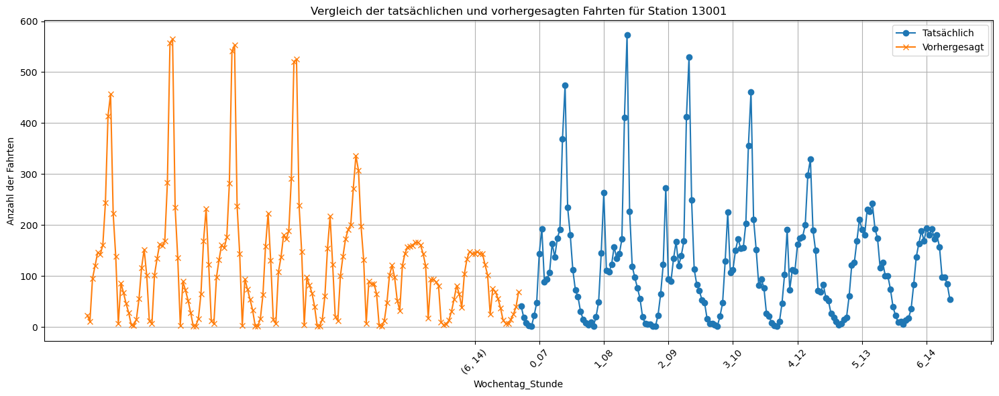

In [51]:

# Angenommen, station_id ist die ID der Station, die du analysieren möchtest
station_id = '13001'

# Tatsächliche Daten vorbereiten und sortieren
actual_data = df[df['start_station_id'] == station_id]
actual_data['weekday_hour'] = actual_data['weekday'].astype(str) + "_" + actual_data['hour'].astype(str).str.zfill(2)
actual_counts = actual_data.groupby('weekday_hour').size()
actual_counts.index = actual_counts.index.astype(str)  # Konvertiere den Index in Strings
actual_counts.sort_index(inplace=True)

# Vorhergesagte Daten vorbereiten und sortieren
predicted_data = detailed_forecasts[station_id]
predicted_df = pd.DataFrame(list(predicted_data.items()), columns=['weekday_hour', 'forecast'])
predicted_df['weekday_hour'] = predicted_df['weekday_hour'].astype(str)  # Stelle sicher, dass der Index ein String ist
predicted_df.set_index('weekday_hour', inplace=True)
predicted_df.sort_index(inplace=True)

# Beide Datensätze in einem DataFrame zusammenführen
comparison_df = pd.DataFrame({'actual': actual_counts, 'predicted': predicted_df['forecast']})
comparison_df.sort_index(inplace=True)

# Schaubild erstellen
plt.figure(figsize=(15, 6))
comparison_df['actual'].plot(label='Tatsächlich', marker='o')
comparison_df['predicted'].plot(label='Vorhergesagt', marker='x')
plt.title(f'Vergleich der tatsächlichen und vorhergesagten Fahrten für Station {station_id}')
plt.xlabel('Wochentag_Stunde')
plt.ylabel('Anzahl der Fahrten')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



In [29]:
import pandas as pd
from prophet import Prophet

# Vorbereitung der Daten
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek

# Erstellen des Demand Patterns für jedes Cluster
demand_patterns = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    hourly_counts = cluster_data.groupby(['weekday', 'hour']).size()
    total_rides = hourly_counts.sum()
    demand_pattern = hourly_counts / total_rides
    demand_patterns[cluster_id] = demand_pattern

# Vorhersage für jede Station unter Berücksichtigung des Demand Patterns
station_forecasts = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    station_ids = cluster_data['start_station_id'].unique()
    
    for station_id in station_ids:
        station_data = cluster_data[cluster_data['start_station_id'] == station_id]
        weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='count')
        weekly_data.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)

        # Prophet-Modell für jede Station
        model = Prophet()
        model.fit(weekly_data[['ds', 'y']])
        
        # Vorhersage für die nächsten 1 Woche
        future = model.make_future_dataframe(periods=1, freq='W')
        forecast = model.predict(future)
        weekly_total_forecast = forecast.iloc[-1]['yhat']

        # Verwendung des Demand Patterns des Clusters
        demand_pattern = demand_patterns[cluster_id]
        station_forecast = {}
        for (weekday, hour), proportion in demand_pattern.iteritems():
            forecast_value = weekly_total_forecast * proportion
            station_forecast[(weekday, hour)] = round(forecast_value)

        station_forecasts[station_id] = station_forecast


11:02:04 - cmdstanpy - INFO - Chain [1] start processing
11:02:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/973769342.py:42: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (weekday, hour), proportion in demand_pattern.iteritems():
11:02:04 - cmdstanpy - INFO - Chain [1] start processing
11:02:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/973769342.py:42: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (weekday, hour), proportion in demand_pattern.iteritems():
11:02:04 - cmdstanpy - INFO - Chain [1] start processing
11:02:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_14983/973769342.py:42: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1335/280030142.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1335/280030142.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actual_data['hour'] = actual_data['started_at'].dt.floor('H')
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1335/280030142.py:22: SettingWithCopyWarning: 
A value is trying to be set 

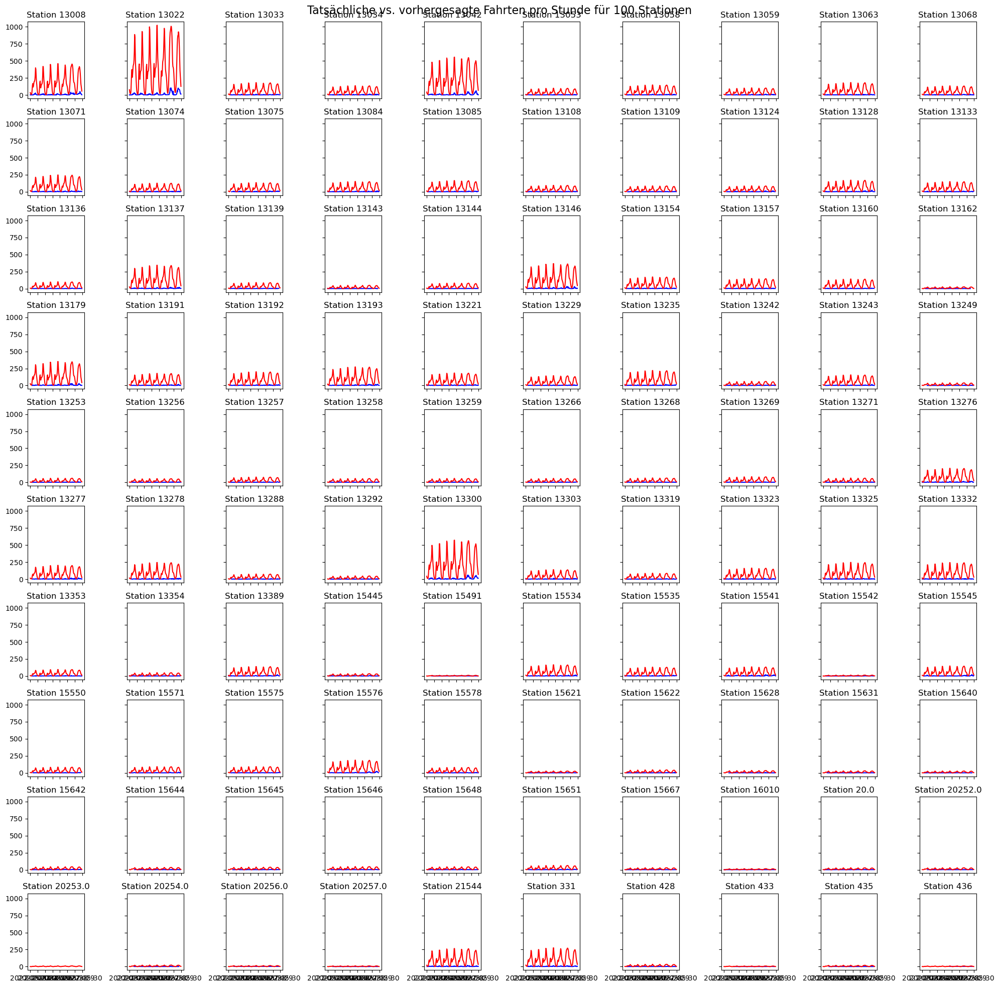

In [137]:
import matplotlib.pyplot as plt
import pandas as pd

# Startdatum der Vorhersageperiode festlegen
start_date = pd.to_datetime('2022-05-23')

# Die ersten 100 Stationen auswählen (oder jede gewünschte Anzahl)
selected_station_ids = list(station_forecasts.keys())[:100]

# Grid-Größe festlegen (z.B. 10x10 für 100 Stationen)
n_rows = 10
n_cols = 10
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20), sharex=True, sharey=True)

for i, station_id in enumerate(selected_station_ids):
    ax = axes[i // n_cols, i % n_cols]

    # Tatsächliche Daten für die Station
    actual_data = df[(df['start_station_id'] == station_id) & 
                     (df['started_at'] >= start_date) & 
                     (df['started_at'] < start_date + pd.DateOffset(days=7))]
    actual_data['hour'] = actual_data['started_at'].dt.floor('H')
    actual_rides = actual_data.groupby('hour').size().reset_index(name='actual_rides')

    # Vorhergesagte Daten für die Station
    station_forecast = station_forecasts[station_id]
    forecast_list = [{'datetime': start_date + pd.DateOffset(days=day, hours=hour), 'forecast': value}
                     for (day, hour), value in station_forecast.items()]
    forecast_df = pd.DataFrame(forecast_list)

    # Plots für die Station
    ax.plot(actual_rides['hour'], actual_rides['actual_rides'], label='Tatsächliche Fahrten', color='blue')
    ax.plot(forecast_df['datetime'], forecast_df['forecast'], label='Vorhergesagte Fahrten', color='red')
    ax.set_title(f'Station {station_id}')

# Allgemeine Anpassungen und Titel setzen
fig.suptitle('Tatsächliche vs. vorhergesagte Fahrten pro Stunde für 100 Stationen', fontsize=16)
plt.tight_layout()
plt.show()


In [32]:
# Überprüfen Sie, ob der Multiplikator angemessene Variabilität zeigt
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    station_multiplier = cluster_data.groupby('start_station_id')['ride_id'].count() / cluster_data['ride_id'].count()
    print(f"Multiplikator für Cluster {cluster_id}:")
    print(station_multiplier)


Multiplikator für Cluster 2:
start_station_id
13008           0.014237
13022           0.031720
13033           0.005583
13034           0.004198
13042           0.017203
                  ...   
WL-008          0.003480
chargingstx0    0.001077
chargingstx1    0.004922
chargingstx3    0.003926
chargingstx5    0.002717
Name: ride_id, Length: 231, dtype: float64
Multiplikator für Cluster 3:
start_station_id
13017            0.015981
13045            0.027768
13061            0.025759
13089            0.003293
13091            0.001659
                   ...   
TA1309000027     0.009943
TA1309000063     0.007571
WL-011           0.009704
chargingstx06    0.000440
chargingstx07    0.000686
Name: ride_id, Length: 162, dtype: float64
Multiplikator für Cluster 0:
start_station_id
021320          0.000647
13001           0.028426
13006           0.009263
13011           0.027279
13016           0.029348
                  ...   
TA1309000011    0.007006
TA1309000064    0.013007
TA1309000066   

In [49]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

actuals_data = df.copy()
actuals_data['started_at'] = pd.to_datetime(actuals_data['started_at'])

mae_values = []
rmse_values = []

# Angenommen, station_forecasts enthält Vorhersagen und actuals_data enthält tatsächliche Fahrten
for station_id in station_forecasts.keys():
    # Annahme: 'actuals_data' enthält die tatsächlichen Fahrtdaten für jede Station
    station_actuals = actuals_data[actuals_data['start_station_id'] == station_id]
    station_actuals_resampled = station_actuals.resample('H', on='started_at').size()

    predictions = list(station_forecasts[station_id].values())

    common_length = min(len(station_actuals_resampled), len(predictions))
    actuals_trimmed = station_actuals_resampled.iloc[:common_length]
    predictions_trimmed = predictions[:common_length]

    # Berechnen der Fehlermetriken für die Station und Hinzufügen zur Liste
    mae = mean_absolute_error(actuals_trimmed, predictions_trimmed)
    rmse = np.sqrt(mean_squared_error(actuals_trimmed, predictions_trimmed))

    mae_values.append(mae)
    rmse_values.append(rmse)

# Berechnen der durchschnittlichen Fehlermetriken über alle Stationen
overall_mae = np.mean(mae_values)
overall_rmse = np.mean(rmse_values)

print(f"Gesamt-MAE: {overall_mae}")
print(f"Gesamt-RMSE: {overall_rmse}")


Gesamt-MAE: 34.754556488383834
Gesamt-RMSE: 44.73805092582149


In [24]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Vorhersagen für den Testzeitraum extrahieren
predictions = forecast[-test_days:]['yhat'].values

# Tatsächliche Werte
actuals = test_df['y'].values

# Berechnung von MAE und RMSE
mae = mean_absolute_error(actuals, predictions)
rmse = np.sqrt(mean_squared_error(actuals, predictions))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")


NameError: name 'test_days' is not defined

In [28]:
# Sicherstellen, dass df eine eigenständige Kopie ist, nicht eine Ansicht
df = df.copy()


# Für jedes Cluster wiederholen
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]

    # Konvertierung von 'started_at' zu datetime (falls noch nicht geschehen)
    cluster_data['started_at'] = pd.to_datetime(cluster_data['started_at'])

    # Extraktion von Stunde und Wochentag
    cluster_data['hour'] = cluster_data['started_at'].dt.hour
    cluster_data['weekday'] = cluster_data['started_at'].dt.dayofweek

    # Erstellen einer 'weekday_hour' Spalte
    cluster_data['weekday_hour'] = cluster_data['weekday'].astype(str) + "_" + cluster_data['hour'].astype(str).str.zfill(2)

    # Erstellen des Pivot-Tables
    pivot_df = cluster_data.pivot_table(index='start_station_id', 
                                        columns='weekday_hour', 
                                        values='ride_id', 
                                        aggfunc='count', 
                                        fill_value=0).reset_index()

    # Um die Spalten in chronologischer Reihenfolge zu sortieren
    sorted_columns = ['start_station_id'] + sorted([col for col in pivot_df.columns if col != 'start_station_id'])
    pivot_df = pivot_df[sorted_columns]

    features = pivot_df.drop('start_station_id', axis=1)
    
    # Skalierung der Daten
    scaler = StandardScaler()
    scaled_features_rowwise = np.vstack(features.apply(lambda row: scaler.fit_transform(row.values.reshape(-1, 1)).flatten(), axis=1))
    
    # Hier könnten Sie scaled_features_rowwise für weitere Analysen verwenden, 
    # zum Beispiel als Eingabe für ein Vorhersagemodell oder zur Visualisierung


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_7427/1543140658.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['started_at'] = pd.to_datetime(cluster_data['started_at'])
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_7427/1543140658.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['hour'] = cluster_data['started_at'].dt.hour
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_7427/1543140658.py:14: SettingWithCopyWarning: 
A value is trying t

In [30]:
# Nehmen wir an, 'forecast_weekly' hat die Vorhersage 'yhat' für das gesamte Cluster
weekly_total_forecast = forecast_weekly['yhat'].sum()  # Gesamte wöchentliche Vorhersage für das Cluster

# Nehmen wir an, 'scaled_features_rowwise' repräsentiert das Demand Pattern pro Stunde und Wochentag für das Cluster
# Jetzt verteilen wir die wöchentliche Vorhersage auf die stündlichen Intervalle basierend auf dem Demand Pattern
hourly_forecast = weekly_total_forecast * scaled_features_rowwise
# Hier sollten Sie die Größe von 'hourly_forecast' anpassen, sodass sie der Anzahl der Stunden in einer Woche entspricht


In [32]:
# Umwandlung der Series in einen DataFrame, wenn noch nicht geschehen
if isinstance(station_multiplier, pd.Series):
    station_multiplier = station_multiplier.reset_index()
    station_multiplier.columns = ['start_station_id', 'multiplier']


In [33]:
for index, multiplier_row in station_multiplier.iterrows():
    station_id = multiplier_row['start_station_id']
    station_multiplier_value = multiplier_row['multiplier']
    # Ihre Logik hier...


In [34]:

    # Anwenden des Multiplikators auf die stündliche Vorhersage
    station_hourly_forecast = hourly_forecast * station_multiplier_value

    # 'station_hourly_forecast' enthält jetzt die vorhergesagten Fahrten pro Stunde für diese spezifische Station


In [35]:
station_hourly_forecast

array([[-1476538.75366092, -1539187.70191576, -1507863.22778834, ...,
         -975347.16762221,    27036.00445521,   -35612.94379963],
       [-1713882.75257497,  -478121.79792864, -1713882.75257497, ...,
          757639.15671769,  -478121.79792864,  -478121.79792864],
       [-1753141.1837543 , -1795114.63663597, -1963008.44816268, ...,
         -368017.23865898, -1417353.56070089, -1543273.91934591],
       ...,
       [-2399271.45858924, -2438804.37395242, -2320205.62786288, ...,
        -1134218.16696745, -1806277.72814153, -2162073.96641016],
       [-2041721.35011945, -2041721.35011945, -2041721.35011945, ...,
         -960810.04711504,   120101.25588938, -1321113.81478317],
       [-2071335.17844702, -1748828.86706695, -2071335.17844702, ...,
          508715.31259357,  2121246.86949394, -1426322.55568687]])

In [40]:
import matplotlib.pyplot as plt

# Angenommen, station_hourly_forecast ist ein DataFrame, der Vorhersagen für alle Stationen enthält
# und Sie haben eine Spalte 'start_station_id' für die Stations-ID und 'predicted_rides' für die Anzahl der Fahrten

# Extrahieren Sie die Vorhersagedaten für die gewählte Station
selected_station_id = '13008'
selected_station_forecast = station_hourly_forecast[station_hourly_forecast['start_station_id'] == selected_station_id]

# Erstellen Sie eine Zeitachse für die Vorhersage
start_date = pd.to_datetime('2020-01-01')  # Startdatum der Vorhersage
time_index = pd.date_range(start=start_date, periods=len(selected_station_forecast), freq='H')  # 'H' für stündlich

# Wenn station_hourly_forecast ein numpy.ndarray ist, müssen wir es wahrscheinlich in einen DataFrame konvertieren
# Aber wenn es bereits ein DataFrame ist, finden wir direkt die Vorhersage für die Station

# Beispiel, wenn station_hourly_forecast ein DataFrame ist
if isinstance(station_hourly_forecast, pd.DataFrame):
    selected_station_forecast = station_hourly_forecast[station_hourly_forecast['start_station_id'] == selected_station_id]
else:
    None
    # Konvertieren oder Handhaben von numpy.ndarray nach Bedarf
    # Dies hängt von der Struktur Ihrer Daten und dem, wie sie generiert wurden, ab

# Zeitachse generieren, hier müssen wir wissen, wie die Daten organisiert sind, um dies korrekt zu tun
# start_date = pd.to_datetime('2020-01-01')  # Dies ist ein Platzhalter und sollte Ihrer Datenstruktur entsprechen
# time_index = pd.date_range(start=start_date, periods=len(selected_station_forecast), freq='H')


# Plot erstellen
plt.figure(figsize=(10, 6))  # Größe des Plots festlegen
plt.plot(time_index, selected_station_forecast['predicted_rides'], label='Vorhergesagte Fahrten')  # Verwenden Sie die vorhergesagten Fahrten
plt.title(f'Vorhergesagte Fahrten pro Stunde für Station {selected_station_id}')  # Titel des Plots setzen
plt.xlabel('Zeit')  # X-Achsen-Beschriftung
plt.ylabel('Anzahl der Fahrten')  # Y-Achsen-Beschriftung
plt.legend()  # Legende anzeigen
plt.grid(True)  # Rasterlinien anzeigen
plt.show()  # Plot anzeigen




IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [11]:
import pandas as pd
from prophet import Prophet

# Angenommen, df ist Ihr ursprünglicher DataFrame und enthält eine Spalte 'started_at' für den Startzeitpunkt der Fahrt
# und eine Spalte 'cluster' für die Cluster-Zuordnung

# Konvertieren Sie 'started_at' in ein datetime Format
df['started_at'] = pd.to_datetime(df['started_at'])

# Erstellen Sie einen neuen DataFrame für ein spezifisches Cluster (z.B. Cluster 2)
cluster_2_df = df[df['cluster'] == 2]

# Aggregieren der Daten, um die tägliche Anzahl der Fahrten pro Cluster zu zählen
cluster_2_daily_rides = cluster_2_df.resample('D', on='started_at').size().reset_index(name='count')

# Umbenennen der Spalten für Prophet
cluster_2_daily_rides.rename(columns={'started_at': 'ds', 'count': 'y'}, inplace=True)


In [12]:
import pandas as pd
from prophet import Prophet

# Angenommen, `cluster_2_daily_rides` ist Ihr ursprünglicher DataFrame
cluster_2_daily_rides['ds'] = pd.to_datetime(cluster_2_daily_rides['ds'])
cluster_2_daily_rides.set_index('ds', inplace=True)

# Aggregation auf Wochenbasis
weekly_rides = cluster_2_daily_rides.resample('W').sum().reset_index()

# Vorbereitung der Daten für Prophet (die 'y'-Spalte muss die Zielvariable sein, hier als Summe)
weekly_rides = weekly_rides.rename(columns={'count': 'y'})  # Ersetzen Sie 'count' durch den Namen Ihrer Zielvariablen

# Prophet Modell
model = Prophet()
model.fit(weekly_rides[['ds', 'y']])

# Vorhersage für die nächsten N Wochen (angenommen N=4)
future_weeks = model.make_future_dataframe(periods=4, freq='W')
forecast_weekly = model.predict(future_weeks)


10:52:13 - cmdstanpy - INFO - Chain [1] start processing


10:52:14 - cmdstanpy - INFO - Chain [1] done processing


In [26]:
# Beispiel für die Berechnung des stations-spezifischen Multiplikators
average_rides_per_station = df.groupby('start_station_id')['ride_id'].count().mean()
station_multiplier = df.groupby('start_station_id')['ride_id'].count() / average_rides_per_station

# Beispiel für die Kombination der Vorhersagen, Demand Patterns und Multiplikatoren
# Angenommen, 'weekly_rides_forecast' ist die Vorhersage der Gesamtfahrten für ein Cluster
# Angenommen, 'demand_pattern' ist ein DataFrame, der das stündliche Demand Pattern pro Wochentag zeigt
# 'station_multiplier' ist ein Series-Objekt, das den Multiplikator für jede Station enthält

# Hier müssen Sie die Logik implementieren, um die Vorhersagen auf Stundenbasis unter Verwendung des Demand Patterns zu verteilen
# und dann den stations-spezifischen Multiplikator anzuwenden

# Beispielhaft zeigen, wie das in einem sehr vereinfachten Szenario aussehen könnte
for index, row in weekly_rides_forecast.iterrows():
    weekly_total = row['y']  # Die gesamte Anzahl der prognostizierten Fahrten für die Woche
    # Verteilen Sie diese basierend auf dem Demand Pattern und wenden Sie dann den Multiplikator für jede Station an
    for station_id, multiplier in station_multiplier.items():
        # Berechnen Sie die prognostizierten Fahrten für jede Stunde und jeden Wochentag für die Station
        station_hourly_forecast = (weekly_total * demand_pattern * multiplier).sum()  # Vereinfachtes Beispiel


NameError: name 'weekly_rides_forecast' is not defined

In [24]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# SARIMAX-Modell auf wöchentlichen Daten anpassen
# Hier müssen wir 'ds' nicht als Index setzen, da wir nicht die resample-Methode verwenden
#weekly_rides.set_index('ds', inplace=True)
sarima_model = SARIMAX(weekly_rides['y'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
sarima_result = sarima_model.fit()

# Vorhersage für die nächsten 4 Wochen erstellen
# Vorhersage mit SARIMA für 7 Tage erstellen
sarima_forecast = sarima_result.get_forecast(steps=7)  # für 7 Tage
sarima_predicted_mean = sarima_forecast.predicted_mean



/Users/mariu/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/Users/mariu/anaconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.11503D+00    |proj g|=  2.01025D-01

At iterate    5    f=  9.07294D+00    |proj g|=  9.00668D-02

At iterate   10    f=  9.04696D+00    |proj g|=  5.53673D-02

At iterate   15    f=  9.03541D+00    |proj g|=  9.87745D-03

At iterate   20    f=  9.03510D+00    |proj g|=  1.07411D-04

At iterate   25    f=  9.03510D+00    |proj g|=  5.68376D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     31      1     0     0   

In [25]:
# Jetzt die Metriken berechnen, wobei sichergestellt wird, dass die Anzahl der Datenpunkte übereinstimmt
prophet_mae = mean_absolute_error(actuals, prophet_forecast)
sarima_mae = mean_absolute_error(actuals, sarima_predicted_mean)

prophet_rmse = mean_squared_error(actuals, prophet_forecast, squared=False)
sarima_rmse = mean_squared_error(actuals, sarima_predicted_mean, squared=False)

print(f"Prophet MAE: {prophet_mae}, SARIMA MAE: {sarima_mae}")
print(f"Prophet RMSE: {prophet_rmse}, SARIMA RMSE: {sarima_rmse}")


Prophet MAE: 2482.560266292679, SARIMA MAE: 25537.35269961338
Prophet RMSE: 3583.5585531935353, SARIMA RMSE: 25782.574354247907


In [21]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Angenommen, wir haben echte Testdaten in 'actuals' für die entsprechenden Zeiträume
# Prophet-Vorhersagen extrahieren
prophet_forecast = forecast_weekly['yhat'][-28:]  # Angenommen, die letzten 28 Tage

# Berechnung der Metriken
prophet_mae = mean_absolute_error(actuals, prophet_forecast)
sarima_mae = mean_absolute_error(actuals, sarima_predicted_mean)

prophet_rmse = mean_squared_error(actuals, prophet_forecast, squared=False)
sarima_rmse = mean_squared_error(actuals, sarima_predicted_mean, squared=False)

print(f"Prophet MAE: {prophet_mae}, SARIMA MAE: {sarima_mae}")
print(f"Prophet RMSE: {prophet_rmse}, SARIMA RMSE: {sarima_rmse}")


ValueError: Found input variables with inconsistent numbers of samples: [7, 28]

In [16]:


# Konvertieren Sie 'started_at' zu datetime, falls noch nicht geschehen
df['started_at'] = pd.to_datetime(df['started_at'])

# Fügen Sie Spalten für den Wochentag und die Stunde hinzu
df['weekday'] = df['started_at'].dt.dayofweek  # Montag=0, Sonntag=6
df['hour'] = df['started_at'].dt.hour

# Berechnen Sie das Demand Pattern für jedes Cluster
demand_pattern = df.groupby(['cluster', 'weekday', 'hour']).size().reset_index(name='count')

# Berechnen Sie die normalisierten Werte für das Demand Pattern
# Hierzu können Sie die Gesamtanzahl der Fahrten pro Cluster durch die Anzahl der Fahrten in der spezifischen Stunde und dem Wochentag teilen
total_rides_per_cluster = demand_pattern.groupby('cluster')['count'].transform('sum')
demand_pattern['normalized_value'] = demand_pattern['count'] / total_rides_per_cluster

# Jetzt haben Sie ein DataFrame `demand_pattern` mit den Spalten 'cluster', 'weekday', 'hour' und 'normalized_value',
# das das Demand Pattern auf einer normalisierten Basis darstellt.
